In [3]:
import time
import numpy as np

# Audio utils

In [4]:
from abc import abstractmethod

In [5]:
class FeatureModule(object):
    
    def __init__(self, sample_rate, hop_length, num_channels=1, decibels=True):
        self.sample_rate = sample_rate
        self.hop_length = hop_length
        self.num_channels = num_channels
        self.decibels = decibels
        
    def get_expected_frames(self, audio):
         # Simply the number of hops plus one
        num_frames = 1 + len(audio) // self.hop_length
        return num_frames
    
    def get_sample_range(self, num_frames):
         # Calculate the boundaries
        max_samples = num_frames * self.hop_length - 1
        min_samples = max(1, max_samples - self.hop_length + 1)

        # Construct an array ranging between the minimum and maximum number of samples
        sample_range = np.arange(min_samples, max_samples + 1)
        return sample_range
    
    @abstractmethod
    def process_audio(self, audio):
        return NotImplementedError
    
    def to_decibels(self, feats):
        feats = librosa.core.amplitude_to_db(feats, ref=np.max)
        return feats

    def post_proc(self, feats):
        if self.decibels:
            # Convert to decibels (dB)
            feats = self.to_decibels(feats)

            # TODO - make additional variable for 0/1 scaling
            # Assuming range of -80 to 0 dB, scale between 0 and 1
            feats = feats / 80
            feats = feats + 1
        else:
            # TODO - should anything be done here? - would I ever not want decibels?
            pass

        # Add a channel dimension
        feats = np.expand_dims(feats, axis=0)
        return feats
    
    def get_times(self, audio):
        num_frames = self.get_expected_frames(audio)

        frame_idcs = np.arange(num_frames + 1)
        # Obtain the time of the first sample of each frame
        times = librosa.frames_to_time(frames=frame_idcs,
                                       sr=self.sample_rate,
                                       hop_length=self.hop_length)
        return times
    
    def get_sample_rate(self):
        sample_rate = self.sample_rate
        return sample_rate

    def get_hop_length(self):
        hop_length = self.hop_length
        return hop_length

    def get_num_channels(self):
        num_channels = self.num_channels
        return num_channels

    @classmethod
    def features_name(cls):
         return cls.__name__

## patch madmom import error with sed

In [6]:
from madmom.audio.signal import SignalProcessor, FramedSignalProcessor
from madmom.audio.stft import ShortTimeFourierTransformProcessor
from madmom.audio.spectrogram import (
    FilteredSpectrogramProcessor, LogarithmicSpectrogramProcessor,
    SpectrogramDifferenceProcessor)
from madmom.processors import ParallelProcessor, SequentialProcessor

In [7]:
class LOG_SPECT(FeatureModule):
    def __init__(self, num_channels=1, sample_rate=22050, win_length=2048, hop_size=512, n_bands=[12], mode='online'):
        sig = SignalProcessor(num_channels=num_channels, win_length=win_length, sample_rate=sample_rate)
        self.sample_rate = sample_rate
        self.hop_length = hop_size
        self.num_channels = num_channels
        multi = ParallelProcessor([])
        frame_sizes = [win_length]  
        num_bands = n_bands  
        for frame_size, num_bands in zip(frame_sizes, num_bands):
            if mode == 'online' or mode == 'offline':
                frames = FramedSignalProcessor(frame_size=frame_size, hop_size=hop_size) 
            else:   # for real-time and streaming modes 
                frames = FramedSignalProcessor(frame_size=frame_size, hop_size=hop_size, num_frames=4) 
            stft = ShortTimeFourierTransformProcessor()  # caching FFT window
            filt = FilteredSpectrogramProcessor(
                num_bands=num_bands, fmin=30, fmax=17000, norm_filters=True)
            spec = LogarithmicSpectrogramProcessor(mul=1, add=1)
            diff = SpectrogramDifferenceProcessor(
                diff_ratio=0.5, positive_diffs=True, stack_diffs=np.hstack)
            # process each frame size with spec and diff sequentially
            multi.append(SequentialProcessor((frames, stft, filt, spec, diff)))
        # stack the features and processes everything sequentially
        self.pipe = SequentialProcessor((sig, multi, np.hstack))

    def process_audio(self, audio):
        feats = self.pipe(audio)
        return feats.T

# Beatmap utils

In [8]:
import re
import os
import torch
import math
import scipy.io.wavfile as wav
import subprocess

In [9]:
class Beatmap():    
    
    def __init__(self, beatmap_dir, beatmap, proc, sample_rate=22050, tmp='./wav/', 
                 peak_type='gaussian', hop_size=512, width=4):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.proc = proc
        self.tmp = tmp
        self.wavf = None
        self.audiof = None
        self.rate = int(sample_rate / hop_size)
        self.w = width
    
        self.timestamp = []
        self.beat_len = []
        self.hitobjects = []
        self.frames = None
        self.beats = None
        self.m = None
        self.hitstream = None
        self.hits = None
        
        peaks = {
            'gaussian': self.create_gaussian_peak, 
            'linear': self.create_linear_peak, 
            'parabolic': self.create_parabolic_peak
        }
        self.create_peak = peaks[peak_type]
        
    def parse_audiof(self):
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'AudioFilename.*', l):
                    self.audiof = re.search('AudioFilename:\s*(.*)', l).group(1)
        
        if not os.path.exists(self.audiof):
            for f in os.listdir(self.beatmap_dir):
                if re.match(self.audiof, f, flags=re.IGNORECASE):
                    self.audiof = f
        
    def get_audiof(self):
        if self.audiof == None:
            self.parse_audiof()
        return self.audiof
        
    def parse_ids(self):
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'BeatmapID.*',  l):
                self.BeatmapID = re.search('BeatmapID:\s*(\d+).*', l).group(1)
            if re.match(r'BeatmapSetID.*', l):
                self.BeatmapSetID = re.search('BeatmapSetID:\s*(\d+).*', l).group(1)
        if 'BeatmapSetID' not in locals():
            self.BeatmapSetID = self.beatmap_dir.split('/')[-1].split(' ')[0]
        if 'BeatmapID' not in locals():
            self.BeatmapID = self.beatmap_dir.split('/')[-1].split(' ')[0]
        f.close()
            
    def parse_wav(self):
        self.parse_ids();
        self.wavf = str(self.BeatmapSetID) + '-' + str(self.BeatmapID) + '.wav'
        
    def create_wav(self):
        self.parse_wav()
        mp3 = os.path.join(self.beatmap_dir, self.get_audiof())
        wav = os.path.join(self.tmp, self.wavf)
        subprocess.call(['ffmpeg', '-hide_banner', '-loglevel', 'error', '-y', 
                         '-i', mp3, '-ar', str(self.sample_rate), wav])
        
    def get_wav(self):
        if self.wavf == None:
            self.parse_wav()
            if not os.path.exists(os.path.join(self.tmp, self.wavf)):
                self.create_wav()
        return self.wavf

    def parse_timings(self):
        rate, audio_data = wav.read(os.path.join(self.tmp, self.get_wav()))
        audio_len = np.shape(audio_data)[0]
        self.beat_len = []
        self.timestamp = []
        
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'BeatDivisor.*', l):
                    self.BeatDivisor = re.search('BeatDivisor:\s*(\d+).*', l).group(1)
                    self.BeatDivisor = int(self.BeatDivisor)
                    break
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0])) 
        self.timestamp.append(int(audio_len / rate * 1000))
        f.close()
        
    def parse_hitobjects(self):
        self.hitobjects = []
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'ApproachRate.*', l):
                    AR = float(l.split(':')[1])
                    if AR < 5.0:
                        preempt = 1200 + 600 * (5 - AR) / 5
                        fadein = 800 + 400 * (5 - AR) / 5
                    else:
                        preempt = 1200 - 750 * (AR - 5) / 5
                        fadein = 800 - 500 * (AR - 5) / 5
                    self.preempt = preempt - fadein*0.1
                    break
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'SliderMultiplier.*', l):
                    self.sliderMultiplier = float(l.split(':')[1])
                    break
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
        
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
    
    def process_audio(self):
        feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
        feats = torch.tensor(feats)
        self.frames = torch.transpose(feats, 0, 1)
        
    def create_gaussian_peak(self, y, i):
        alen = len(y)
        w = self.w/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1
            
    def create_parabolic_peak(self, y, i):
        alen = len(y)
        limit = self.w*2
        w = self.w

        def func(x):
            return -(1/w**2 * x**2) + 1

        j = 0        
        while i+j > 0 and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1
            
    def create_linear_peak(self, y, i):
        alen = len(y)
        w = self.w/2
        m = 1/w
        limit = w
        
        def func(x):
            return m*x + 1
        
        j=0
        while i+j > 0 and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        m = -m
        j = 0
        while i+j < alen and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1  
    
    def process_beats(self):
        if len(self.timestamp) == 0:
            self.parse_beatmap()
        self.beats = np.zeros(math.ceil(self.timestamp[-1] * 0.001 * self.rate), dtype=np.float32)
        
        i = self.timestamp[0] * 0.001 * self.rate
        while i > 0:
            x = round(i)
            self.create_peak(self.beats, x)
            i -= self.beat_len[0] * 0.001 * self.rate
        for j in range(len(self.timestamp) - 1):
            i = self.timestamp[j] * 0.001 * self.rate
            while i < (self.timestamp[j+1] * 0.001 * self.rate):
                x = round(i)
                self.create_peak(self.beats, x)
                i += self.beat_len[j] * 0.001 * self.rate
            if i >= self.timestamp[-1] * 0.001 * self.rate:
                break
                
    def process_hitobjects(self):
        global debug
        if len(self.hitobjects) == 0:
            self.parse_beatmap()
        self.hitstream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
        
        sr = 1.0/self.rate * 1000
        time = 0.0
        i = 0
        k = 0
        self.hitstream[k] = []
        while i != len(self.hitobjects):
            if float(self.hitobjects[i][2]) < time:
                i += 1
                continue
            j = i
            while j < len(self.hitobjects):
                if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
                    break
                hit_type = int(self.hitobjects[j][3]) & 0b0011
                self.hitstream[k].append(hit_type)
                j += 1
            
            time += sr
            debug = self.hitstream
            k += 1
            self.hitstream[k] = []
    
    def process_hits(self):
        if len(self.hitobjects) == 0:
            self.parse_beatmap()
        self.hits = np.zeros(math.ceil(self.timestamp[-1] * 0.001 * self.rate), dtype=np.float32)
        
        for h in self.hitobjects:
            x = round(float(h[2]) * 0.001 * self.rate)
            self.create_peak(self.hits, x)
            
            if int(h[3]) & 2 == 2:
                slider_rate = None
                length = None
                for i in range(len(self.timestamp)-1, 0-1, -1):
                    if slider_rate != None:
                        if self.beat_len[i] < 0.0:
                            continue
                        length = self.beat_len[i]
                        break
                    if self.timestamp[i] < float(h[2]):
                        if self.beat_len[i] > 0.0:
                            slides = 100
                            slider_rate = self.beat_len[i]
                            break
                        else:
                            slides = self.beat_len[i] * -1
                if length == None:
                    length = self.beat_len[0]
                    slider_rate = 100
                length = float(length)
                y = round(float(h[7]) * length / (100/slider_rate * self.sliderMultiplier * 100.0) * 0.001 * self.rate)
                for i in range(1, int(h[6]) + 1):
                    if x + (y*i) > self.hits.shape[0]:
                        break
                    self.create_peak(self.hits, x+(y*i))
                    
    def get_audio(self):
        if self.frames == None:
            self.process_audio()
        return self.frames
    
    def get_hitobjects(self):
        if self.hitstream == None:
            self.process_hitobjects()
        stream = [None] * len(self.hitstream)
        for i in range(len(self.hitstream)):
            if self.hitstream[i] == [] or self.hitstream[i] == None:
                h = np.array([0])
            else:
                h = np.array(self.hitstream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 16 - h.shape[0])))
        return torch.stack(stream)
    
    def get_hits(self):
        if self.hits == None:
            self.process_hits()
        return torch.tensor(self.hits)
    
    def get_beats(self):
        if self.beats == None:
            self.process_beats()
        return torch.tensor(self.beats)
    
    def get_metadata(self):
        if self.BeatDivisor == None:
            self.parse_beatmap()
        return (self.beatmap, self.rate, self.BeatDivisor)
    
    def get_timings(self):
        if len(self.timestamp) == 0:
            self.parse_beatmap()
        return list(zip(self.timestamp, self.beat_len))

# Dataset

In [10]:
import glob
import copy
import gc
import concurrent.futures
import traceback
import torch
from torch.utils.data import Dataset

In [11]:
class Beatmap_Dataset(Dataset):  
    
    def __init__(self, beatmap_dir, proc, seq_dur=10, sample_rate=22050, hop_size=512, width=4, 
                 peak_type='gaussian', threads=4, threading=True):
        self.beatmap_dir = beatmap_dir
        self.proc = proc
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.beatmaps = []
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.width = width
        
        if beatmap_dir == None:
            self.a = []
            self.o = []
            self.b = []
            self.h = []
            self.t = []
            self.m = []
            return
        
        j = 0
        for r, dirs, _ in os.walk(beatmap_dir):
            for dir in dirs:
                for root, _, files in os.walk(os.path.join(r, dir)):
                    for f in files:
                        if re.match('.*.osu$', f):
                            self.beatmaps.append(Beatmap(root, f, proc, sample_rate=sample_rate, 
                                                         hop_size=hop_size, width=width, peak_type=peak_type))
                            j += 1
                                            
        self.a = [None] * j
        self.o = [None] * j
        self.b = [None] * j
        self.h = [None] * j
        self.t = [None] * j
        self.m = [None] * j

        def process(i):
            m = self.beatmaps[i]
            self.beatmaps[i] = None
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)            
                self.a[i] = copy.deepcopy(m.get_audio())
                self.o[i] = copy.deepcopy(m.get_hitobjects())
                self.b[i] = copy.deepcopy(m.get_beats())
                self.h[i] = copy.deepcopy(m.get_hits())
                self.t[i] = copy.deepcopy(m.get_timings())
                self.m[i] = copy.deepcopy(m.get_metadata())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)     
                self.a[i] = None
                self.o[i] = None
                self.b[i] = None
                self.h[i] = None
                self.t[i] = None
                self.m[i] = None
            del m
            #gc.collect()

        if threading:
            executor = concurrent.futures.ThreadPoolExecutor(threads)
            list(executor.map(process, range(j)))
        else:
            list(map(process, range(j)))
                        
        self.beatmaps = list(filter(None, self.beatmaps))
        self.a = list(filter(lambda x: x != None, self.a))
        self.o = list(filter(lambda x: x != None, self.o))
        self.b = list(filter(lambda x: x != None, self.b))
        self.h = list(filter(lambda x: x != None, self.h))
        self.t = list(filter(None, self.t))
        self.m = list(filter(None, self.m))
        
    def take(self, ds, i, j):
        self.a = ds.a[i:j]
        self.o = ds.o[i:j]
        self.b = ds.b[i:j]
        self.h = ds.h[i:j]
        self.m = ds.m[i:j]
        self.t = ds.t[i:j]
        
    def __len__(self):
        return len(self.a)
    
    def __getitem__(self, i):
        #if self.seq_len == 0:
        #    return self.x[i], self.y[i], self.j[i]
        #j = np.random.randint(0, self.y[i].shape[0] - self.seq_len)
        #return self.x[i][j: j+self.seq_len], self.y[i][j: j+self.seq_len], self.t[i][0], (self.m[i], i, j)
        if self.seq_len == 0:
            return None
        j = np.random.randint(0, self.a[i].shape[0] - self.seq_len)
        return self.a[i][j: j+self.seq_len], self.o[i][j: j+self.seq_len], self.b[i][j: j+self.seq_len], self.h[i][j: j+self.seq_len], self.t[i][0], (self.m[i], i, j)
    

# Constants

In [34]:
sample_rate = 44100
hop_size = 441 * 2
seq_dur = 10
peak_type = 'gaussian'
width = 4

beatmap_dir = '../beatmaps'
ds_path = './datasets/HN/ds_' + peak_type + '.pkl'
model_path = './models/HN/model01_' + peak_type + '.pt'

# Process Data

In [ ]:
start = time.time()

log_spect = LOG_SPECT(sample_rate=sample_rate, hop_size=hop_size, n_bands=[24], mode='offline')
ds = Beatmap_Dataset(beatmap_dir, log_spect, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width, threads=256, threading=True)

end = time.time()
print(end - start, 'secs')

0/1511 Chata - Engage (Lasse) [Insane].osu
1/1511 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
2/1511 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/1511 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/1511 StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
5/1511 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/1511 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/1511 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/1511 fripSide - future gazer (TV Size) (alacat) [Insane].osu
9/1511 cYsmix - bells! (Gero) [normal!].osu
10/1511 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
11/1511 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu
12/1511 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
13/151114/1511 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu
 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_26981/3628944076.py", line 283, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_26981/3628944076.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_26981/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
 

187/1511188/1511 Atoguru - Itoshi Kimi wo Mitsuke ni (Pizza Kun) [Insane].osu
189/1511 190/1511 Hatsune Miku - Ephemeral (Wishkey) [Fade Away].osuHanasaka Yui(CV M.A.O) - Harumachi Clover (Naotoshi) [Light Insane].osu
 eyemedia - Bloody Purity (tsuka) [Normal].osu

191/1511192/1511 Suzuki Konomi - This game (TV Size) (Sekai-nyan) [Nyquill's Insane Game].osu193/1511 Warak - REANIMATE (iyasine) [xsrs's Extra].osu
 emon - shake it! (kosiga) [Normal].osu

194/1511 Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu
195/1511 Kuroneko Dungeon - Ryoushi no Umi no Lindwurm (Crystal) [ak74's Insane].osu
196/1511 Feint - Reprise (Secretpipe) [Sieg's Light Insane].osu
197/1511 Umetora - Ifuudoudou (Nymph) [Insane].osu
198/1511 Hana - Kuukirikigaku Shoujo to Shounen no Uta (Soleily Remix) (Koiyuki) [Yuki].osu
199/1511 200/1511wowaka - Unknown Mother-Goose feat. Hatsune Miku (tutuhaha) [Insane].osu
201/1511202/1511 Silver Forest - PORUTA ~ gaisuto no himatsubushi (Eirene) [Norma

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: IOSYS - Hakurei Jinja (tieff) [Normal].osu
260/1511 Tamura Yukari - Songs Compilation (Milan-) [lolis].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: K2 - Karaburi Sadistic (Shinxyn) [Insane].osu
261/1511 LeaF - Alice in Misanthrope -Ensei Alice- (eiri-) [Uberzolik's Insane].osu
262/1511 Rita - dorchadas (Delis) [Mirash's Insane].osu
263/1511 Hatsuki Yura - Diabolikha (Lan wings) [Death].osu
264/1511 Miki Sayaka (CV Kitamura Eri), Sakura Kyoko (CV Nonaka Ai) - and I'm home (Kyuukai) [Sayaka].osu
265/1511 seleP - BELHALA (Bara-) [Perpetual Loneliness].osu
266/1511 Hatsuki Yura - Diabolikha (pkuai) [chart with upwards trend].osu
267/1511 DECO 27 feat. Hatsune Miku - Delusion Tax (Bluepurr) [Delusion].osu
268/1511 Jan Wayne Vs. Raindropz - Numb (Nightcore Ver.) (KIA) [SteRRuM's Insane].osu
269/1511 Nanahira - Bassdrop Freaks (Long Ver.) (yf_bmp) [BASSDROP!!].osu
270/1511 Mayama Rika - Liar Mask anime size (Aerous) [captin's Insane].osu
271/1511 Hanatan - RED Signal (Koalazy) [Insane].osu
272/1511 Tsukudani Norio - Atashi no Kamisama (Amateurre) [Shizuku's Insane].osu
273/1511 MowtenDoo - Blend W (Kalindraz) [Alex's Insane].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Gojou Kai - Touhou Youkai Komachi (James) [Normal].osu
293/1511 namirin - only my railgun (My Angel Rize) [Expert].osu
294/1511 xi - Happy End of the World (Kroytz) [The Final Hour].osu
295/1511 Lily - December 9th (spboxer3) [Sweetboxer].osu
296/1511 Diao Ye Zong feat. Meramipop - Kouma 'Un-demystified Fantasy' (ailv) [Scarlet Mist].osu
297/1511 Luo Tian Yi - Wo Yao Mai Mai Mai (CSGA-DarkArchon) [Insane].osu
298/1511 capitaro - Yoiduki Maiuta (Amamiya Yuko) [Insane].osu
299/1511300/1511 Hatsuki Yura - Salamandra no Odoriko (Irohas) [schoolboy's Insane].osu sasakure.UK - SeventH-HeaveN feat. Hatsune Miku (Yauxo) [Noz's Insane].osu

301/1511 Natsuiro Matsuri - Marigold (Ayucchi) [Bittersweet].osu
302/1511 Shimotsuki Haruka - Byakuya Gensoutan (Chaoslitz) [sahuang's Insane].osu
303/1511 a_hisa - Magic Logic Labyrinth (Muya) [Normal].osu
304/1511 NoboruP ft. Hatsune Miku - Shiroi Yuki No Princess Wa (Hokichi) [Zerkichi's Insane].osu
305/1511 SYNC.ART'S ft. Sakaue Nachi - Green Gr

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: nomico - Bad Apple!! (James) [Normal].osu
308/1511 Mitchie M - Viva Happy (Larissa) [Kyun].osu
309/1511 TeamSASAKURATION - AVALON (Leader) [gowww's Extra].osu
310/1511 TheFatRat ft. Laura Brehm - MAYDAY (Nightcore Mix) (Peter) [Collab Insane].osu
311/1511 Hatsuki Yura - TRICK or TREAT (ByBy13) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hanataba - Night of Knights (v2b) [Normal].osu
312/1511 Suzuki Konomi - Redo (Rizia) [xxdeathx's Insane].osu
313/1511 ClariS - Connect -TV Size- (Blastoise243) [^o^].osu
314/1511 S3RL - Well, That Was Awkward (DeRandom Otaku) [FCL's Insane].osu
315/1511 ryo(supercell) feat. Hatsune Miku - ODDS & ENDS (-Zeraora) [Resonating Voices of Absolution].osu
316/1511 Memme - Extreme Fantasy (AngelHoney) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Silver Forest - PORUTA ~ gaisuto no himatsubushi (Eirene) [Normal].osu
317/1511 Sakura Chiyo - URAOMOTE FORTUNE (Asterisk DnB Remix) (Asagi) [Extra].osu
318/1511 arcane753. - Kumo no Iru Numa (Lasse) [Petal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Masayoshi Minoshima ft. nomico - Bad Apple!! (Ephemeral) [Normal].osu
319/1511 cosMo@BousouP - Oceanus (Broccoly) [Fortune's Insane].osu
320/1511 ESTi - HELIX (Edit Ver.) (FreeSongs) [Normal].osu
321/1511 petit milady - Koi wa Milk Tea (Implyingx) [Doki].osu
322/1511 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [toybot's Insane].osu
323/1511 Arakawa Miho - Inochi no Karakui (BestLeesinEuw) [Normal].osu
324/1511 TMABird - Everybody's Circulation (Vncegd) [Insane].osu
325/1511 fripSide - sword of virgin (Short Ver.) (Gloria Guard) [Insane].osu
326/1511 Luka,Miku,Rin,IA & Gumi - Pomp and Circumstance (If you do do) (Hinanawi-sama) [Insane].osu
327/1511 dj TAKA - V -conclusion- (Su1fu7) [Insane].osu
328/1511 RD-Sounds feat. Meramipopnayuta - Shiten (Icekalt) [Duet].osu
329/1511 Tomatsu Haruka - courage (fuyuyu-) [Insane].osu
330/1511 Mako Niina - Sensen no Realism (Command DDOS) [everything is cruel].osu
331/1511 Omoi - Snow Drive (Hasiva) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Nightcore - Ravers Fantasy (LoweH) [deadbeat's Hard].osu
333/1511 P remixed by colate - Sweet Devil(colate remix) (syoutoku1) [Insane].osu
334/1511 LeaF - Wizdomiot (Asahina Momoko) [Normal].osu
335/1511 Nanahira - Petals (b00) [Fluorescence].osu
336/1511 capitaro - Karen Aikyou Hanasaka gumi (Tari) [Insane].osu
337/1511 XXme - escape (TV Size) (Hakura) [Log Off Alphakura's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (saymun) [Normal].osu
338/1511 Hatsune Miku - Triple Baka (Mafiamaster) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Megurine Luka - LukaLuka Night Fever (samipale) [Normal+].osu
339/1511 Trial & Error - Tokoyami no keiyaku KEGARETA-SHOUJO feat. GUMI (Short Ver.) (ailv) [Insane].osu
340/1511 t+pazolite - Pumpin' Junkies ([-Kafuu Chino-]) [Some cancer jumps].osu
341/1511 ginkiha - nightfall (Xilver) [Smoothie World's Insane].osu
342/1511 wowaka - World's End Dancehall (ROCKETMAN remix) (Skubi) [Until the World Ends].osu
343/1511 Hatsune Miku - Kipple Industry Inc. (BarkingMadDog) [Insane].osu
344/1511 Shikata Akiko - Tsukiyo no Ongakukai (Hey lululu) [Scub's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - World is Mine (tom800510) [Queen!!].osu
345/1511 Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu
346/1511 Horie Yui - True Truly Love (Thite) [Insane].osu
347/1511 M2U - Myosotis (bor) [Insane ft. sdafsf].osu
348/1511 Hatsune Miku - Uraomote Lovers (CCC-Re) [CCC-Re].osu
349/1511 xi - Happy End of the World (Liiraye) [Happy End].osu
350/1511 CHiCO with HoneyWorks - Ai no Scenario (HabiHolic) [Insane].osu
351/1511 DJ Noriken ft. Yukacco - Lucent (JAKAZiD Remix) (_ZaZa) [Lucent].osu
352/1511 MikitoP feat. Hatsune Miku - 39 Music! (Aureola) [Insane].osu
353/1511 Seiryu - BLUE DRAGON (Blue Dragon) [Tarrasky's Light Insane].osu
354/1511 Touhou Gensou Shiten 2Canon - Otenba Renjyo (cc09212100) [yet].osu
355/1511356/1511 LiSA - Rally Go Round (FrostxE) [Insane].osu
 Ariabl'eyeS - Senko no Furea (My Angel RangE) [Flare].osu
357/1511 Mili - Vitamins feat. world's end girlfriend (Present) [Reverberation].osu
358/1511 Meg & Dia - Monster (DotEXE Remix)(Nightcore Mix) 

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Natsumi Kiyoura - Tabi no Tochuu (Weinmagier) [Normal].osu
364/1511 xi - over the top (OSUtoto) [Insane].osu
365/1511 Shimotsuki Haruka, Nakae Mitsuki - mirage (Lasse) [Kalibe's Insane].osu
366/1511 Konuko - Toumei Elegy (Awaken) [G's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7829 is out of bounds for axis 0 with size 7829


pruning: Warak - REANIMATE (iyasine) [xsrs's Extra].osu
367/1511 dj TAKA - True Blue (Monstrata) [Halcyon].osu
368/1511 nameless - Milk Crown on Sonnetica (Len) [toybot's Insane].osu
369/1511 Various Artists - Ar3's eggpain maps project ([CSGA]Ar3sgice) [unfinished].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Jan Wayne Vs. Raindropz - Numb (Nightcore Ver.) (KIA) [SteRRuM's Insane].osu
370/1511 Nightcore - Pinball (jericho2442) [Ultimate's Craziness].osu
371/1511 Kanon Wakeshima - Love your enemies (Delis) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Triple Baka (Mafiamaster) [Insane].osu
372/1511 Hatsune Miku - Dou Iu Koto Nano! (Raging Bull) [Insane!].osu
373/1511 M2U - Moon Halo (Minorsonek) [Namki's Insane].osu
374/1511 senya - Hitomi ni Kakusareta Omoi (Satellite) [wring's Hard].osu
375/1511 Ito Kanako - Uncontrollable (TV Size) (Hakura) [LCFC's Insane].osu
376/1511 UNDEAD CORPORATION - Yoru Naku Usagi wa Yume o Miru (Smoothie) [Normal].osu
377/1511 dj TAKA - quaver (Sotarks) [Yukiyo's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: REDALiCE - Bad Apple!! (Rena-chan) [Insane].osu
378/1511 penoreri - Monochrome and Vivid (Nube) [Awake].osu
379/1511 Sharlo - Eisou Youga ~Meikyou Shisui~ (Sharlo) [FrostxE's Insane].osu
380/1511 HachioujiP feat. Hatsune Miku - take it easy (Seto Kousuke) [Insane].osu
381/1511 PinocchioP - I'm glad you're evil too (Monstrata) [Devious].osu382/1511
 Wisp X - Crimson feat. Hatsune Miku (Radio Edit) (Nao Tomori) [yaspo's insane].osu
383/1511 Aiobahn & Yunomi - Makuramoto Ni Ghost (- Yoshimaro -) [Bounce C].osu
384/1511 Haru - Skygazer (Instrumental) (Mukku) [Yes].osu
385/1511 Ceui - MeltyMoment short.ver (Down) [Left's Light Insane].osu
386/1511 Camellia_feat._Nanahira_-_Can_I_Friend_You_On_Bassbook_Lol_Cranky_Remix_-_Theya_-_Can_I_map_you_an_O.osu
387/1511 Yokomin - Yukari (Shiirn) [from Love to Grief].osu
388/1511 ~DJ YOSHITAKA~ - GalacticFlower (Mazukito) [Sakura].osu
389/1511 M2U - Masquerade (Melt) [Insane].osu
390/1511 ALiCE'S EMOTiON - Dark Flight Dreamer (Natsu) [Insane].

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Nekomimi Switch (Yes) [Relaxing].osu
417/1511 Yakushi Ruri - Ruri-iro (Imouto koko) [Tearstilla].osu
418/1511 Hatsuki Yura - Salamander no Odoriko ([CSGA]Ar3sgice) [Toto].osu
419/1511 Silver Forest - EXTRA BITTER (Pokie) [Normal].osu
420/1511 Nanahoshi Kangengakudan - Meikaruza (pkk) [Insane].osu
421/1511 Casandra - Freaks Romanticism (Ohwow) [Insane].osu
422/1511 AKINO from bless4 & CHiCO with HoneyWorks - MIIRO vs. Ai no Scenario (monstrata) [toybot's Insane].osu
423/1511 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
424/1511 O2i3 - TSLove (Fanteer) [Namki's Advanced].osu
425/1511 Nitta Emi - White Eternity (Soleily & Epsilon Remix) (Lasse) [Snowfall].osu
426/1511 kofunp - FATAL MOMENT (Jenny) [8441able].osu
427/1511 UNDEAD CORPORATION - Yoru Naku Usagi wa Yume o Miru (tokiko) [Extra Stage].osu
428/1511 Roses Epicurean - Yoru no Kodomo-tachi (Gordon123) [tutuhara's Hard].osu
429/1511 petit milady - Hakone Hakoiri Musume (Rizia

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Nightcore - Pinball (jericho2442) [Ultimate's Craziness].osu
477/1511 nekodex - new beginnings (pishifat) [tutorial].osu
478/1511 petit milady - Koi wa Milk Tea (sammy711) [Insane].osu
479/1511 Hatsune Miku - Risky game (_Spectator) [Insane].osu
480/1511 capitaro - Tenshinranman Haikara Hime (z1085684963) [LunaYoru's Insane].osu
481/1511 shoujo byou - Guren ni Kegareshi Mono (Lasse) [Petal].osu
482/1511 zts - the executioner (-kevincela-) [Insane].osu
483/1511 riya (eufonius)  Ceui - Chroma (Game Ver.) (Firis Mistlud) [Insane Suelle].osu
484/1511 Police Piccadilly feat. Hatsune Miku - Separate (Astronic) [Insane].osu
485/1511 Halozy - Masshiro na Yuki (MrSergio) [Everlasting Snow].osu
486/1511 Ceui - Stardust Melodia (Kibbleru) [Fixxis' Insane].osu
487/1511 Suzuki Konomi - Redo (Kalibe) [FCL's Insane].osu
488/1511 01 - Mermaid girl (RyuRemix) (moscoil) [Insane].osu
489/1511 ALI PROJECT - Seishoujo Ryouiki (TV size) (IsomirDiAngelo) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Silver Forest - EXTRA BITTER (Pokie) [Normal].osu
490/1511 fhana - Comet Lucifer ~The Seed and the Sower~ (Mikii) [Insane].osu
491/1511 Project Grimoire - Excalibur ~Revived resolution~ (SnowNiNo_) [LEGENDARY SWORD].osu
492/1511 Hatsune Miku - KOKORO-GAME-BOX (ztrot) [Shinde's Easy].osu
493/1511 DECO27 - First Storm -Japanese Version- (RepL4y) [Little's Insane].osu
494/1511 kemu - Ikasama Life Game (Yales) [Rz's Insane].osu
495/1511 Shirakami Fubuki - Im. Scatman 3D (Hamburgaga Remix) (-pineapple-) [Shirakami].osu
496/1511 Dj Dado - Dreamscape (Kurona) [collab].osu
497/1511 fripSide - black bullet (- kuro Yuki -) [Ky's Insane].osu
498/1511 SMiLE.dk - Koko Soko (Trust) [Insane].osu
499/1511 fourfolium - SAKURA Skip (TV Size) (Ham Solo) [[T]'s Insane].osu
500/1511 Liz Triangle - Heart of Glass (S i R i R u) [Normal].osu
501/1511 Hatsuki Yura - WICKED (Deramok) [..!].osu
502/1511 VerseQuence - Wilt (Mir) [Rose].osu
503/1511 Iguchi Yuka - UNLOCK (TV Size) (Mir) [Real's Insane].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Haru - Skygazer (Instrumental) (Mukku) [Yes].osu
554/1511 seleP feat. Lily - Re;2 (Bara-) [Insane;2].osu
555/1511 cYsmix - Moonlight Sonata (Forbiddenplayer) [Insane].osu
556/1511 yuikonnu & ayaponzu - Okochama Sensou (Len) [Frobe's Insane].osu
557/1511 Drop - Granat (Half) [milr_'s Insane].osu
558/1511 TrySail - High Free Spirits (nenpulse bootleg remix) (Kibbleru) [Horizon~].osu
559/1511 Hanazawa Kana - Inochi Mijikashi Koiseyo Otome (TV Size) (Shiki) [Insane].osu
560/1511 XXme - Torikago (Mordred) [Dakini's Insane].osu
561/1511 cosMo@BousouP feat.Hatsune Miku - Hatsune Miku no Shoushitsu (val0108) [Insane].osu
562/1511 sakuzyo - Imprinting (Squigly) [lfj's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 15863 is out of bounds for axis 0 with size 15850


pruning: Hatsuki Yura - Kowaku no Mori (mama2093) [Dance].osu
563/1511 Hazuki - Legend of Millennium (Syph) [Log's Insane].osu564/1511
 Kousaki Satoru - Fun Fun Fun dayo, LuckyStar (Gabe) [Normal].osu
565/1511 namirin - only my railgun (GreenHue) [Insane].osu
566/1511 TRUE - Soundscape (Rizia) [Pata-Mon's Insane].osu
pruning: Hatsune Miku - Uraomote Lovers (Shinxyn) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


567/1511 C-Show - Sideflip (tpz Despair Remix) (DeRandom Otaku) [NiNo's Insane].osu
568/1511 Akiyama Uni - Niiru Renka Chou ~ Ancients (My Angel Azusa) [Frey's Insane].osu
569/1511 millstones - Pomegranate (Zero__wind) [English is important for japanese learning].osu
570/1511 Reol feat. Ill.Bell - Nounai Kakumei Girl (Dron4ik_G) [Insane].osu
571/1511 Kairiki Bear feat. Hatsune Miku - Dream Killer (vick) [Collab].osu
572/1511 Hatsune Miku - Ievan Polkka (James) [Normal].osu
573/1511 Camellia (Feat. Nanahira) - Can I Friend You On Bassbook (PropperGames).osu
574/1511 Lily - Fatal Moment ([DragonForce]) [Extreme Hard].osu
575/1511 Halozy - Genryuu Kaiko (Mira-san) [Melody of Sanzu].osu
576/1511 Yooh - Road To The LegenD, (lazyboy007) [Victory RoaD,].osu
577/1511 Ariabl'eyeS - Symmetric Rose (My Angel RangE) [Rosenkreuz].osu
578/1511 Ling Yuan yousa - Hoshi to Kimi ga Kieta Hi (Gaia) [Insane].osu
579/1511 Himeringo - Yuudachi no Ribbon (Kosaki-kun) [Insane].osu
580/1511 Primastella - Koigo

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 11588 is out of bounds for axis 0 with size 11588


pruning: SYNC.ART'S ft. Sakaue Nachi - Green Grass Garden (SENSEABEL) [Extra].osu
599/1511 ak+q - Axium Crisis (MrSergio) [Marcuddles' Insane].osu
600/1511 Kajiura Yuki - Sis puella magica! (Asonate) [Tea Party].osu
601/1511 Soh Yoshioka - tractrix (captin1) [Extreme].osu
602/1511 Black Raison d'etre - Van!shment Th!s World (TV Size) (Weez) [Insane].osu
603/1511 Hagumi Nishizawa - My Hero! Up to you! (Xexxar) [Insane].osu
604/1511 Ariabl'eyeS - Romanesque Romancia (Hybrid Theory) [Farewell].osu
605/1511 Hatsune Miku & IA - Mousou Question (_xxxholic_) [Holic].osu
606/1511 DECO27 - Reversible Campaign (tutuhaha) [Frey's Insane].osu
607/1511 KikuoHana - Nobore! Susume! Takai Tou (Karen) [Azure's Insane].osu
608/1511 Kiyoura Natsumi - Tabi no Tochuu (TV size) (Cookie147) [Insane].osu
609/1511 Panda Eyes - On My Own (Plaudible) [Yamicchi's Insane].osu
610/1511 Itoki Hana - Wa-cycle- (TV Size) (Kaitjuh) [Crys' Insane].osu
611/1511 Kanon Wakeshima - World's End, Girl's Rondo(Asterisk DnB Rem

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - My Time (illuminist) [Insane].osu
664/1511 Yellow Zebra - Hyouketsu Musume (Full Ver.) (S i R i R u) [Normal].osu
665/1511 IA - Setsuna Drive (pandemicxlr) [XLR].osu
666/1511 Hatsuki Yura - WICKED (Zweib) [aaaaaaaaaaacbaaaaaaaaaaaaa].osu
667/1511 TRUE - DREAM SOLISTER (Kibbleru) [wkyik's Insane].osu
668/1511 Lan Zi - Yi Bai Kuai Dou Bu Gei Wo (Pata-Mon) [Regraz's Light Insane].osu
669/1511 DJ TOTTO & Qrispy Joybox - Curtain Call Memories (StarForYou) [Special].osu
670/1511 Kimuta feat. Hatsune Miku & Megpoid GUMI & Nekomura Iroha - A Tomboy's Big Adventure ! (BarkingMadDog) [ADVENTURE].osu
671/1511 Ceui - Hoshi Ori Yume Mirai (-Nanaka-) [Silky's Insane].osu
672/1511 Halozy - Don't let you down (fooders) [Desire].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 2952 is out of bounds for axis 0 with size 2952


pruning: Utsu-P - Baby Deathmatch (Net0) [Trynna's Insane].osu
673/1511 chelly x yanaginagi - Melt 10th ANNIVERSARY MIX (jimmy55555) [Melted Heart].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Haru - Crimson Belvedere ~ Eastern Dream (Instrumental) (Shinxyn) [Normal].osu
674/1511 Gachimuchi - Gachimuchi Circulation (Dominik393) [Insane Boi].osu
675/1511 Various Artists - Koigonome FriendS (cheezstik) [Marathon].osu
676/1511 u's - KiRa-KiRa Sensation! (TV Size) (eINess) [Insane].osu
677/1511 Hanasaka Yui(CVM.A.O) - Harumachi Clover -blooming mix- (Naotoshi) [Misure's Insane].osu
678/1511 Tamura Yukari - CordlessTerePHONE ~ Yukatan Concert Version ~ (AIR) [Insane].osu
679/1511 Halozy - Kanshou no Matenrou (Rumia-) [Immortal].osu
680/1511 3R2 - Bounce Bounce (Nozhomi) [Nozely's Advanced].osu
681/1511 HoneyWorks meets TrySail - Senpai. (-Mo-) [Satellite's Admission].osu
682/1511 saradisk - 083 - nekomimi (Nozhomi) [Zer0's Insane].osu
683/1511 Hatsune Miku - Monochloride (Saruh) [Chloride].osu
684/1511 Umetora - 7 (EviFoxx) [Sleepless City].osu
685/1511 Nardis - Cosmo Memory (Shiirn) [Ongaku's Another].osu
686/1511 Lil Boom - Already Dead (NekoStar) [Insane].osu
687/1511

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Ievan Polkka (James) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


693/1511 Hatsuki Yura - Diabolikha (winnerspiros) [Extra].osu
pruning: ALI PROJECT - GOD DIVA (Armin) [Normal].osu
694/1511 yuikonnu & ayaponzu - Kunoichi demo Koi ga Shitai (alacat) [iyasine's Insane].osu
695/1511 yuiko - Kimi to Yumemishi (Down) [BetaStar's Insane].osu
696/1511 Yooh - Dynasty -da capo- (10nya) [Descendant].osu
697/1511 orangentle - HAELEQUIN (Gamu) [toybot's Insane].osu
698/1511 Shimotsuki Haruka - small star (ImpurePug) [Lasse's Insane].osu
699/1511 Sengoku Nadeko (CV Hanazawa Kana) - Mousou Express (semaphore) [semamity's Collab Insane].osu
700/1511 Yu-Peng Chen @HOYO-MiX - A Sweet Smile ([Arc]) [Insane].osu
701/1511 Nekomata Master - Avalon no Oka (moph) [Insane].osu
702/1511 Tanya Degurechaff (CV. Aoi Yuuki) - Los! Los! Los! (ChronoNig) [TheOnlyLeon's Hard].osu
703/1511 ZUN - Lunatic Eyes ~ Invisible Full Moon (Leader) [Yoeri's Hard].osu
704/1511 Memme - Extreme Fantasy (Ekoro) [TAG8].osu
705/1511 NightcoreFC - Nightcore - Cold as ice (Gologle) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Sasha Asuka - Kamigami no Inori (tsukamaete) [Normal].osu
706/1511 Loki - Interlude (Chewin) [Insane].osu
707/1511 ryo (supercell) feat. Hatsune Miku - Sekiranun Graffiti (Colin Hou) [Insane].osu
708/1511 Machico - fantastic dreamer (Little) [Sekai's Insane].osu
709/1511 Mitchie M - Suki ! Yuki ! Maji Magic (Natsu) [Gero's Insane].osu
710/1511 Syaro(CV.Uchida Maaya) - Caffeine Fighter (Doormat) [Momoka's Insane].osu
711/1511 Yuyoyuppe - AiAe (Fort) [Insane].osu
712/1511 Masayoshi Minoshima feat.nomico - Lost Emotion (Amane UK Hardcore Remix) (xLolicore-) [Emotionless].osu
713/1511 xi - ANiMA (Kalindraz) [Insane].osu
714/1511 Camellia feat. Nanahira - Can I Friend You On Bassbook Lol (Pink_Bones) [Bassline Yatteru].osu
715/1511 AKINO with bless4 - Yuki no Youni (Sotarks) [pkhg's Light Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7464 is out of bounds for axis 0 with size 7464


pruning: YuugouP - YELLOW TRICK (Noffy) [oko's Insane].osu
716/1511 iRis - Changing Point (TV Size) (DendyHere) [Insane].osu
717/1511 PastelPalettes - Zettai Sengen ~Recital~ (-Mikan) [Yamakudzi's Light Insane].osu
718/1511 IA feat. ASY - SEE THE LIGHTS (Neiru95) [Continued].osu
719/1511 PinkOmega - STFU ([ Emillia ]).osu
720/1511 airportexpress feat.Itsuneko - BIRTH (Chloe) [Insane].osu
721/1511 Ariabl'eyeS - Kegare naki Bara Juuji (Lortus) [Rosenkreuz].osu
722/1511 Kon Natsumi - ISOtone (eINess) [guineaQ's Insane].osu
723/1511 Mutsuhiko Izumi - Snow Goose ([ HalLoWeeN ]) [XtrA].osu
724/1511 namirin - Koi no Hime Hime Pettanko ([C u r i]) [Insane].osu
725/1511 Rita - Bookmark Memories (Slick) [Grimoire].osu
726/1511 ClariS - Hitorigoto -TV MIX- (Doormat) [Xxdeathx's Insane].osu
727/1511 Yonekura Chihiro - Arashi no Naka de Kagayaite (TV Size) (Breeze) [Insane].osu728/1511
729/1511 AKI AKANE - Kanashimi no Nami ni Oboreru (Milan-) [Insane].osu
 Roselia - ONENESS (Underdogs) [Light Insa

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Sound Horizon - Raijin no Hidariude (AngelHoney) [Insane].osu
733/1511734/1511 NateWantsToBattle feat. Amanda Lee - Kuusou Mesorogiwi (Okoratu) [Insane].osu
 ELISA connect EFP - EONIAN (ecdonald) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Liz Triangle - Heart of Glass (S i R i R u) [Normal].osu
735/1511 Mili - Rightfully (Okoratu) [Niva's Insane].osu
736/1511 Fairouz Ai & Ishikawa Kaito - Onegai Muscle (MakriCut Eurobeat TurboAutism Remix) (- - Makrica - -) [Muscle Drift].osu
737/1511 CUL - Segments Blue ([ Nano ]) [Segmentation].osu
738/1511 saradisk - 176 - ikazuchi_B (Nozhomi) [Insane].osu
739/1511 EGOIST - The Everlasting Guilty Crown (TV Size) (gary00737) [Insane].osu
740/1511 IOSYS - Heartful Necromancer (DJPop) [Insane].osu
741/1511 fripSide - Two souls -toward the truth- (Chloe) [wkyik's Insane].osu
742/1511 HitoshizukuP x Yama - Crazy nighT (Sephibro) [meiikyuu's Hard].osu
743/1511 duyui - Leave The Gachimuchi On (SanchoZ) [U got 2 sec 2 xplain what R U doing in my property].osu
744/1511 ETIA. - Lost Love (JJburstOwO) [Insane].osu
745/1511 Jibril (CV Tamura Yukari) - Yes,my master my lord (Vignette-) [Insane].osu
746/1511 Kuroneko Dungeon - Ryuu to Shoujo to Decoherence (Flower) [Overdrive].osu
747/151

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Haru - Reach For The Moon, Immortal Smoke (Instrumental) (Doomsday93) [Nexy's Normal].osu
751/1511752/1511 753/1511 Shimotsuki Haruka - Hidra Heteromycin (Lasse) [Hymn].osu
iyuna - Emukko Kyun Kyun (cRyo[iceeicee]) [Insane].osu Teto - Kasane Teto Fukkireta (Flamestorm123) [CRAZY!!!].osu

754/1511 mikitoP - 1, 2 Fan Club (Chewin) [Insane].osu
755/1511 nmk - sola (Morinaga) [Insane].osu
756/1511 Rameses B - Flaklypa (-kevincela-) [Insane].osu
757/1511 Tianshi - Alice (Kecco) [Normal].osu
758/1511 Atoguru & Mai Kotoge - VaizravaNa (Natsume) [Insane].osu
759/1511 dark and more dark. - fivehours-Deorro (jskak1) [Insane].osu
760/1511 Nhato - Ibuki (Alheak) [Second Wind].osu
761/1511 ryo (supercell) feat.Hatsune Miku - ODDS&ENDS(dj-Jo Dnb Remix) (AIR) [Easy].osu
762/1511 Sawai Miku - Colorful. (Asterisk DnB Remix) (Depths) [Prismatic].osu
763/1511 Yunomi - Mentai Cosmic (alacat) [N a s y a's Insane].osu
764/1511 ClariS - Nemuri Hime (-ClariS-) [princess].osu
765/1511 yuikonnu & ayapo

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 6639 is out of bounds for axis 0 with size 6639


pruning: xi - .357 Magnum (Akali) [Normal].osu
779/1511 senya - Saihate no Kotoba (Satellite) [Ghostly].osu
780/1511 Emi Evans - Kuroiuta (International Version) (Melwoine) [Flower].osu
781/1511 HAG - Hoshi no Pamphlet (Andrea) [Our Wishes].osu
782/1511 Nanawo Akari - One Room Sugar Life (TV Size) (Fushimi Rio) [Bariton's Insane].osu
783/1511 TO-MAS feat. Chima - FLIP FLAP FLIP FLAP (VINXIS) [Pure Illusion].osu
784/1511 Kirisaki Chitoge (CV Touyama Nao), Onodera Kosaki (CV Hanazawa Kana) - Taisetsu no Tsukurikata (Asterisk Remix) (keeVY) [Reillia's Insane].osu
785/1511 AKINO with bless4 - Yuki no Youni (Rizia) [z1085684963's Insane].osu
786/1511 Ice - L (Lost, Loneliness, & Liberation) ([ HalLoWeeN ]) [Ascension].osu
787/1511 niki - WAVE (Roxas) [Insane].osu
788/1511 APG550 - NEVERLAND (Natsu) [Insane].osu
789/1511 Guilty Kiss - Guilty Eyes Fever (Cris-) [Cris & Wolf's Insane].osu
790/1511 ttbt - Makkuro Flandre S Shuuseiban (moonlightleaf) [Rumi's Insane].osu
791/1511 MIMI feat. Hatsu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_26981/3628944076.py", line 283, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_26981/3628944076.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_26981/3628944076.py", line 44, in get_audiof
    self.parse_audiof()
  File "/tmp/ipykernel_26981/3628944076.py", line 39, in parse_audiof
    if re.match(self.audiof, f, flags=re.IGNORECASE):
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 190, in match
    return _compile(pattern, flags).match(string)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 303, in _compile
    p = sre_compile.compile(pattern, flags)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/sre_compile.py", line 764, in compile
    p = sre_parse.parse(p, fla

pruning: Yuko Hoshina - Alice in Wonder Halloween (dekutai) [Insane].osu
801/1511 bibuko - Reizouko Mitara Pudding ga Nai (DeRandom Otaku) [KittySpecial's Insane].osu
802/1511 Plasmagica - Seishun wa Non-Stop! (Asterisk DnB Remix) (chucentry) [=A=].osu
803/1511 bbn - Identic Conflict (soretun) [Extra].osu
804/1511 Bernd Krueger - Sonata No.14 in cis-Moll, Op. 272 - 3. Satz (Fenza) [Presto Agitato].osu
805/1511 Hatsuki Yura - Diabolikha (AlReev) [aaaaaaaaaaa].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: IOSYS - Heartful Necromancer (DJPop) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


806/1511pruning: Yellow Zebra - Hyouketsu Musume (Full Ver.) (S i R i R u) [Normal].osu 
Lime - Renai Syndrome (Cheri) [Insane].osu807/1511
 FELT - Puppet in the Dark (Part I & II) (ailv) [Marionette].osu
808/1511 PINK GUY - Sekkusu Daisuki (abuZ) [Ecchi].osu
809/1511 Sengoku Nadeko (CV Hanazawa Kana) - Mousou Express (TV size) (Bariton) [Komore's Insane].osu
810/1511 Tia - The Glory Days (Nara) [P A N's Insane].osu
811/1511 Gachi - Bockey Mouse Mash (snezni) [how  to maping ].osu
812/1511 petit milady - Hakone Hakoiri Musume (Lami) [Kalibe's Insane].osu
813/1511 Atoguru - To the Limit (Heatherfield) [TRaSH].osu
814/1511 Houshou Marine with Holoism Fantasy - HoihoiGensou Holoism (Amateurre) [Shizurre's Extra Stage].osu
815/1511 Nishi Asuka - Hajimari Iro Splash (Asterisk DnB Remix) (Fuccho) [Kinpatsu!].osu
816/1511 Nanahira - Tobidase! Sweet Sweet Magic (cRyo[iceeicee]) [Insane].osu
817/1511 Endorfin. - Luminous Rage (Kibbleru) [toybot's Extra].osu
818/1511 Reol - Hibikase (shifrix) [I

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7230 is out of bounds for axis 0 with size 7230


pruning: nmk - sola (Morinaga) [Insane].osu
933/1511 Shimotsuki Haruka - ReCall (imoutosan) [ReCollab].osu
934/1511 DaniwellP - Nekomimi Switch ([Y o s h i n o]) [Insane].osu
935/1511 Hatsuki Yura - Shoujo to Ougonryuu no Monogatari (terametis) [Insane].osu
936/1511 yanaginagi - Yukitoki (Asterisk DnB remix) (shadow_neko) [Amorous].osu
937/1511 Reol - Asymmetry (Gaia) [Kibboo's Insane].osu
938/1511 Hatsune Miku - Gimmie Gimmie (SkyFlame) [Desire].osu
939/1511 Nitta Emi - White Eternity (Soleily & Epsilon Remix) (Nathan) [Yuuki].osu
940/1511 Ito Kanako - Fatima (TV Size) (Ohwow) [LMT's Insane].osu
941/1511 ClariS - Anemone -TV MIX- (xxdeathx) [wkyik's Insane].osu
942/1511 sweet ARMS - Trust in you (CXu) [CxC's Insane].osu
943/1511 ZAQ - Serendipity (Xexxar) [Anxient's Insane].osu
944/1511 seleP - Scarlet Rose (Patchouli) [Overdrive!!].osu
945/1511 yuikonnu - Kakushigoto (jonathanlfj) [Insane].osu
946/1511 Hatsuki Yura - Saramandora no Odoriko (terametis) [Insane].osu
947/1511 Nizikawa -

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


972/1511 Icon For Hire - Make a Move (Speed Up Ver.) (Sotarks) [NiNo's Insane].osu
pruning: ZUN - U.N. Owen Was Her (Xgor) [Normal].osu
973/1511 emon - shake it! (4kobun) [Insane].osu
974/1511 fhana - Comet Lucifer ~The Seed and the Sower~ (Sotarks) [toybot's Insane].osu
975/1511 Hatsune Miku - Silent World (Shinxyn) [Normal].osu
976/1511 TheFatRat - MAYDAY (feat. Laura Brehm) (Sotarks) [Insane].osu
977/1511 Hanazawa Kana - Mousou Express (TV Size) (Lolicore_Komari) [Insane].osu
978/1511 wakaG - Yozora ni Saita Hana (Awaken) [wkyik's Another].osu
979/1511 Miki Sayaka vs. Miki Sayaka (fw. Miki Sayaka) - squartatrice (Muya) [yuineee's Hyper].osu
980/1511 IOSYS - Marisa Tanked My Score With an Incredible Hand (ouranhshc) [Insane].osu
981/1511 Himeringo - Shinitai-chan  Miss Wanna Die (Efso) [Insane].osu
982/1511 cosMo@bousouP - Hatsune Miku no Gekishou (LONG VERSION) (BarkingMadDog) [HAPPY END].osu
983/1511 Drop - Granat (Left) [Insane].osu
984/1511 Hatsune Miku - This is the Happiness an

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_26981/3628944076.py", line 283, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_26981/3628944076.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_26981/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
 

pruning: Hatsune Miku - Infinity (leehosung) [Collab].osu
990/1511 Imai Asami - Asayake no Starmine (Anime Ver.) (Crystal) [Insane].osu
991/1511 xi - ANiMA (1112deng) [ExPeRT lv.13].osu
992/1511 Eir Aoi - Cynthia No Hikari (Shad0w1and) [Kencho's Insane].osu
993/1511 Megpoid GUMI & Megurine Luka - Speed (val0108) [Speed].osu
994/1511 Fractal Dreamers - Celestial Horizon (Pho) [Insane Collab].osu
995/1511 ClariS - Colorful -movie MIX- (KantoKun) [Lost's Insane].osu
996/1511 mafumafu - Heart no Atoaji (Left) [sahuang's Insane].osu
997/1511 Shimotsuki Haruka - Liblume (Lasse) [Expert].osu
998/1511 Hatsune Miku - Aka Hinoha (Al-Azif) [Hard].osu
999/1511 supercell feat. Hatsune Miku - BLACK ROCK SHOOTER (-Nya-) [Milan-'s Insane].osu
1000/1511 Komiya Mao - (can you) understand me (Sotarks) [kalibe's insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_26981/3628944076.py", line 283, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_26981/3628944076.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_26981/3628944076.py", line 44, in get_audiof
    self.parse_audiof()
  File "/tmp/ipykernel_26981/3628944076.py", line 39, in parse_audiof
    if re.match(self.audiof, f, flags=re.IGNORECASE):
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 190, in match
    return _compile(pattern, flags).match(string)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 303, in _compile
    p = sre_compile.compile(pattern, flags)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/sre_compile.py", line 764, in compile
    p = sre_parse.parse(p, fla

pruning: supercell feat. Hatsune Miku - BLACK ROCK SHOOTER (-Nya-) [Milan-'s Insane].osu
1001/1511 REOL - YoiYoi Kokon (Ongaku) [MrSergio's Insane].osu
1002/1511 Yura Hatsuki - Shadows ~Kage Iro Yousei Ehon~ (Sakurauchi Riko) [Normal].osu
1003/1511 Ogura Yui - Honey Come!! (Rizia) [Neria's Insane].osu
1004/1511 Hatsuki Yura - Shoujo to Ougonryuu no Monogatari (Garden) [Collab Insane].osu
1005/1511 fourfolium - SAKURA Skip (Boruma) [Insane].osu
1006/1511 chano & 40mP - Natsukoi Hanabi (Riven) [N a s y a's Insane].osu
1007/1511 Miho Arakawa - Inochi no Karakuri (Toshino Kyoko) [The Queen].osu
1008/1511 ELISA connect EFP - EONIAN -eonian- (ZZHBOY) [Expelled].osu
1009/1511 TrySail - adrenaline!!! -TV Ver- (Left) [Linada's Insane].osu
1010/1511 KOTOKO - One Small Step (Akitoshi) [Kalibe's Insane].osu
1011/1511 a_hisa - Pastel Subliminal (Albatro) [Insane].osu
1012/1511 Shoujo Fractal - Hatenaki Kaze no Kiseki sae (-Mo-) [Normal].osu
1013/1511 seleP - Blood Error (gaten) [Insane].osu
1014/15

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 16830 is out of bounds for axis 0 with size 16830


pruning: ryo (supercell) - ODDS&ENDS (marikokkokokko) [Extra].osu
1018/1511 ClariS - Colorful - Magibeat Remix (Neta) [WhiteAries' Insane].osu
1019/1511 Giga & Reol - No title -XFD- (- M a o n -) [Insane].osu
1020/1511 cYsmix - Moonlight Sonata (Okorin) [Insane].osu
1021/1511 Nakamura Meiko - Aka no Ha (Lily Bread) [Insane Collab].osu
1022/1511 MYTH & ROID - Remembrance (Diriusse) [Insane].osu
1023/1511 Gachi - Kyoto (SinonTopWaifu) [wub wub wub].osu
1024/1511 IOSYS - Cirno no Perfect Sansuu Kyoushitsu (alacat) [Insane].osu
1025/1511 yuikonnu - Ghost Rule (Len) [Sonnyc's Insane].osu
1026/1511 yuikonnu & ayaponzu - Happy Halloween (poxyboy100) [Trick or Treat].osu
1027/1511 zakuro - Inochi ni Kirawarete Iru. (Mirash) [PandaHero's Light Insane].osu
1028/1511 senya - Koyoi Index (jonathanlfj) [Railgun's Easy].osu
1029/1511 HOYO-MiX feat. Tia Ray - Starfall (Nozhomi) [Normal].osu
1030/1511 Max Coveri - Running in the 90's (Monstrata) [NiNo's Insane].osu
1031/1511 Himeringo - Shinitai-chan 

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_26981/3628944076.py", line 283, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_26981/3628944076.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_26981/3628944076.py", line 44, in get_audiof
    self.parse_audiof()
  File "/tmp/ipykernel_26981/3628944076.py", line 39, in parse_audiof
    if re.match(self.audiof, f, flags=re.IGNORECASE):
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 190, in match
    return _compile(pattern, flags).match(string)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/re.py", line 303, in _compile
    p = sre_compile.compile(pattern, flags)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/sre_compile.py", line 764, in compile
    p = sre_parse.parse(p, fla

1044/1511 IA - Hejilnek MemiEilgi (Rit-ka) [Insane].osu
pruning: IA - Hejilnek MemiEilgi (Rit-ka) [Insane].osu
1045/1511 gachi - Huh (SinonTopWaifu) [lalala].osu
1046/1511 S3RL - Catchit (Radio Edit) (Rolniczy) [Insane].osu
1047/1511 Shikata Akiko - EXEC_CHRONICLE=KEY. (Mir) [Shurelia's Hard].osu
1048/1511 Ice - Parodia Sonatina -Grande- (celerih) [Prelude].osu
1049/1511 Mutsuhiko Izumi - Red Goose (nold_1702) [eikka Medium].osu
1050/1511 ClariS - Luminous (CloudSplash16) [Insane].osu
1051/1511 Cysmix feat. Emmy - Tear Rain (Usubiki) [Insane].osu
1052/1511 Rie Kugimiya, Eri Kitamura & Yui Horie - Pre-Parade (TV Size) (Weezy) [Gladi's Taiga-Insane].osu
1053/1511 yanaginagi - Tokohana (TV Size) (xChippy) [captin's Insane].osu
1054/1511 Casandra - Freaks Romanticism (Ohwow) [Insane].osu
1055/1511 fourfolium - SAKURA Skip (Doormat) [Sekai's Insane].osu
1056/1511 ClariS - PRIMALove -TV Mix- (NeonLights) [ailv's Insane].osu
1057/1511 REOL - YoiYoi Kokon (Pho) [Drop's Insane].osu
1058/1511 HS

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'



1076/1511 Petit Rabbit's - No Poi! (nenpulse bootleg remix) (Skystar) [Rizia's Insane].osu
1077/1511 Mutsuhiko Izumi - Snow Goose (wmfchris) [ignore's Insane].osu
1078/1511 Niko - Night of Fire (Gabi) [Insane].osu
1079/1511 Luschka - unravel (Mirash) [Insane].osu
1080/1511 ChouCho - Ashita no Kimi sae Ireba Ii. (Karia) [Megtoshi's Insane].osu
1081/1511 wowaka - Hatsune Miku - Two-Faced Lovers ([ R e i m u ]) [Insane].osu
1082/1511 Hanasaka Yui(CV M.A.O) - Harumachi Clover (Djulus) [Masha's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Silent World (Shinxyn) [Normal].osu
1083/1511 CON - Cruel Clocks (Amamiya Yuko) [TuEasy].osu
1084/1511 Mili - Rightfully (enryotoki) [To Reclaim What Was Once Rightfully Ours.].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 17445 is out of bounds for axis 0 with size 17445


pruning: MISATO - Necro Fantasia (Chromoxx) [Lasse's Lunatic].osu
1085/1511 EYEMEDIA - HOLY KNIGHT (snowsign7) [Insane].osu
1086/1511 Mitsuki Kotono - Fuyu ni Saku Hana (Garden) [Insane].osu
pruning: Yellow Zebra - Hyouketsu Musume (S i R i R u) [Normal].osu
1087/1511 Wakeshima Kanon - Foul Play ni Kurari (TV Size) (Uta) [AncuL's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


1088/1511 Nanawo Akari - One Room Sugar Life (Fushimi Rio) [Gust's Insane].osu
1089/1511 Lily - Scarlet Rose (val0108) [0108 style].osu
1090/1511 Hatsune Miku - Sakura Zensen Ijou Nashi (Lalarun) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Dark PHOENiX - Stirring an Autumn Moon (_lolipop) [Stirring Moon].osu
1091/1511 Chito (CV Minase Inori), Yuuri (CV Kubo Yurika) - More One Night (Assertive Hardcore Bootleg) (Minorsonek) [diuS' Insane].osu
1092/1511 Hatsune Miku - Rolling Girl (Saturio) [Sharon's].osu
1093/1511 kamome sano - starlights feat. TEA (RepL4y) [Glorious].osu
1094/1511 Innocent Key - Lunatic Red Eyes (asaink) [Normal].osu
1095/1511 Camellia feat. Nanahira - Amor De Verao (Tofu1222) [ailv's Another].osu
1096/1511 Diao Ye Zong feat. Kushi - Narakushou (Chekito) [Blooming Fury].osu
1097/1511 Hatsune Miku feat. Wyz - Yukkuri To (GreenHue) [Insane].osu
1098/1511 FELT - In my room (ByBy13) [Insane].osu
1099/1511 Ichinose Go - Champion Shirona (Icekalt) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Kagamine Rin and Len - Migikata no Chou (Clement) [H-boy's Insane].osu
1100/1511 Halozy - Kanshou no Matenrou (Lasse) [Timeless].osu
1101/1511 Krewella - Say Goodbye (PantyDev) [Normal].osu
1102/1511 OkameP (Hatsune Miku) - You're not Alone (- Aoi Nagisa-) [Solitude].osu
1103/1511 Asaka - I believe what you said (TV Size) (Okoratu) [Spkz's Insane].osu
1104/1511 S-C-U feat. Qrispy Joybox - anemone (Irreversible) [Fang's Insane].osu
1105/1511 senya - Zouka de Arou to Shita Mono (AtHeoN) [Satellite].osu
1106/1511 Halozy - Secret Sister Complex (moonlightleaf) [Flandre].osu
1107/1511 Yuyoyuppe - Hidamari no Uta (Seto Kousuke) [Expert].osu
1108/1511 steampianist - The Undertakers Daughter instrumental (TheNexus) [Lonely Travel].osu
1109/1511 Hatsuki Yura - Salamander no Odoriko (Zero__wind) [Carousel].osu
1110/1511 cYsmix feat. Emmy - Tear Rain (jonathanlfj) [Insane].osu
1111/1511 SawanoHiroyuki[nZk]mizuki - aLIEz (TV size) (Asphyxia) [Insane].osu
1112/1511 Yooh - snow storm -eupho

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hitomi Harada - 50% Alive'n'Dead (Gabi) [Normal].osu
1149/1511 Ayaponzu - Shiroi Yuki no Princess wa (bossandy) [gary00737's Light Insane].osu
1150/1511 Pegboard Nerds - Hero (feat. Elizaveta) (Timorisu) [Villain].osu
1151/1511 Ariabl'eyeS - Zankyou wa Hitsugi no Naka e (Yusomi) [Lone-Lunatic].osu
1152/1511 nao - Soutaisei VISION (domSaur) [Akitoshi's Insane].osu
1153/1511 Wakeshima Kanon - World's End, Girl's Rondo (Asterisk DnB Remix) (Moecho) [Re Owari no Sekai].osu
1154/1511 Shimotsuki Haruka - Secret Liqueur -Short ver- (PinkHeart) [Insane].osu
1155/1511 Fily, Maruku - Nico Nico Douga Nanminsai (Gamu) [Marathon].osu
1156/1511 Getter Jaani - Rockefeller Street (Nightcore Mix) (Sotarks) [Rolniczy's Insane].osu
1157/1511 Mitchie M feat. Hatsune Miku - Stand Up! (dennischan) [Insane].osu
1158/1511 Yuuka - Girls' Carnival (island) [Kalibe's Insane].osu
1159/1511 Nhato - Magic (Azer) [Harmonious].osu
1160/1511 Masayoshi Minoshima feat.nomico - Lost Emotion (Amane UK Hardcore Re

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Aka Hinoha (Al-Azif) [Hard].osu
1178/1511 ClariS - Connect (TV Size) (Gero) [Sweet Easy].osu
1179/1511 LABYRINTHS - Yumeji Labyrinth (TV Size) (Shanipika) [Insane].osu
1180/1511 Project Grimoire - Caliburne ~Story of the Legendary sword~ (SnowNiNo_) [Caliburne].osu
1181/1511 fripSide - sister's noise (TV Size) (wcx19911123) [Insane].osu
1182/1511 otetsu - Minamo no Sakura, Yume wa Sakayume (Riven) [DavidEd's Insane].osu
1183/1511 petit milady - Koi wa milk tea (FreeSongs) [Insane].osu
1184/1511 Hatsuki Yura - Yoiyami Hanabi (Lan wings) [Regou].osu
1185/1511 Tatsh feat. Sariyajin - FOUR SEASONS OF LONELINESS (ouranhshc) [gow's Lunatic].osu
1186/1511 Lamaze-P feat. Hatsune Miku - Ai no Uta (5Atarox) [Insane].osu
1187/1511 PinocchioP - SLoWMoTIoN feat. Hatsune Miku (Atheneon) [Medication].osu
1188/1511 Umetora - Ifuudoudou (Nhato Remix) (happy30) [Insane].osu
1189/1511 EARPHONES - Arakajime Ushinawareta Bokura no Ballad (egg and cheese) [Asaiga's Insane].osu
1190/1

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Rolling Girl (Saturio) [Sharon's].osu
1196/1511 SWAN K feat. Asuka M - LOVE B.B.B (rs_fadeaway) [ZZHBOY's Hyper].osu
1197/1511 t+pazolite - Pumpin' Junkies ([-Kafuu Chino-]) [Some cancer jumps].osu
1198/1511 IOSYS - Third Eye ya! (Kyubey) [tetetete den den den den].osu
1199/1511 Takeshi Abo - Chloe-II -Perplexity- (Imouto OuO) [Orgel].osu
1200/1511 Muzzy - Children of Hell (Secretpipe) [Purgatory].osu
1201/1511 Sawai Miku - Colorful (Asterisk and DnB remix) (TheGer104) [Melody].osu
1202/1511 Mitchie M - Ageage Again (Natsu) [captin's Insane].osu
1203/1511 Hatsune Miku - Jellied-Brain Sweets Baby (val0108) [Insane].osu
1204/1511 Hina Kino, Rika Nagae & Konomi Kohara feat. Ikepy & KSKN - Inkya Impulse (YUGAMI NEE NA) [Impulse].osu
1205/1511 daniwellP - Nyanyanyanyanyanyanya! (theowest) [Insane].osu
1206/1511 MIMI - Shijima ni Saku (eiri-) [Insane].osu
1207/1511 xi - Akasha (Atsuro) [Insane].osu
1208/1511 MIMI feat.Hatsune Miku - Ai no Sukima (Haruka_osu) [Insane].

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 47, in process
    self.h[i] = copy.deepcopy(m.get_hits())
  File "/tmp/ipykernel_26981/3628944076.py", line 300, in get_hits
    self.process_hits()
  File "/tmp/ipykernel_26981/3628944076.py", line 279, in process_hits
    self.create_peak(self.hits, x+(y*i))
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7942 is out of bounds for axis 0 with size 7942


pruning: Gachi - Kyoto (SinonTopWaifu) [wub wub wub].osu
1218/1511 ZAQ - Caste Room (Garden) [GlazeE's Insane].osu
1219/1511 Lil Boom - Already Dead [Omae Wa Mou] instrumental (prod. deadman shibito) (xxluizxx47) [Kaxei's Insane].osu
1220/1511 ClariS - SHIORI -TV size mix- (kunka) [Mochi's Insane].osu
1221/1511 wowaka - World's End Dancehall (ROCKETMAN Remix) (Mira-san) [Insane].osu
1222/1511 livetune - DECORATOR (Sonico Makaron) [Insane].osu
1223/1511 Saki Achiga-hen Cast - SquarePanicSerenade (P A N) [Insane].osu
1224/1511 Ushirokara Haiyoritai G - Haiyore Once Nyagain (wcx19911123) [yf's Insane].osu
1225/1511 Shirakami Fubuki - I'm Scatman (theayenk04) [Insane].osu
1226/1511 Silent Siren - Hachigatsu no Yoru (Kisses) [MrSergio's Light Insane].osu
1227/1511 IAHN - Transform (Original Mix) (Monstrata) [Aspire].osu
1228/1511 Chris Da House vs. DJ Sledge Hammer - Believe (Nightcore Mix) (Kazuya) [Pie's Advanced].osu
1229/1511 fripSide - LEVEL5 -judgelight- (TV Size) (DJPop) [Insane].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 15650 is out of bounds for axis 0 with size 15650


pruning: kradness&Reol - Remote Control (Priti) [BREK].osu
1241/1511 RURUTIA - Phronesis (Lavender) [Insane].osu
1242/1511 Ice - Entrance (im hide) [idk lol].osu
1243/1511 Yunomi - Wakusei Rabbit (feat. TORIENA) (Nathan) [NiNo's Insane].osu
1244/1511 PLight - YELLOW SPLASH!! (Minakami Yuki) [Enjoy's Insane].osu
1245/1511 Tanya Degurechaff (CV Yuki Aoi) - Los! Los! Los! (Sotarks) [Insane].osu
1246/1511 Ravel Nightstar - The Drum and Bass of Flower Bless (Faan) [Stage 5].osu
1247/1511 Uchida Maaya - Majo ni Naritai Hime to Hime ni Naritai Majo no Rhapsody feat. Uesaka Sumire (beenscared) [Envy Rhapsody].osu
1248/1511 Yooh - salvation (ktgster) [Redemption].osu
1249/1511 Feryquitous - Dstorv (RLC) [Ende Fateind Trasfomate].osu
1250/1511 supercell - HARD PACK ([Karen_]) [Kimi no Shiranai Monogatari x1.4 - mapped by monstrata].osu
1251/1511 yuikonnu - Tsumi no Namae (Syph) [Why am I me].osu
1252/1511 ShinRa-Bansho - Zenryoku Happy Life (Asagi) [Overdrive].osu
1253/1511 a_hisa - Fairy Dance 

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 16830 is out of bounds for axis 0 with size 16830


pruning: ryo (supercell) - ODDS&ENDS (Colin Hou) [Insane].osu
1256/1511 Kurenainagi Tabibito - Beloved Tomboyish Girl (Andrea) [Baka].osu
1257/1511 EGOIST - Lovely Icecream Princess Sweetie (yateson) [Insane].osu
1258/1511 Mayama Rika - Liar Mask anime size (smallboat) [Irie's Insane].osu
1259/1511 IA - CARLA (KoTo) [Insane].osu
1260/1511 Ariabl'eyeS - Kegare Naki Bara Juuji (My Angel RangE) [Left's Insane].osu
1261/1511 MIMI - Lapis Lazuli (Seikosei) [Beyond Tomorrow].osu
1262/1511 Android 52 - The New Shrimp Groove (onyaga) [Extra].osu
1263/1511 emon - Dreamin Chuchu ([ B l u e ]) [Dreamer].osu
1264/1511 Hatsune Miku (OkameP) - You're not Alone (- Aoi Nagisa-) [Solitude].osu
1265/1511 EastNewSound - Eisou Youga ~Meikyou Shisui~ (Romantic) [Tranquility].osu
1266/1511 EastNewSound - Black Lotus (S i R i R u) [SG - Death].osu
1267/1511 Hatsune Miku - Cat Food (Hikan) [yun].osu
1268/1511 Demetori - Otenba Koimusume no Bouken (GoldenWolf) [baka].osu
1269/1511 Megpoid Gumi - A Fake, Fake, 

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_26981/3628944076.py", line 283, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_26981/3628944076.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_26981/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
 

1289/1511 fripSide - fortissimo -the ultimate crisis- (osuplayer111) [Insane].osu
pruning: Mitchie M - Suki Yuki Maji Magic (-Riamu-) [Riamu].osu
1290/1511 niconico live - Echo x Hibikase live (Actemomo) [Normal].osu1291/1511 
ZUN - Lunatic Red Eyes ~ Invisible Full Moon (Lybydose) [Normal].osu
1292/1511 GET IN THE RING - Rebirth (Metaku) [Paradise Tries to Be Reborn Again].osu
1293/1511 Momoi Haruko - Luka Luka Night Fever (Lunah) [Lissette's Insane].osu
1294/1511 YooSanHyakurei - Sen no Yukari (kwk) [A Thousand Fated Connections].osu
1295/1511 Tinayi Luo - Heart of Kela (Ragnarok_404) [404].osu
1296/1511 EastNewSound - Sadistic Paranoia (ScharlachScythe) [Normal].osu
1297/1511 nanawoakari - Doppel ally (Irohas) [Silky's Insane].osu
1298/1511 Kaneko Chiharu - LachrymaReQueen'M (Kroytz) [toybot's GRAVITY].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 12002 is out of bounds for axis 0 with size 12002


pruning: YUC'e - Cinderella Syndrome (Kibbleru) [Insane].osu
1299/1511 Hatsune Miku - Hatsune Miku no Tomadoi (Arieeru) [Arieeru no Tomadoi].osu
1300/1511 DJ TOTTO feat.3L - Youkakushi -Ayakashi Kakushi- (jonathanlfj) [Trust's Lunatic].osu
1301/1511 Ariabl'eyeS - Senkou no Furea (Xenok) [Tragedia].osu
1302/1511 Sayaka Sasaki - Snow halation (ktgster) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


1303/1511 RD-Sounds feat. Meramipop & Shizuki Nano - A Secret Adventure (Hailie) [Lunatic].osu
pruning: fripSide - LEVEL5 -judgelight- (TV Size) (DJPop) [Insane].osu
1304/1511 ryo(supercell) Feat. Hatsune Miku - ODDS&ENDS (Heilia) [IDEALS&ECHOS].osu
1305/1511 cYsmix - Aumetra the Sequel (Extended Mix) (Lucy Deer 10) [Aureola's Insane].osu
1306/1511 xi - Time files (gowww) [Standard].osu
1307/1511 Otani Kow - Zetsubo to no Wakare ~Kyozo to no Tatakai~ (RanthFox) [Normal].osu
1308/1511 MARETU ft. Hatsune Miku - Darling (-Cacadrilo-) [Yume].osu
1309/1511 senya - Kimi o Nosete (-Mo-) [smsh150's Hard].osu
1310/1511 Fujiwara Chika (CV Kohara Konomi) - Chikatto Chika Chika (TV Size) (Yukiyo) [Amity's Insane].osu
1311/1511 EZFG - Hurting for a Very Hurtful Pain (tutuhaha) [Insane].osu
1312/1511 Reol - Yoiyoi Kokon (Not Tomori) [Sore].osu
1313/1511 Ocelot - ENISHI (feat. Hatsune Miku) (DeRandom Otaku) [Standard].osu
1314/1511 FELT - Crescent Moon (-Stella man) [].osu
1315/1511 Mitchie M - BLOOM

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 11443 is out of bounds for axis 0 with size 11443


pruning: senya - Koyoi Index (jonathanlfj) [Railgun's Easy].osu
1323/1511 Halozy - Deconstruction Star (-Yukarii-) [Shooting Star].osu
1324/1511 EastNewSound - ENG Dream (GluRay) [The Dream].osu
1325/1511 Sally - Remind (Reya) [Ghost Girl in the Netherworld Tower].osu
1326/1511 Yukari Hashimoto - Lost My Pieces (emaal) [Teara's Normal].osu
1327/1511 sphere - HIGH POWERED(TV ver.) (Bearizm) [pkhg's Insane].osu
1328/1511 Getter Jaani - Rockefeller Street (Nightcore Mix) (osuplayer111) [Hero].osu
1329/1511 Akatsuki Records x Liz Triangle - First Memory  Next Memory (Gottagof4st) [Marathon].osu
1330/1511 Two Steps From Hell - Sons of War (Sieg) [Insane].osu
1331/1511 Amane - Eternal Fullmoon (Basch) [Remap].osu
1332/1511 Wakeshima Kanon - Tsukinami (saikurondark) [Moon].osu
1333/1511 KOTOKO - Sakura Mau Saka o, Kimi to Aruku (-Nanaka-) [Sinku's Insane].osu
1334/1511 Mili_-_Vulnerability_IceKalt_Saturnalizes_Insane.osu
1335/1511 shoujo byou - Fukakutei Shinkirou wa Haiiro no Machi no Katasu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: ZUN - Lunatic Red Eyes ~ Invisible Full Moon (Lybydose) [Normal].osu
1382/1511 DJ Genericname - Dear You (Rue) [Dear Rue].osu
1383/1511 UNDEAD CORPORATION - Everything will freeze (Ekoro) [Insane].osu
1384/1511 Yunomi & Nicamoq - Indoor Kei Nara Trackmaker (Reazen) [Lolis].osu
1385/1511 Petit Rabbit's - Daydream cafe(you Remix) (M o k o r i) [Collab Insane].osu
1386/1511 qinche - Meltdown (Reesespuffs) [Daidai].osu
1387/1511 HyuN feat. YURI - Disorder (eiri-) [Plaudible's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 14604 is out of bounds for axis 0 with size 14604


pruning: seleP - Blood Error (gaten) [Insane].osu
1388/1511 Hatsune Miku - Ohigan FuzzyClap (val0108) [Prankster0108].osu
1389/1511 EGOIST - RELOADED (handsome) [RECOIL].osu
1390/1511 Thaehan - Help (_Epreus) [Insane].osu
1391/1511 Mitchie M - News 39 (Natsu) [Normal].osu
1392/1511 KOTOKO - INFINITE SKY (Garden) [Yomi's Insane].osu
1393/1511 Hatsune Miku & Megpoid Gumi - Spinal Fluid Explosion Girl (Kyshiro) [Superior].osu
1394/1511 Rin - Eientewi set 08 A ~ Maiden's Capriccio (Mentai) [Dreaming of a Night Long Gone].osu
1395/1511 Kano - Kimiiro Hanabi -album version- (Fycho) [Insane].osu
1396/1511 Deadball-P - Kogane no Seiya Sousetsu ni Kuchite (wcx19911123) [Normal].osu
1397/1511 Triad Primus - Trancing Pulse (Ayalis) [Coll@b].osu
1398/1511 Himeragi Yukina (CV Taneda Risa) - Scarlet Flower (Rizia) [Meyrink's Insane].osu
1399/1511 Sonoda Umi (CV.Mimori Suzuko) - Watashitachi wa Mirai no Hana (Dailycare) [Insane].osu
1400/1511 Baby's breath - Habataki no Birthday (Nitrous) [Ts8zs' Ins

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Silver Forest - Eternally Unreachable Distance (blissfulyoshi) [Insane].osu
1405/1511 Kanae Asaba - Endless Starlight (Syph) [Extra].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Tama - Sonna Yume wo Mita no ~lonely dreaming girl~ (saymun) [Normal].osu
1406/1511 MiddleIsland - Aldo (None1637) [Ultra].osu
1407/1511 Soleily - Renatus (Gamu) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Yukari Hashimoto - Lost My Pieces (emaal) [Teara's Normal].osu
1408/1511 Diao Ye Zong feat. nayuta - Tori yo (Hey lululu) [Stray birds of summer come to my window to sing and fly away.].osu
1409/1511 SawanoHiroyuki[nZk]Tielle & Gemie - gravityWall (Yunona) [Extra].osu
1410/1511 nano - Nevereverland (blacksocks) [Aeril's Insane].osu
1411/1511 wowaka - World's End Dancehall (ROCKETMAN remix) (Ducky-) [Insane].osu
1412/1511 Hatsune Miku - Look This Way, Baby! (Krisom) [Insane].osu
1413/1511 Hatuki Yura - Shoujo to ougonryuu no monogatari (syameimaru888) [Insane].osu
1414/1511 Camellia - First Town Of This Journey (Manteith) [Blan_C's Insane].osu
1415/1511 HyuN feat. LyuU - CROSS OVER (Realazy) [pishi's Insane].osu
1416/1511 REDALiCE feat. Ayumi Nomiya - Little Star (DavidEd) [Insane].osu
1417/1511 wavforme x Annabel - own phrases (Mordred) [Narcissu's Insane].osu
1418/1511 Yairi - Ryuusei&Gradation (Painketsu) [Ketsu v2].osu
1419/1511 TEA,ginkiha - Luvin'Epoch (Meg) [Collab].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Kagamine Rin - Love is War (Remix) (xxheroxx) [Insane].osu
1431/1511 Hatsune Miku - Love is War (Saturos-fangirl) [animask's Difficulty].osu
1432/1511 REDALiCE - Selfish (Meg) [Lunatic].osu
1433/1511 Nakagawa Shouko - Sorairo Days (Rizen) [Fizz's Insane].osu
1434/1511 Amamiya Sora - Skyreach (smallboat) [wkyik's Insane].osu
1435/1511 Hatsune Miku - Parade of Liars (Kiddo-Kun) [Krisom's Insane].osu
1436/1511 Ariabl'eyeS - Meikai no shisha (DjLolko123) [wip].osu
1437/1511 Sati Akura - Hitorigoto (Namki) [Komore's Insane].osu
1438/1511 Halozy - Kanshou no Matenrou (sodarose) [The Great Magician].osu
1439/15111440/1511 Mimori Suzuko - Light for Knight (Garden) [Kalibe's Insane].osu Hatsuki Yura - Ryuu to sakura miko (KKipalt) [Narcissu's Insane].osu

1441/1511 KISIDA KYODAN & THE AKEBOSI ROCKETS - GATE~Sore wa Akatsuki no you ni~ (TV size) (Del05) [Insane].osu
1442/1511 beatMARIO - Night of Knights (alacat) [N a s y a's Insane].osu
1443/1511 Hastune Miku - Uraomote Lovers (Star_Do

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Hatsune Miku no Shoushitsu (DJPop) [Insane].osu
1456/15111457/1511 Suzuyu - Euphorium (Flower) [toybot's Insane].osu
 EastNewSound - Loving Feeling (Vialle) [Normal].osu
1458/1511 UNDEAD CORPORATION - The Empress (scream off ver.) (Twizth) [Empress].osu
1459/1511 sakuzyo - Imprinting (Nozhomi) [Krfawy's Insane].osu
1460/1511 TrySail - Honto da yo (Yamicchi) [Asaiga's Insane].osu
1461/1511 Tia - Heart Realize (TV Size) (Unsfamiliar) [Insane].osu
1462/1511 Mitchie M - Birthday Song for Miku (dennischan) [Insane].osu
1463/1511 Halozy - Deconstruction Star (Lasse) [Constellation].osu
1464/1511 Tanya Degurechaff (CV Yuki Aoi) - Los! Los! Los! (Milan-) [apple's Insane].osu
1465/1511 Falcom Sound Team jdk feat. Suehiro Yuri - Nageki no Refrain (AIR) [OriginatorZero].osu
1466/1511 40mP ft. Hatsune Miku - Dan Dan Hayaku Naru (HybRidChrome) [Hayaku Naru].osu
1467/1511 Reol - No title (VINXIS) [toybot's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Amane - desolate night (tieff) [Hard].osu
1468/1511 Sumireko Hanabusa (CV Miho Arakawa) - Inochi no Karakuri (Seni) [fsdfdsf XD].osu
1469/1511 Primastella - Koigokoro (Trynna) [Testo's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Nico Nico Messe no Uta (happy30) [Hard].osu
1470/1511 Sakakibara Yui - Dokidoki kokoro flavor (Minakami Yuki) [Neko].osu
1471/1511 Amane - Space Time (caned) [Easy].osu
1472/1511 Hatsune Miku - Kogane No Seiya Sousetsu Ni Kuchite (starsfury) [Diva Extend].osu
1473/1511 ATeens - Gimme! Gimme! Gimme! (Nightcore Mix) (ShadowSoul) [Gimme!].osu
1474/1511 uma - take a step forward (Regraz) [sahuang's HYPER].osu
1475/1511 Shiena Nishizawa - Brand-new World (Enjoy) [toybot's Insane].osu
1476/1511 Tsunomaki Watame - Watame Rap (Moete) [Kowari's Rap God].osu
1477/1511 Kalafina - Kyrie (Vell) [Genesis].osu
1478/1511 Ayane - Senpuu no Mai [Chi] (Nao Tomori) [Normal].osu
1479/1511 Nomizu Iori - Black + White (TV Size) (wcx19911123) [Insane].osu
1480/1511 Girls' Generation - Gee (Natsu) [Euny's Insane].osu
1481/1511 Mitchie M - Amazing Magician (Mir) [Loli's Insane].osu
1482/1511 Casey Edwards feat. Ali Edwards - Devil Trigger (Rolniczy) [Darkest of Nights, Hunter Within].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: EastNewSound - Black Lotus (S i R i R u) [SG - Death].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Look This Way, Baby! (Krisom) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Nightcore - Festa! (xxheroxx) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: Hatsune Miku - Love is War (Saturos-fangirl) [animask's Difficulty].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 5576 is out of bounds for axis 0 with size 5576


pruning: Kuroneko Dungeon - Lilieze to Enryuu Laevateinn (Nyquill) [captin's Another].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 9587 is out of bounds for axis 0 with size 9587


pruning: Hatsune Miku & Megpoid Gumi - Spinal Fluid Explosion Girl (Kyshiro) [Superior].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 45, in process
    self.o[i] = copy.deepcopy(m.get_hitobjects())
  File "/tmp/ipykernel_26981/3628944076.py", line 288, in get_hitobjects
    self.process_hitobjects()
  File "/tmp/ipykernel_26981/3628944076.py", line 235, in process_hitobjects
    if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
AttributeError: 'Beatmap' object has no attribute 'preempt'


pruning: SYNC.ART'S feat. Sakaue Nachi - Last Dance (S i R i R u) [Normal].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 13781 is out of bounds for axis 0 with size 13781


pruning: Camellia - Fly to night, tonight (feat. Hatsune Miku) (ErunamoJAZZ) [True Feelings].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 7230 is out of bounds for axis 0 with size 7230


pruning: nmk - sola (sjoy) [cwR's Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 16830 is out of bounds for axis 0 with size 16830


pruning: ryo(supercell) Feat. Hatsune Miku - ODDS&ENDS (Heilia) [IDEALS&ECHOS].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_26981/1153062649.py", line 46, in process
    self.b[i] = copy.deepcopy(m.get_beats())
  File "/tmp/ipykernel_26981/3628944076.py", line 305, in get_beats
    self.process_beats()
  File "/tmp/ipykernel_26981/3628944076.py", line 213, in process_beats
    self.create_peak(self.beats, x)
  File "/tmp/ipykernel_26981/3628944076.py", line 151, in create_gaussian_peak
    y[i+j] = max(y[i+j], f, 0)
IndexError: index 19492 is out of bounds for axis 0 with size 19460


pruning: Erik Jit Scheele - Negastrife (P o M u T a) [Marathon].osu
12437.249116897583 secs


In [15]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

141.98603343963623 secs


In [13]:
ds = torch.load(ds_path)

# Model

In [16]:
import torch

In [17]:
import torch.nn as nn
import torch.nn.functional as nnF

In [18]:
class HN(nn.Module):
    def __init__(self, dim_in, dim_out, num_cells, num_layers, batch_size, kernel_size=3):
        super(HN, self).__init__()
        
        self.dim_in = dim_in
        self.dim_out = dim_out
        self.dim_hd = num_cells
        self.num_layers = num_layers
        self.batch_size = batch_size
        self.kernel_size = kernel_size
        self.padding = 2
        
        # convolution
        K = self.kernel_size
        P = 1
        S = 1
        # pooling
        p = 0
        k = 2
        s = 2
        
        # temporal
        W = dim_in[1]
        temporal_dim = int(((W - K + 2*P)/S) + 1)
        #self.temporal_dim = int(((temporal_dim - k + 2*p)/s) + 1)
        self.temporal_dim = temporal_dim
        
        # spectral
        W = dim_in[0]
        spectral_dim = int(((W - K + 2*P)/S) + 1)
        self.spectral_dim = int(((spectral_dim - k + 2*p)/s) + 1)
        
        self.conv_out = self.temporal_dim
        self.linearh_out = 8
        self.linearb_out = 2
        
        self.conv1 = nn.Conv2d(1, 1, (3, self.kernel_size), padding=1)
        self.linearh = nn.Linear(16, self.linearh_out)
        self.linearb = nn.Linear(1, self.linearb_out)
        self.lstm1 = nn.LSTM(input_size=self.conv_out + self.linearh_out + self.linearb_out,
                           hidden_size=self.dim_hd,
                           num_layers=self.num_layers,
                           batch_first=True,
                           bidirectional=False)
        self.linear0 = nn.Linear(self.dim_hd, self.dim_hd)
        self.linear1 = nn.Linear(self.dim_hd, self.dim_out)
        self.softmax = nn.Softmax(dim=0)
        self.hidden = None
        
    def init_hidden(self, batch_size, device):
        hidden_state = torch.zeros(self.num_layers, batch_size, self.dim_hd).to(device)
        cell_state = torch.zeros(self.num_layers, batch_size, self.dim_hd).to(device)
        self.hidden = (hidden_state, cell_state)

    def forward(self, a, b, o):
        a = a.unsqueeze(1)
        a = self.conv1(a)
        a = a.squeeze(1)
        a = nnF.relu(a)
        
        b = b.unsqueeze(2)
        b = self.linearb(b)
        
        o = self.linearh(o)
        
        x = torch.cat([a, b, o], dim=2)
        x, self.hidden = self.lstm1(x, self.hidden)
        #x = self.linear0(x)
        x = self.linear1(x)
        return x

# Training

In [19]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt

In [27]:
epochs = 256
batch_size = 32
init_trunc = 1

In [21]:
dim_in = (ds.seq_len, ds.a[0].shape[1])
dim_out = 1 #ds.y[0].shape[0]

In [22]:
epoch_cum = 0
val_hist = []
train_hist = []
model = HN(dim_in=dim_in, dim_out=dim_out, num_cells=128, num_layers=8, batch_size=batch_size, kernel_size=5)
summary(model, input_data=[ds.a[0].unsqueeze(0), ds.b[0].unsqueeze(0), ds.o[0].unsqueeze(0)], col_width=16,
        col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
HN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 1, 14206, 280] [1, 1, 14206, 278] 16               [1, 1, 3, 5]     63,188,288
├─Linear: 1-2                            [1, 14206, 1]    [1, 14206, 2]    4                [1, 2]           4
├─Linear: 1-3                            [1, 14206, 16]   [1, 14206, 8]    136              [16, 8]          136
├─LSTM: 1-4                              [1, 14206, 288]  [1, 14206, 128]  1,138,688        --               16,176,201,728
├─Linear: 1-5                            [1, 14206, 128]  [1, 14206, 1]    129              [128, 1]         129
├─Linear: 1-6                            --               --               (recursive)      [128, 1]         --
├─Softmax: 1-7                           --               --            

In [23]:
train_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)
val_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

In [24]:
device = torch.device('cuda')
model = model.to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [25]:
def train():
    global epoch_cum
    global A, O, B, H, P
    global l
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for a, o, b, h, t, m, in info:
            model.init_hidden(a.shape[0], device)
            A, O, B, H = a.to(device), o.to(device), b.to(device), h.to(device)

            optimizer.zero_grad()
            P = model(A, B, O)

            for i in range(P.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                #O[i][0:l] = torch.tensor([[0] * dim_out] * l)
                #Y[i][0:l] = torch.tensor([[0] * dim_out] * l)
                H[i][0:l] = torch.tensor([0] * l)
                P[i][0:l] = torch.tensor([0] * l).unsqueeze(1)


            #loss = criterion(O[:,:,0:dim_out], Y)
            loss = criterion(P[:,:,0:dim_out], H.unsqueeze(2))
            loss.backward()
            optimizer.step()

            #print(loss.item())        
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        model.eval()
        torch.no_grad()
        val_loss = 0
        for a, o, b, h, t, m, in val_ldr:
            model.init_hidden(a.shape[0], device)
            A, O, B, H = a.to(device), o.to(device), b.to(device), h.to(device)

            P = model(A, B, O)

            for i in range(P.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                #O[i][0:l] = torch.tensor([[0] * dim_out] * l)
                #Y[i][0:l] = torch.tensor([[0] * dim_out] * l)
                H[i][0:l] = torch.tensor([0] * l)
                P[i][0:l] = torch.tensor([0] * l).unsqueeze(1)

            #loss = criterion(O[:,:,0:dim_out], Y)
            loss = criterion(P[:,:,0:dim_out], H.unsqueeze(2))

            #print(loss.item())
            val_loss += loss.item()

        train_loss = train_loss/len(train_ldr)    
        val_loss = val_loss/len(val_ldr)
        print(epoch+epoch_cum, 'of', epochs+epoch_cum)
        print("TRAIN LOSS:", train_loss)
        print("VAL LOSS:", val_loss)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        plt.rcParams["figure.figsize"] = (20,1)
        for i in range(dim_out):
            plt.plot(P[0,:,i].cpu().detach().numpy())
            plt.plot(h[i])
            plt.show()
        
        plt.rcParams["figure.figsize"] = (10, 5)
        plt.plot(train_hist)
        plt.plot(val_hist)
        plt.show()
            
    epoch_cum += epochs

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0957                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 60
TRAIN LOSS: 0.09076409931812021
VAL LOSS: 0.09043542130125894


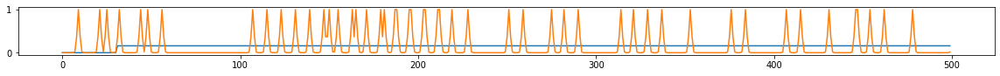

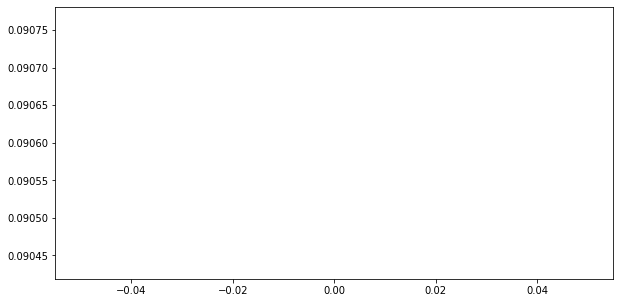

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0784                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 60
TRAIN LOSS: 0.08688029170864159
VAL LOSS: 0.0818076233069102


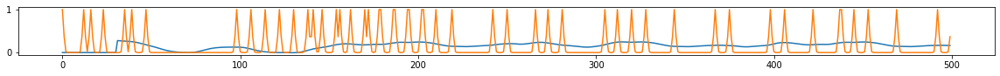

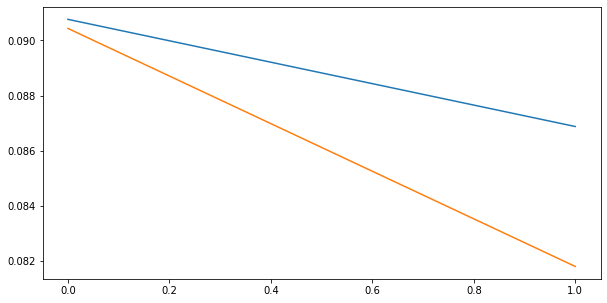

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.26it/s  0.0743                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 60
TRAIN LOSS: 0.08183239338298638
VAL LOSS: 0.08242753148078918


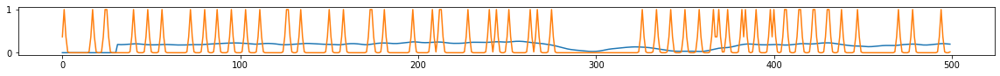

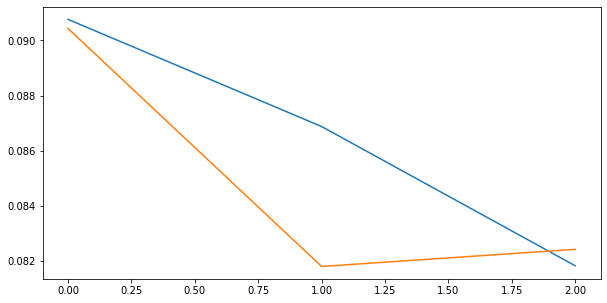

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.26it/s  0.0853                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 60
TRAIN LOSS: 0.08006949205365446
VAL LOSS: 0.07776486956410938


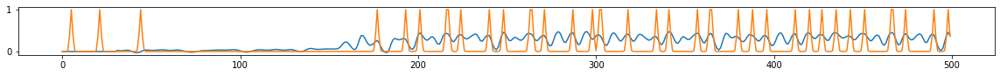

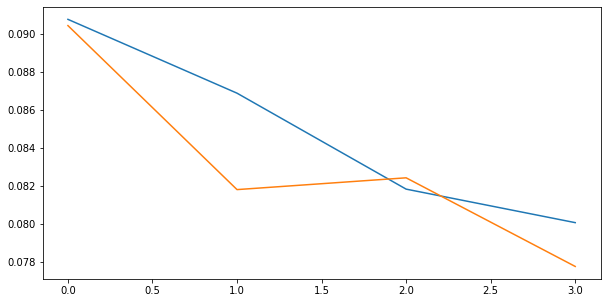

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.20it/s  0.0796                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 60
TRAIN LOSS: 0.0754900752670235
VAL LOSS: 0.07731697625584072


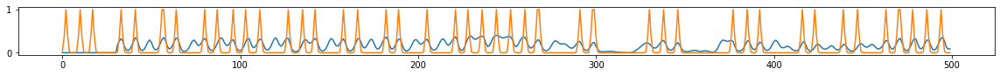

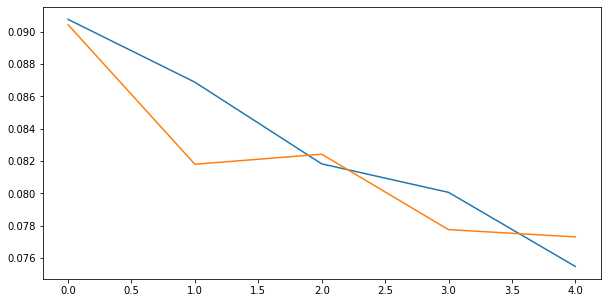

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.85it/s  0.0816                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 60
TRAIN LOSS: 0.07252617014778985
VAL LOSS: 0.07125460190905465


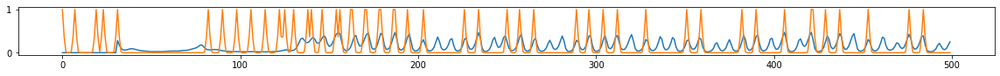

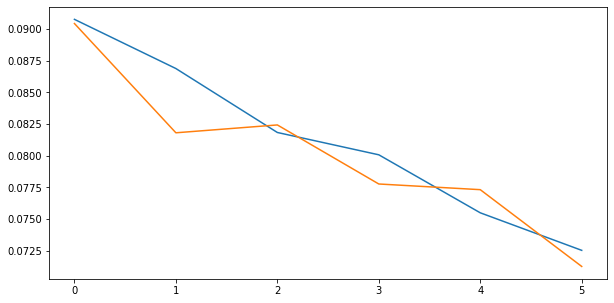

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.11it/s  0.0610                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 60
TRAIN LOSS: 0.07187710495458709
VAL LOSS: 0.06842956774764591


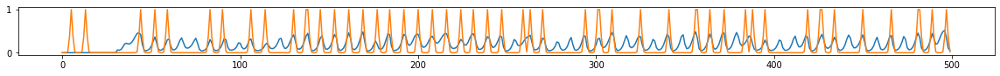

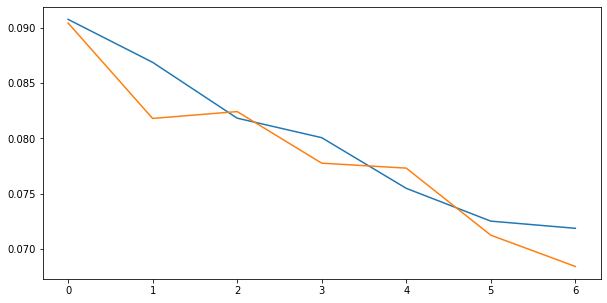

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0661                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 60
TRAIN LOSS: 0.06616850342187616
VAL LOSS: 0.06163586138023271


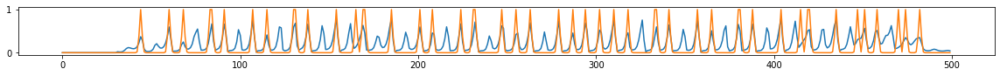

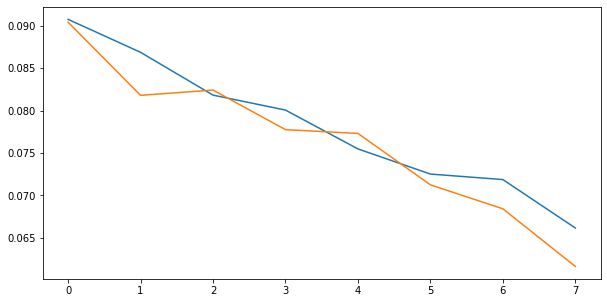

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0464                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 60
TRAIN LOSS: 0.05870107706222269
VAL LOSS: 0.0524550908141666


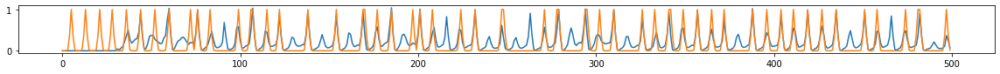

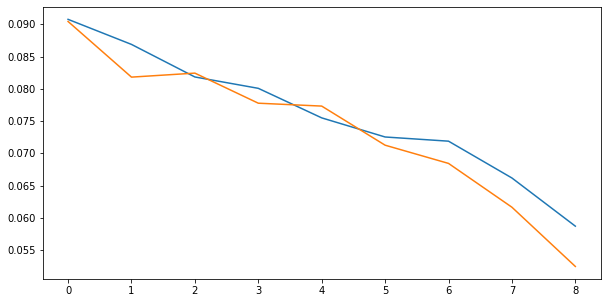

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0527                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 60
TRAIN LOSS: 0.05392082853035794
VAL LOSS: 0.051874680237637624


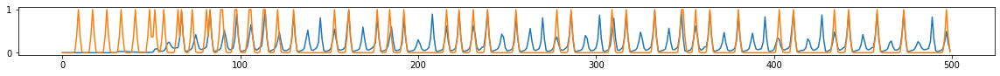

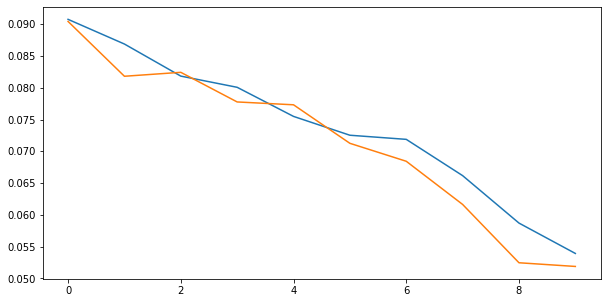

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.04it/s  0.0516                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 60
TRAIN LOSS: 0.05055620666179392
VAL LOSS: 0.052471315695179835


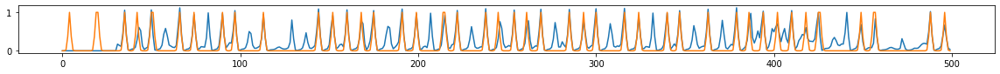

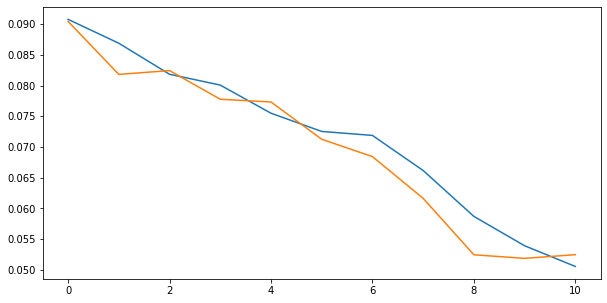

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0533                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 60
TRAIN LOSS: 0.049906240258779794
VAL LOSS: 0.04783419478270742


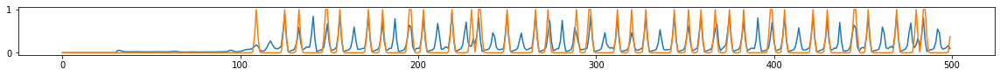

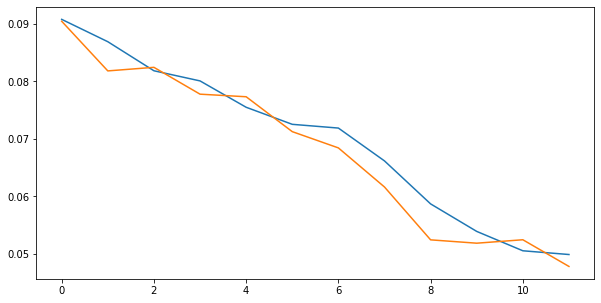

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0445                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 60
TRAIN LOSS: 0.04777855001803902
VAL LOSS: 0.04668289919694265


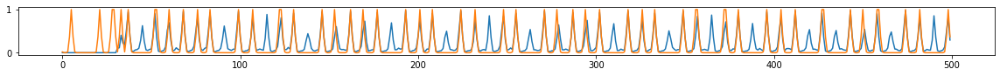

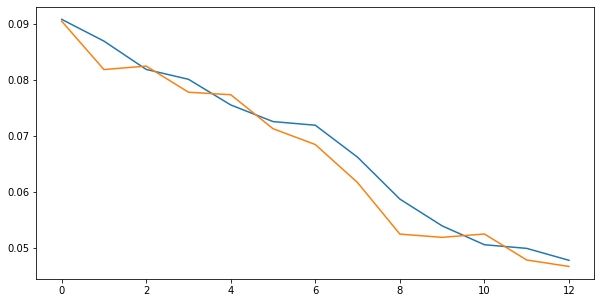

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0432                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 60
TRAIN LOSS: 0.047017151282893285
VAL LOSS: 0.04512286682923635


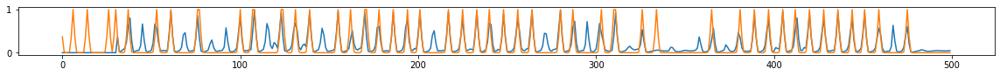

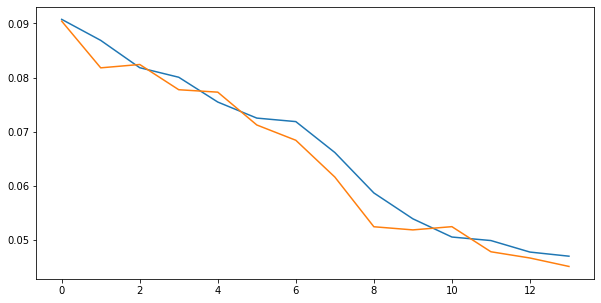

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.98it/s  0.0467                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 60
TRAIN LOSS: 0.04547687475052145
VAL LOSS: 0.0447869963116116


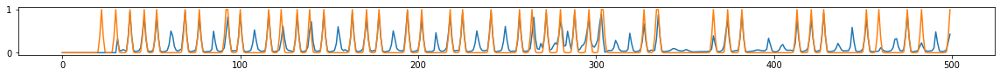

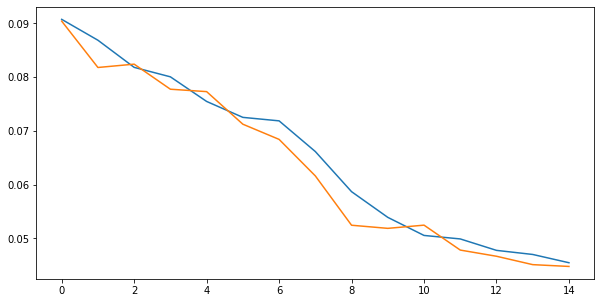

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0545                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 60
TRAIN LOSS: 0.04349540556884474
VAL LOSS: 0.0453989232579867


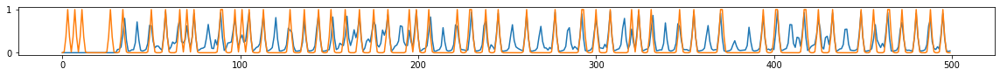

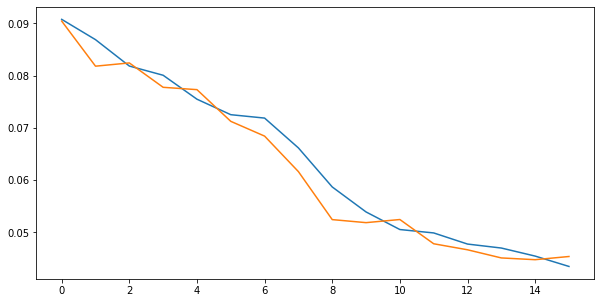

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0462                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 60
TRAIN LOSS: 0.04387679809911384
VAL LOSS: 0.04384469903177685


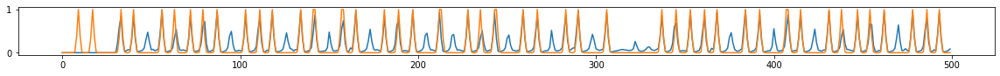

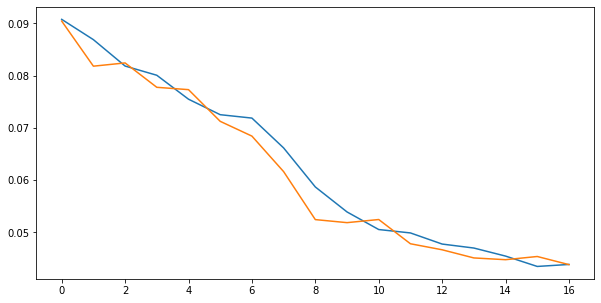

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.11it/s  0.0442                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 60
TRAIN LOSS: 0.04294110441373454
VAL LOSS: 0.04192922098769082


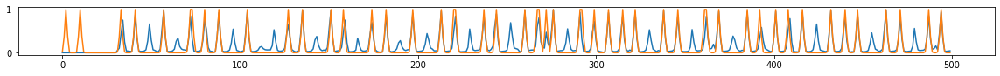

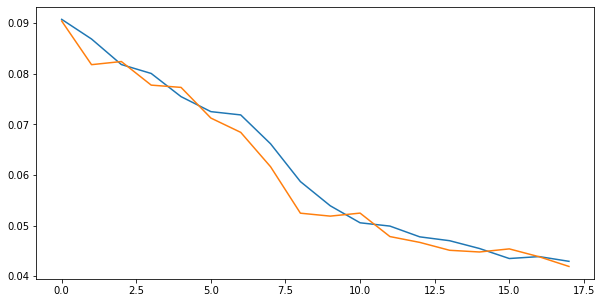

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.05it/s  0.0456                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 60
TRAIN LOSS: 0.043142242874536246
VAL LOSS: 0.044645636859867305


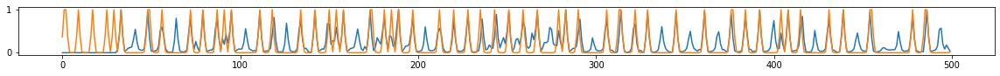

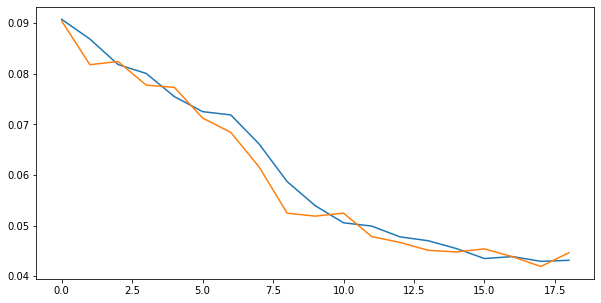

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.91it/s  0.0383                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 60
TRAIN LOSS: 0.04271645450757609
VAL LOSS: 0.04148763004276487


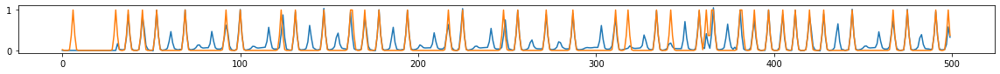

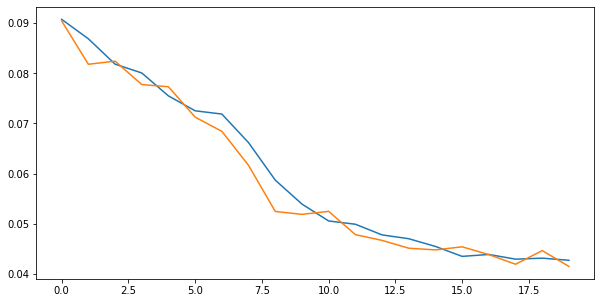

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.91it/s  0.0439                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 60
TRAIN LOSS: 0.04189380444586277
VAL LOSS: 0.04192321623365084


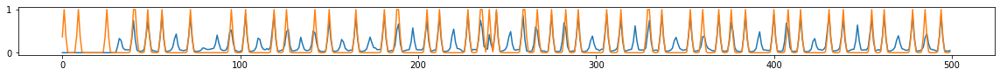

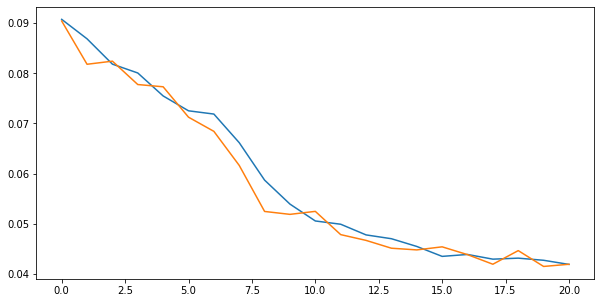

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.16it/s  0.0386                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 60
TRAIN LOSS: 0.04092989210039377
VAL LOSS: 0.040592690722809896


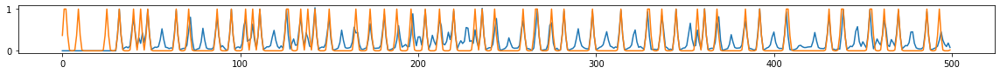

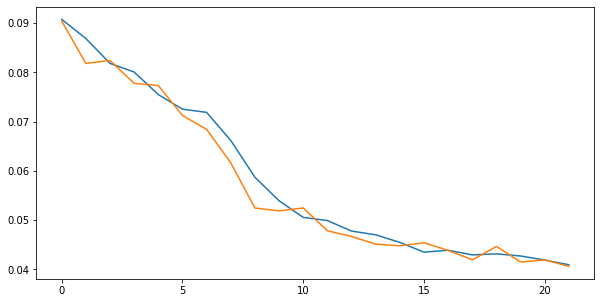

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.92it/s  0.0384                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 60
TRAIN LOSS: 0.04084819286233849
VAL LOSS: 0.04030667038427459


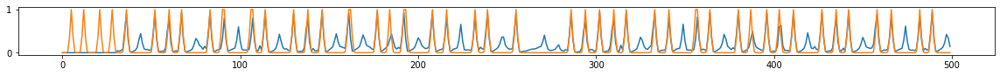

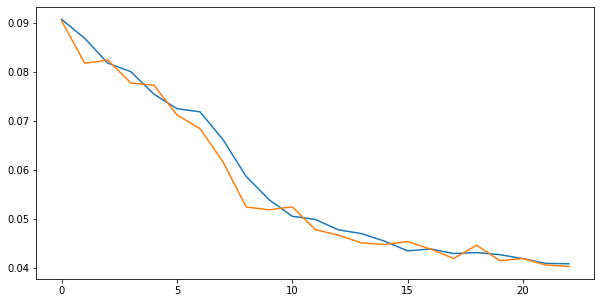

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.92it/s  0.0409                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 60
TRAIN LOSS: 0.041392151162856154
VAL LOSS: 0.0405803302095996


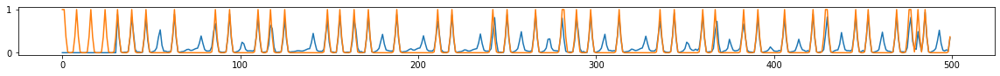

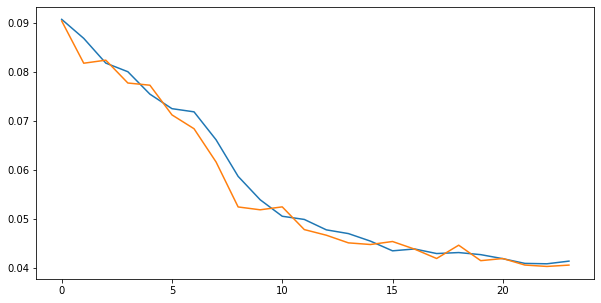

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0403                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 60
TRAIN LOSS: 0.04050644290530019
VAL LOSS: 0.04026619096597036


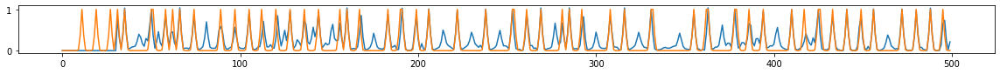

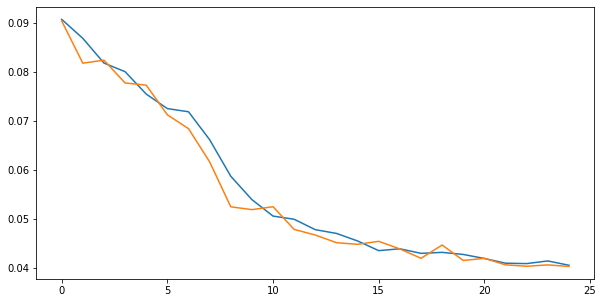

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.08it/s  0.0423                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 60
TRAIN LOSS: 0.039380234459208116
VAL LOSS: 0.04084439120358891


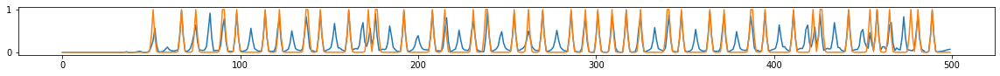

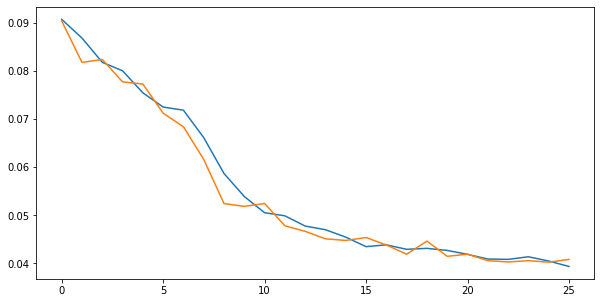

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.16it/s  0.0416                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 60
TRAIN LOSS: 0.03966707943214311
VAL LOSS: 0.03888090575734774


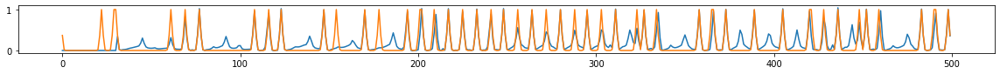

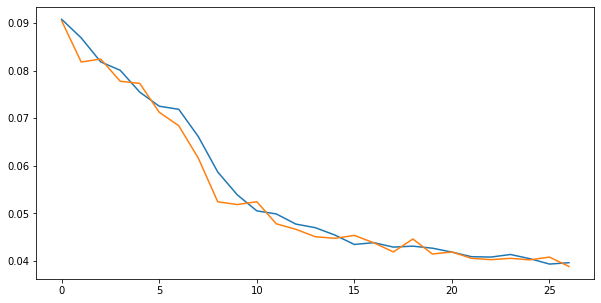

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.23it/s  0.0391                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 60
TRAIN LOSS: 0.0397359463903639
VAL LOSS: 0.037320929682917066


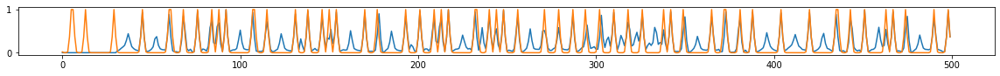

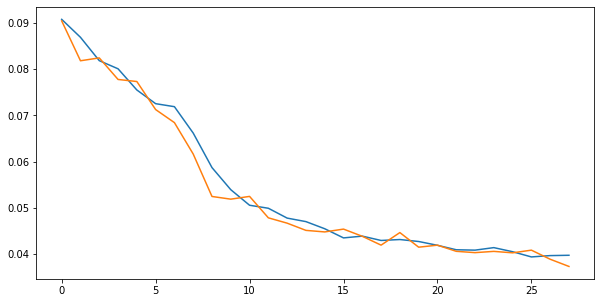

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.76it/s  0.0424                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 60
TRAIN LOSS: 0.04019296412459678
VAL LOSS: 0.03788775826493899


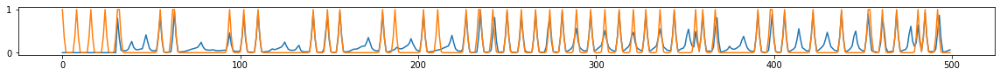

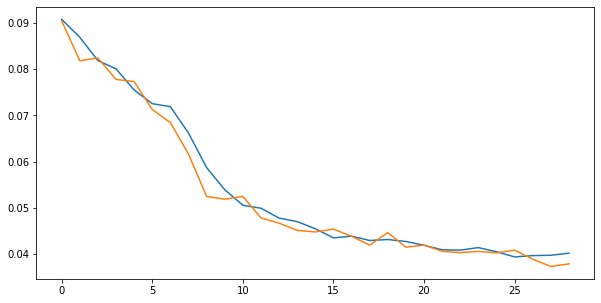

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.97it/s  0.0381                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 60
TRAIN LOSS: 0.03880947973165247
VAL LOSS: 0.037669046885437436


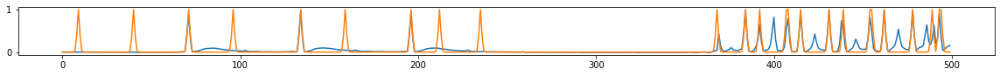

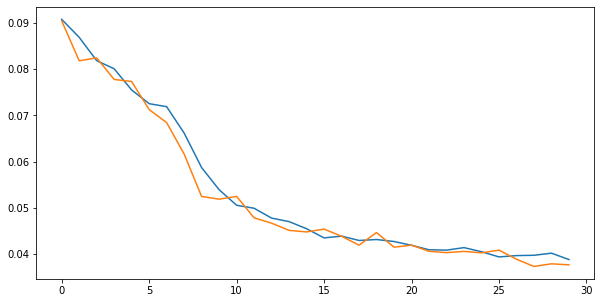

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.00it/s  0.0440                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 60
TRAIN LOSS: 0.03821864010145267
VAL LOSS: 0.038622621446847916


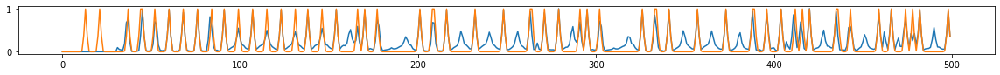

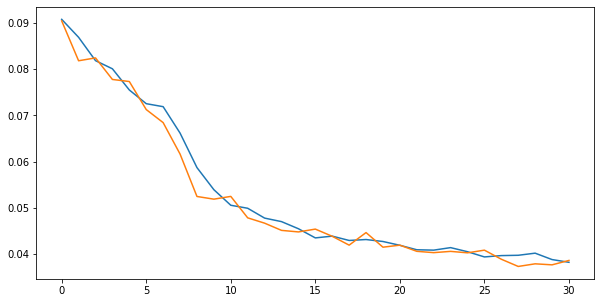

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0371                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 60
TRAIN LOSS: 0.03754022494993276
VAL LOSS: 0.03730488113231129


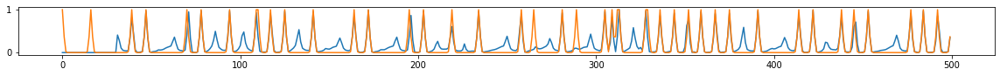

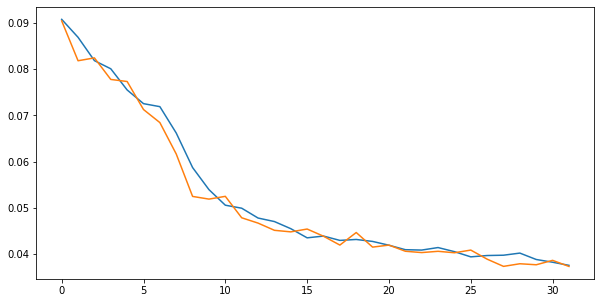

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0384                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 60
TRAIN LOSS: 0.03789342096489337
VAL LOSS: 0.0371685955259535


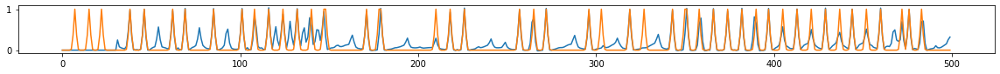

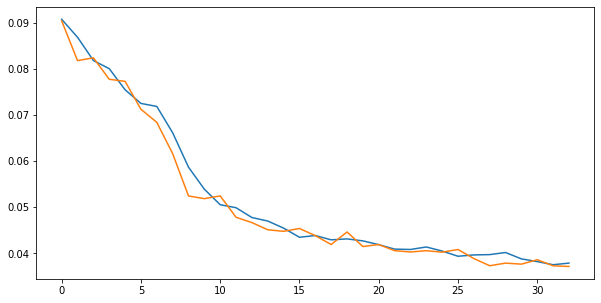

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0411                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 60
TRAIN LOSS: 0.038101700238055654
VAL LOSS: 0.03779721880952517


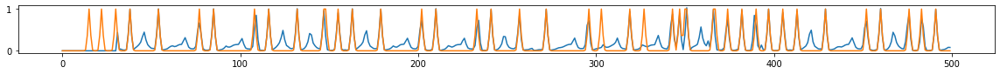

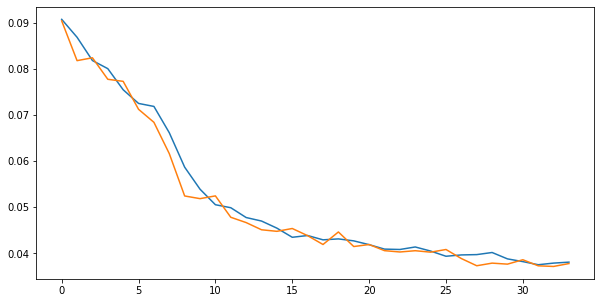

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0394                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 60
TRAIN LOSS: 0.03775144901333584
VAL LOSS: 0.0371237068126599


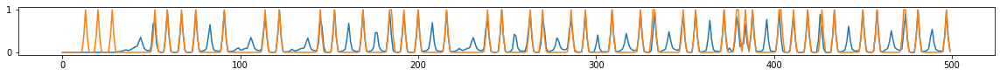

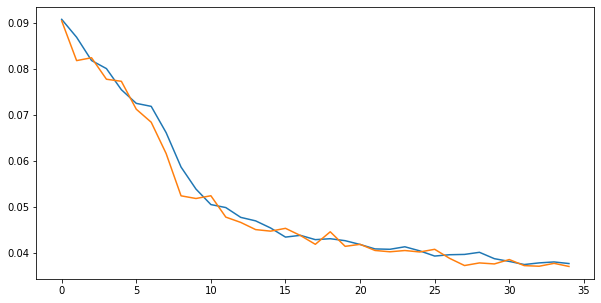

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.88it/s  0.0399                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 60
TRAIN LOSS: 0.037567601901375584
VAL LOSS: 0.036766598001122475


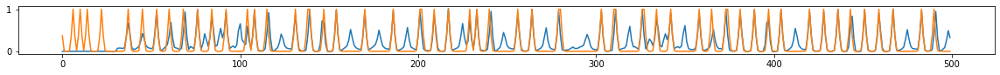

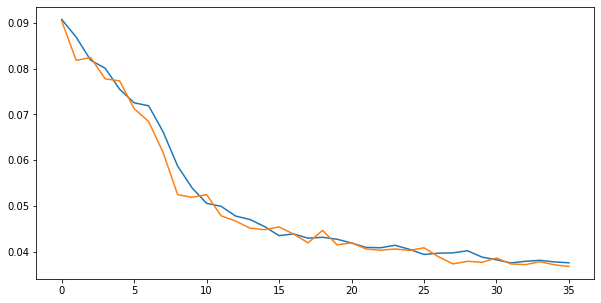

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.99it/s  0.0388                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 60
TRAIN LOSS: 0.03760229299465815
VAL LOSS: 0.03763172071841028


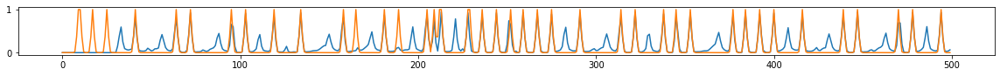

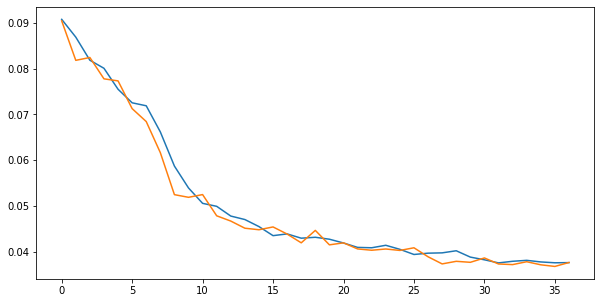

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.99it/s  0.0297                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 60
TRAIN LOSS: 0.03753032297309902
VAL LOSS: 0.037632010877132416


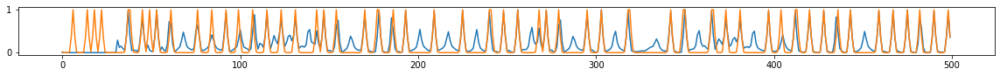

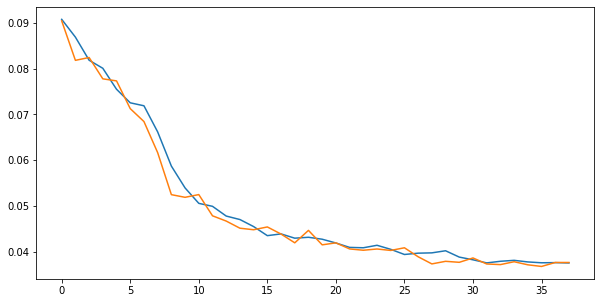

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.07it/s  0.0336                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 60
TRAIN LOSS: 0.03651596372947097
VAL LOSS: 0.037339463002151914


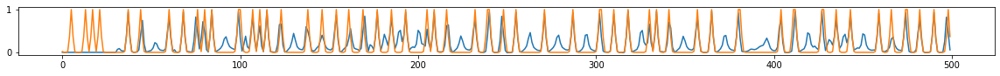

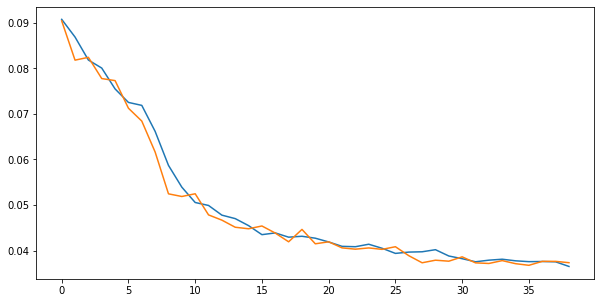

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0317                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 60
TRAIN LOSS: 0.03565231612366107
VAL LOSS: 0.03605470144086414


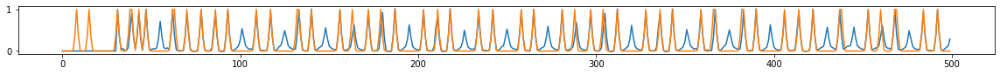

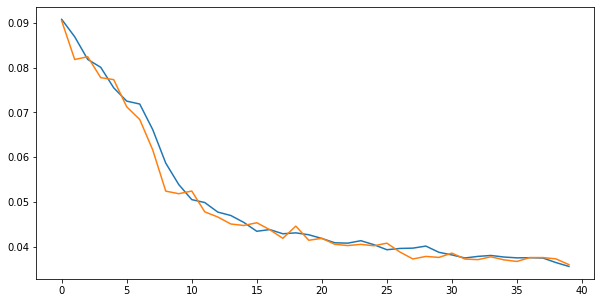

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0381                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 60
TRAIN LOSS: 0.03655737234900395
VAL LOSS: 0.03737804314328565


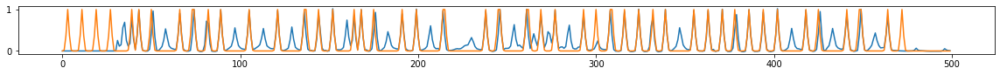

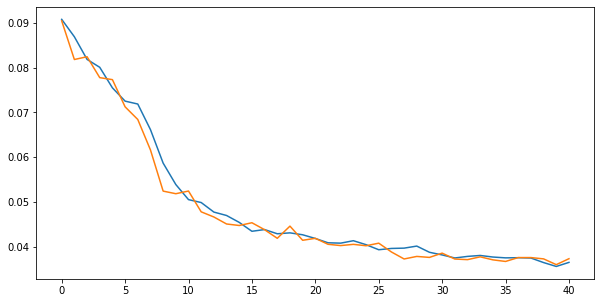

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0288                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 60
TRAIN LOSS: 0.035669919931226306
VAL LOSS: 0.03452645242214203


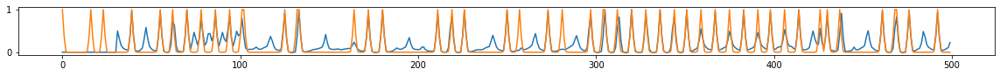

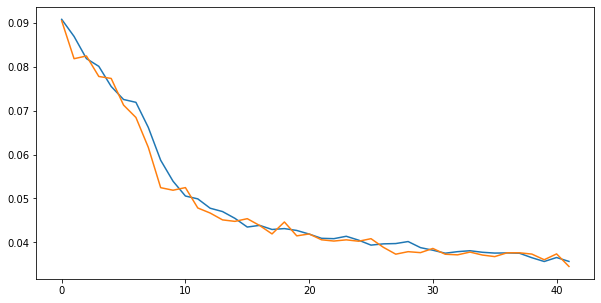

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0357                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 60
TRAIN LOSS: 0.035694923976229295
VAL LOSS: 0.03559164682196246


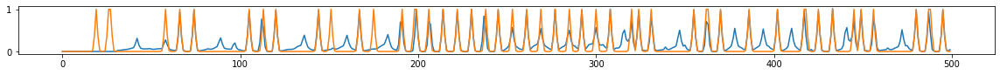

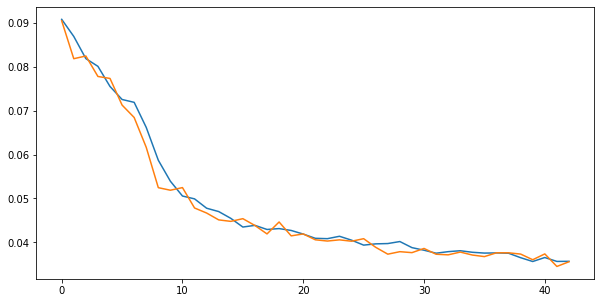

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.03it/s  0.0338                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 60
TRAIN LOSS: 0.0354724808389114
VAL LOSS: 0.03475035209622648


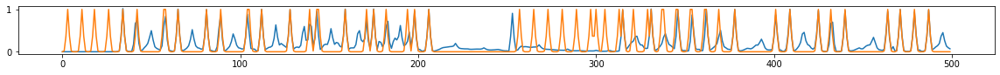

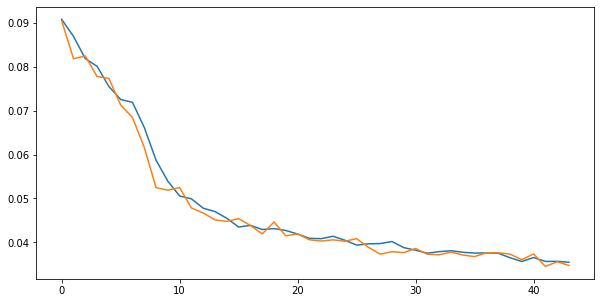

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.07it/s  0.0411                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 60
TRAIN LOSS: 0.034420558924062386
VAL LOSS: 0.03693701533807649


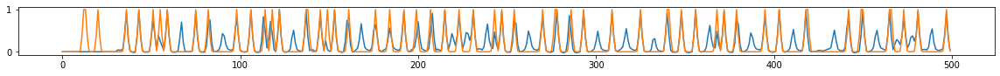

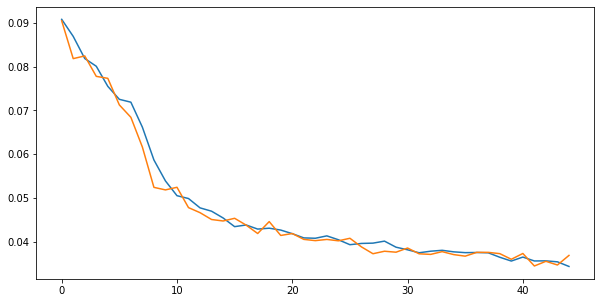

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.81it/s  0.0346                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 60
TRAIN LOSS: 0.035199824875841536
VAL LOSS: 0.03559779437879721


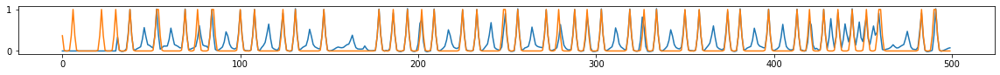

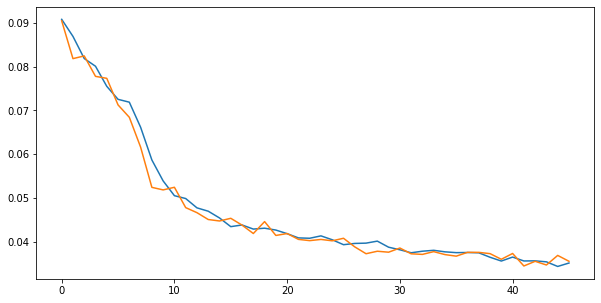

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0355                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 60
TRAIN LOSS: 0.035271717649367124
VAL LOSS: 0.03564631607797411


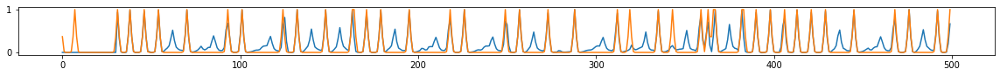

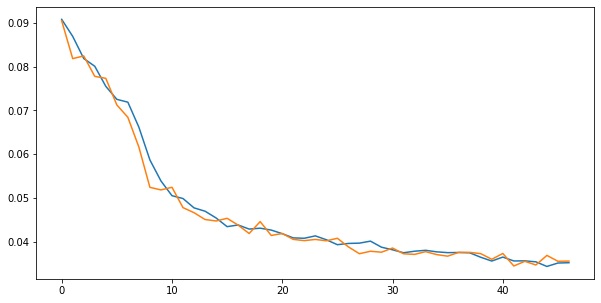

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.96it/s  0.0445                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 60
TRAIN LOSS: 0.03547616437491444
VAL LOSS: 0.03466230258345604


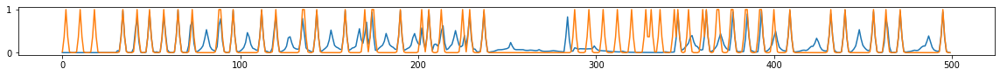

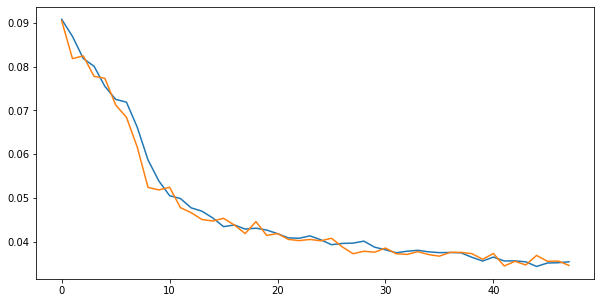

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0361                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 60
TRAIN LOSS: 0.03496622216577331
VAL LOSS: 0.03863783346282111


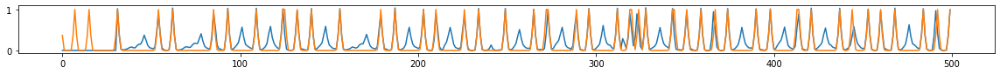

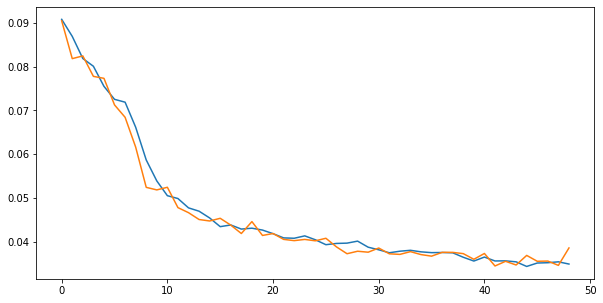

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0350                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 60
TRAIN LOSS: 0.03553287452086806
VAL LOSS: 0.03561775883038839


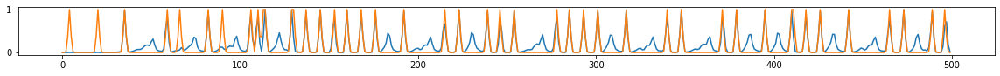

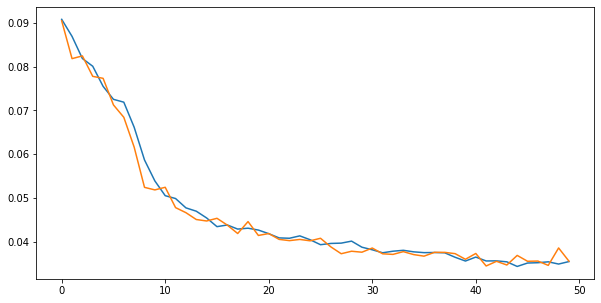

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.84it/s  0.0377                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 60
TRAIN LOSS: 0.034986698223898806
VAL LOSS: 0.03656560513708326


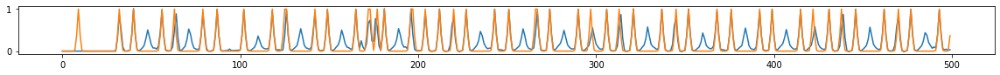

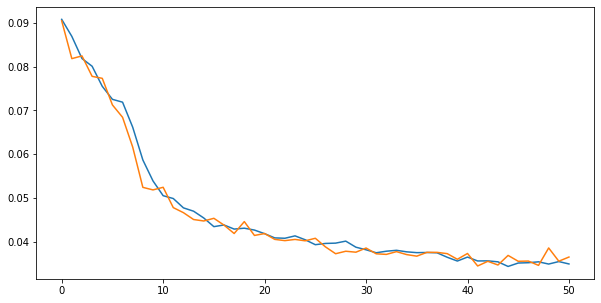

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.92it/s  0.0413                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 60
TRAIN LOSS: 0.03445263931320773
VAL LOSS: 0.03446602407428953


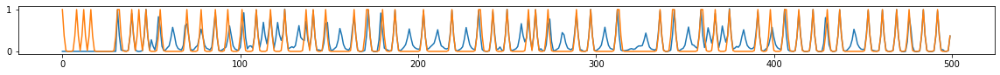

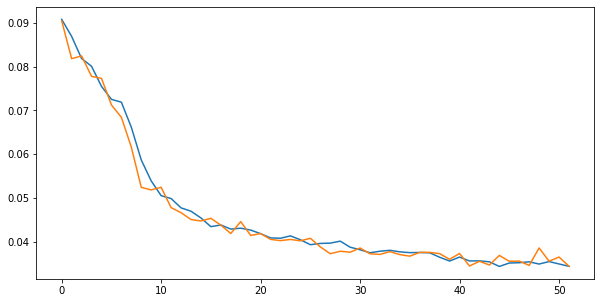

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.06it/s  0.0264                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 60
TRAIN LOSS: 0.034301247654689684
VAL LOSS: 0.036140702250930995


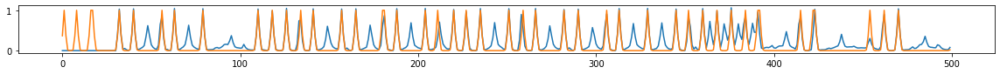

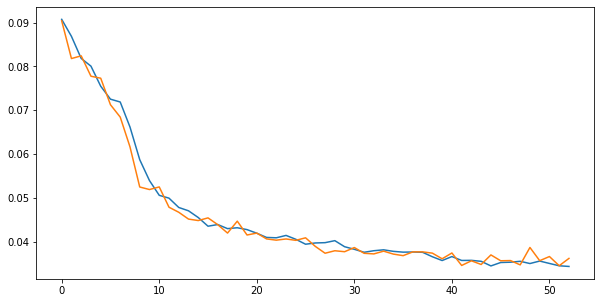

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0353                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 60
TRAIN LOSS: 0.03451307505990068
VAL LOSS: 0.0342187960114744


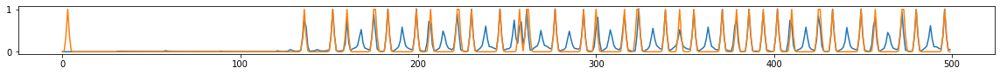

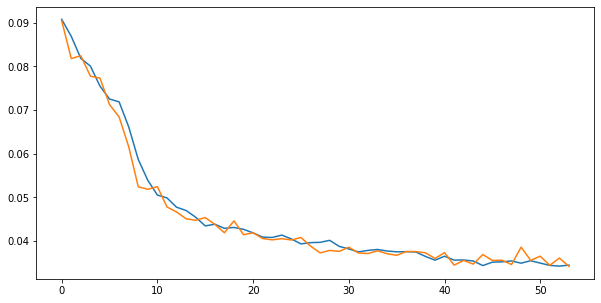

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.07it/s  0.0306                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 60
TRAIN LOSS: 0.03381392126902938
VAL LOSS: 0.034391315653920174


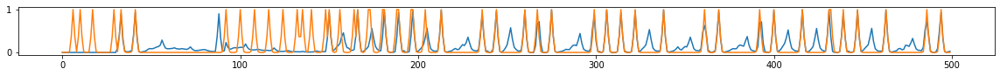

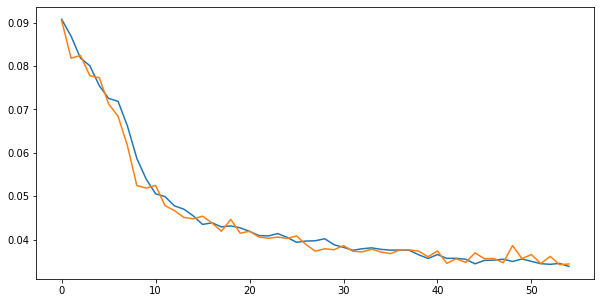

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0329                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 60
TRAIN LOSS: 0.03408103979503115
VAL LOSS: 0.03288072699473964


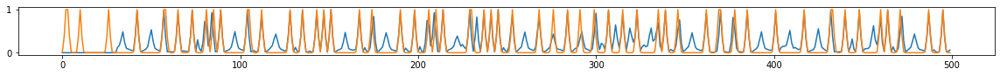

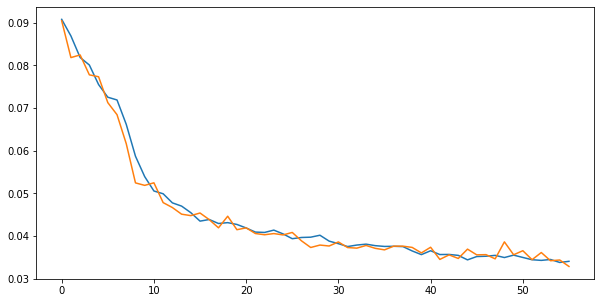

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0326                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 60
TRAIN LOSS: 0.03428082069795993
VAL LOSS: 0.03396311216056347


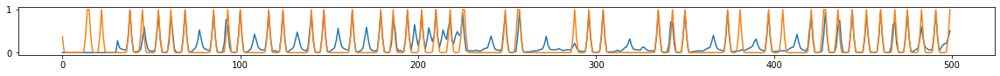

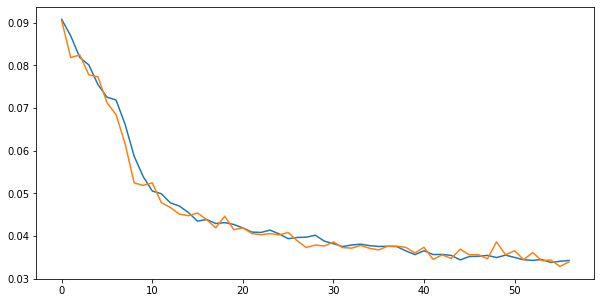

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.08it/s  0.0337                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 60
TRAIN LOSS: 0.033619965012702674
VAL LOSS: 0.03354310099449423


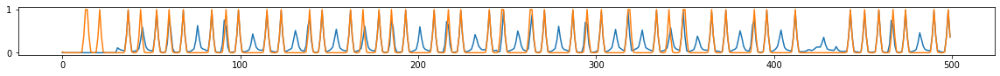

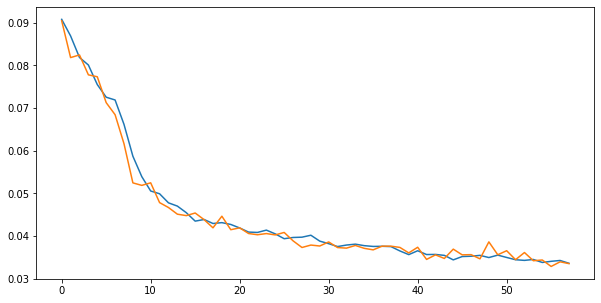

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0395                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 60
TRAIN LOSS: 0.03414156577653355
VAL LOSS: 0.033307849533028074


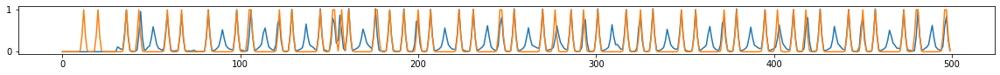

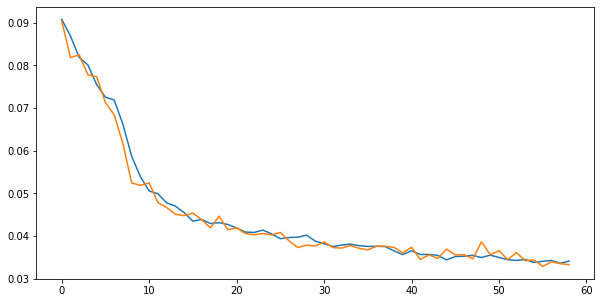

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.12it/s  0.0276                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 60
TRAIN LOSS: 0.03362117392114467
VAL LOSS: 0.034202275383803576


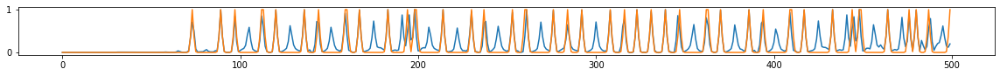

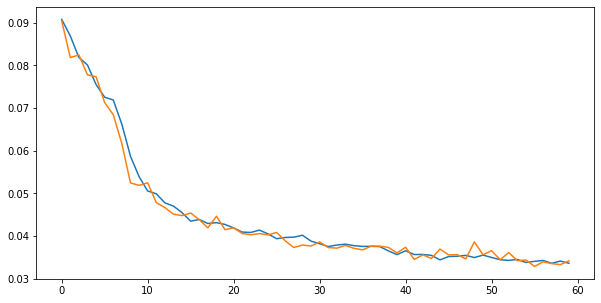

338.80400586128235 secs


In [26]:
start = time.time()

epochs = 60
train()

end = time.time()
print(end - start, 'secs')

In [ ]:
train_hist = train_hist[10:]
val_hist = val_hist[10:]

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.20it/s  0.0327                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 316
TRAIN LOSS: 0.032995791950573526
VAL LOSS: 0.033808798218766846


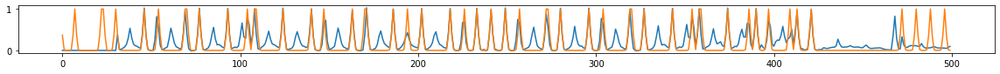

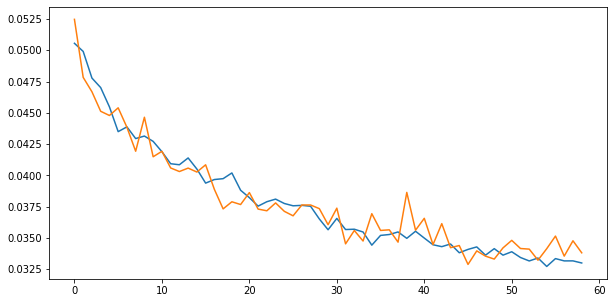

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.22it/s  0.0325                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 316
TRAIN LOSS: 0.03286386400254236
VAL LOSS: 0.03333496695591344


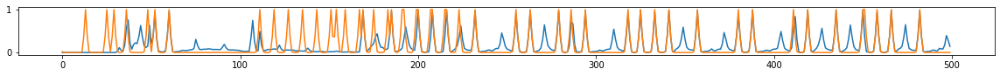

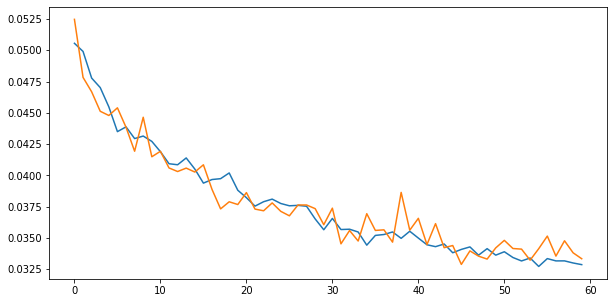

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.21it/s  0.0275                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 316
TRAIN LOSS: 0.0327969740351869
VAL LOSS: 0.033236889789501824


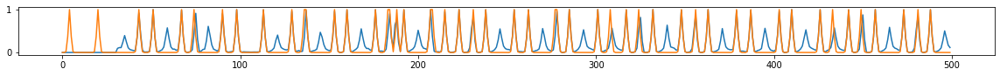

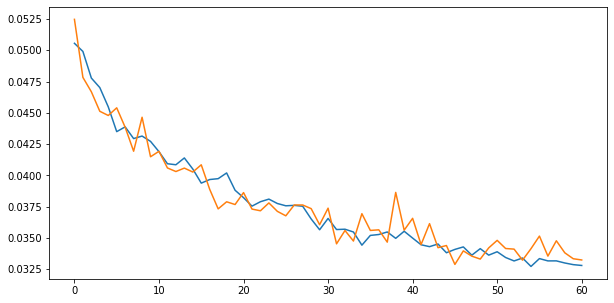

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.00it/s  0.0374                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

63 of 316
TRAIN LOSS: 0.03190324098492662
VAL LOSS: 0.02987288124859333


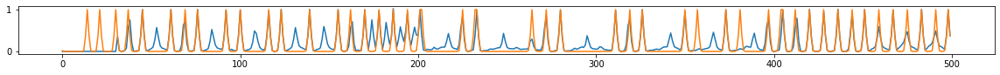

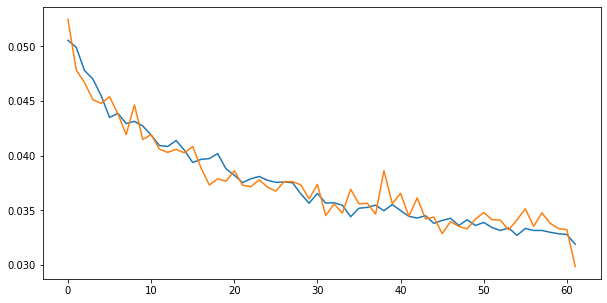

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.10it/s  0.0309                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

64 of 316
TRAIN LOSS: 0.03257113638230496
VAL LOSS: 0.036487623014383845


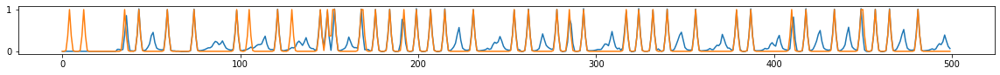

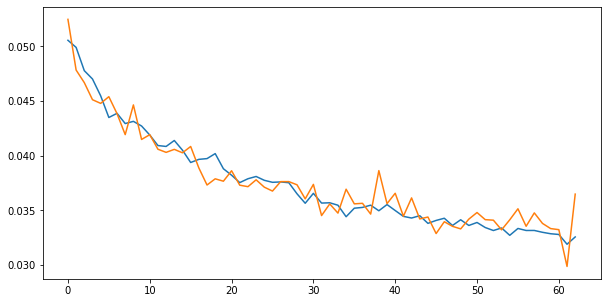

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0404                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

65 of 316
TRAIN LOSS: 0.033901165446473494
VAL LOSS: 0.03338808587027921


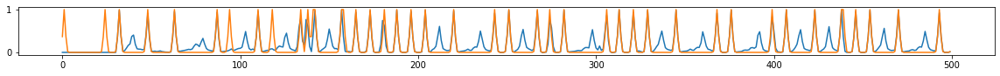

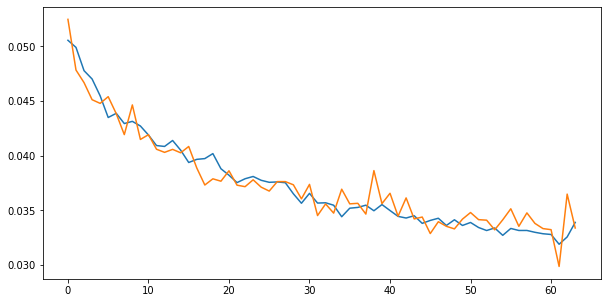

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.08it/s  0.0331                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

66 of 316
TRAIN LOSS: 0.03268181092830168
VAL LOSS: 0.03481479506525728


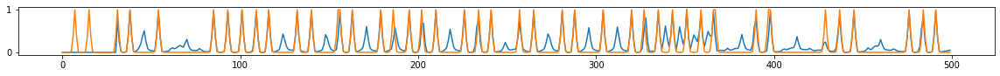

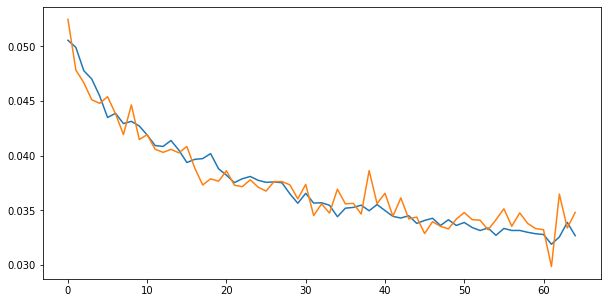

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.19it/s  0.0294                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

67 of 316
TRAIN LOSS: 0.031459081555820174
VAL LOSS: 0.03278633890052637


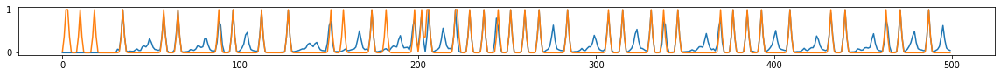

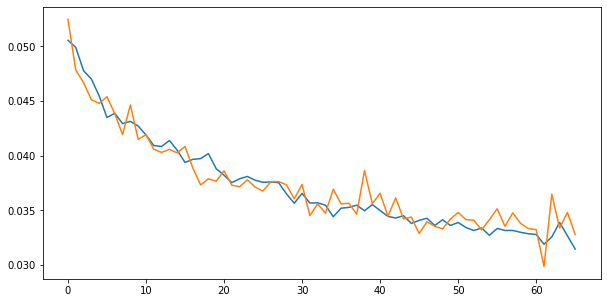

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0311                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

68 of 316
TRAIN LOSS: 0.031716588832851916
VAL LOSS: 0.03278339881863859


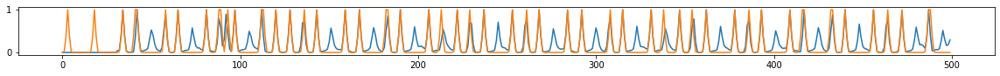

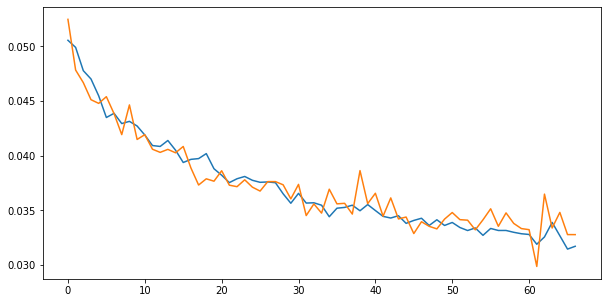

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.97it/s  0.0312                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

69 of 316
TRAIN LOSS: 0.031597368988311954
VAL LOSS: 0.03380259167816904


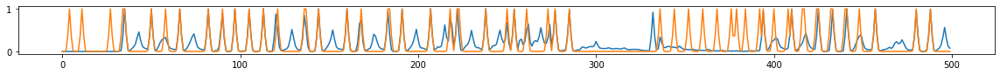

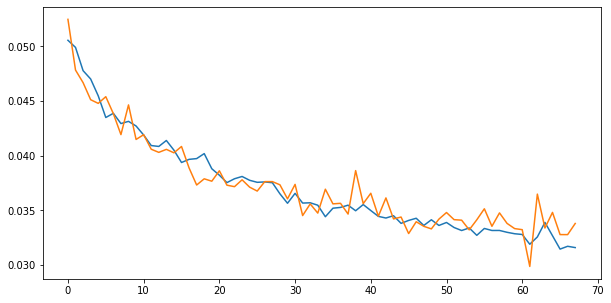

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.27it/s  0.0301                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

70 of 316
TRAIN LOSS: 0.03143078818296393
VAL LOSS: 0.03145300679736667


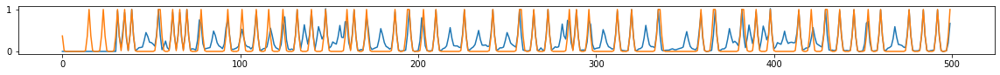

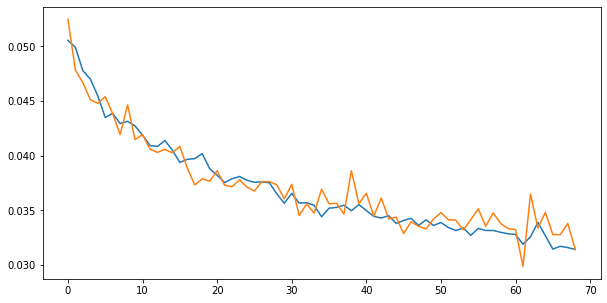

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.28it/s  0.0372                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

71 of 316
TRAIN LOSS: 0.032571590402060084
VAL LOSS: 0.032746689601076975


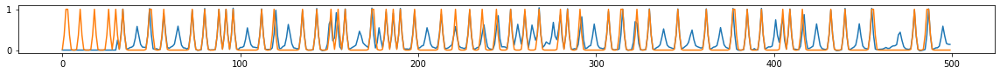

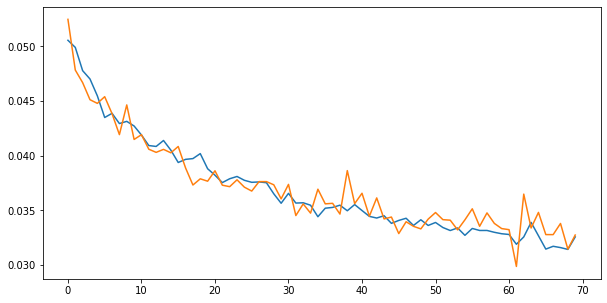

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.16it/s  0.0244                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

72 of 316
TRAIN LOSS: 0.031606410112645894
VAL LOSS: 0.03327705338597298


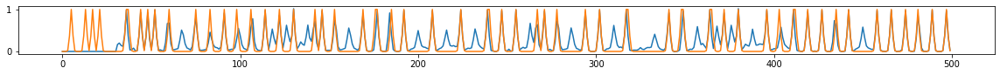

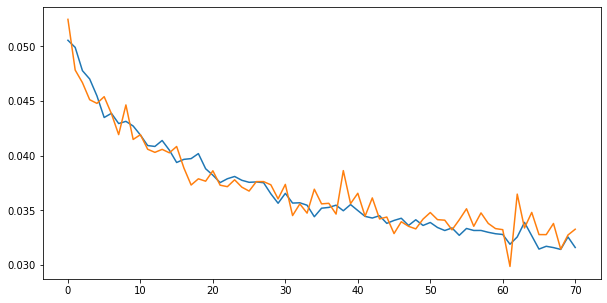

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.19it/s  0.0390                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

73 of 316
TRAIN LOSS: 0.032686216135819755
VAL LOSS: 0.033770153092013463


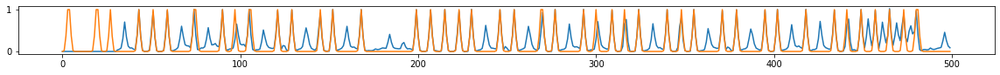

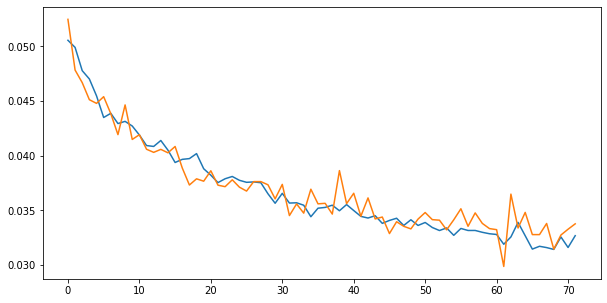

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.19it/s  0.0347                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

74 of 316
TRAIN LOSS: 0.031675254822605185
VAL LOSS: 0.03260083434482416


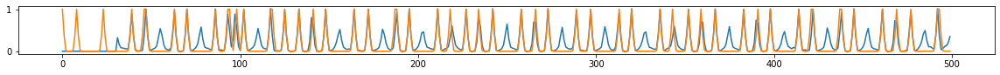

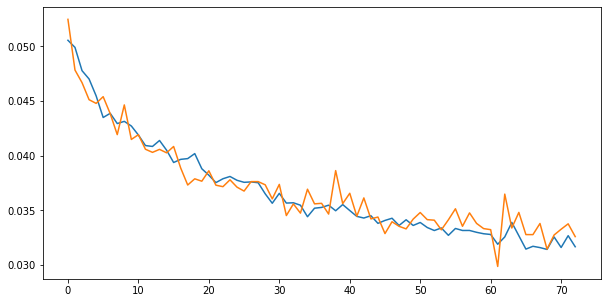

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.22it/s  0.0255                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

75 of 316
TRAIN LOSS: 0.03101089695054624
VAL LOSS: 0.03309311158955097


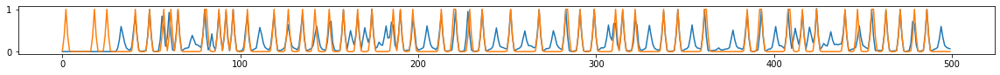

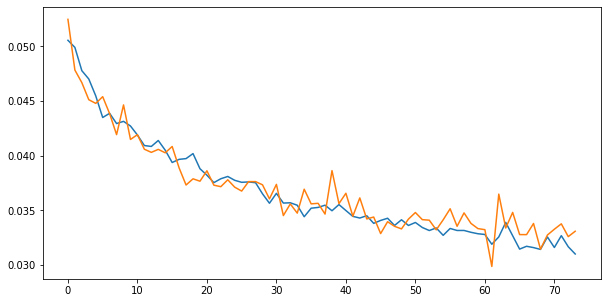

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.22it/s  0.0318                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

76 of 316
TRAIN LOSS: 0.03073538529376189
VAL LOSS: 0.032597954695423446


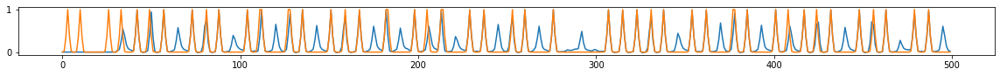

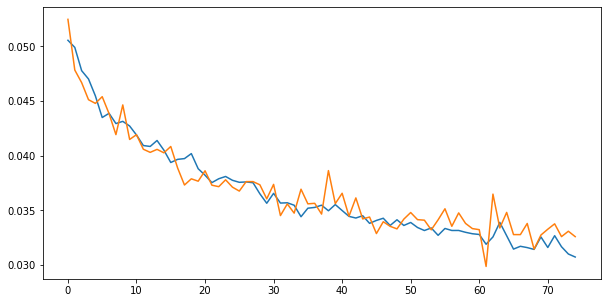

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0300                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

77 of 316
TRAIN LOSS: 0.03147609971670641
VAL LOSS: 0.03276939027839237


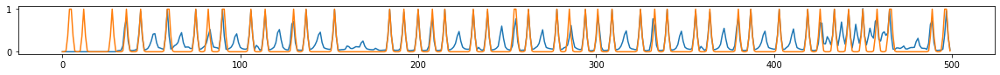

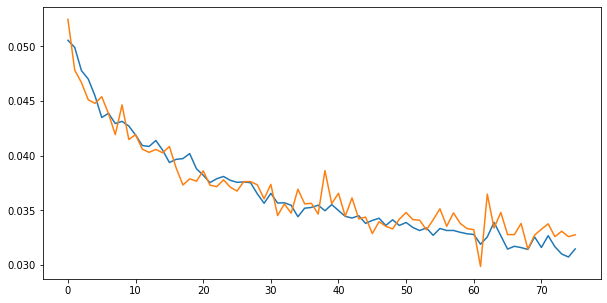

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.07it/s  0.0331                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

78 of 316
TRAIN LOSS: 0.03187276283279061
VAL LOSS: 0.033223948958847255


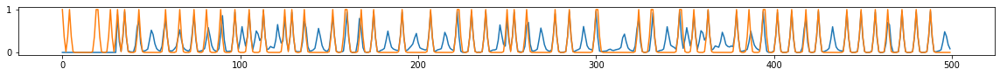

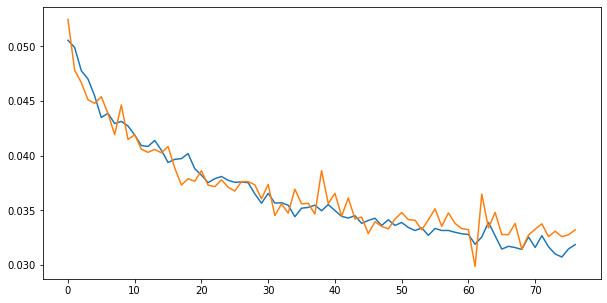

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.93it/s  0.0316                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

79 of 316
TRAIN LOSS: 0.03139440187563499
VAL LOSS: 0.03341182921495703


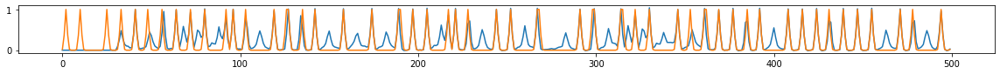

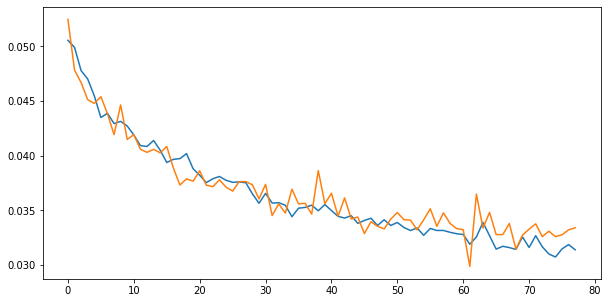

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0324                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

80 of 316
TRAIN LOSS: 0.03241010450033678
VAL LOSS: 0.030500582108894985


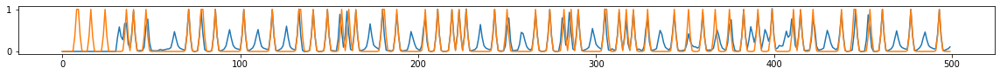

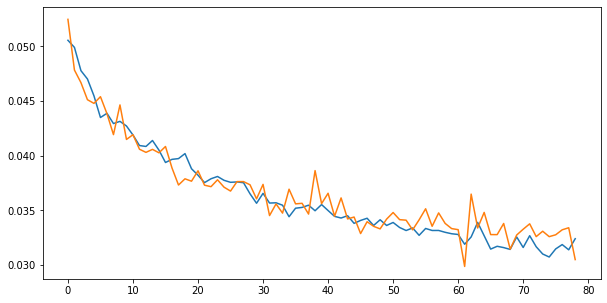

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.06it/s  0.0299                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

81 of 316
TRAIN LOSS: 0.03125786786485049
VAL LOSS: 0.03260463041563829


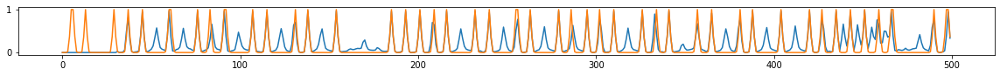

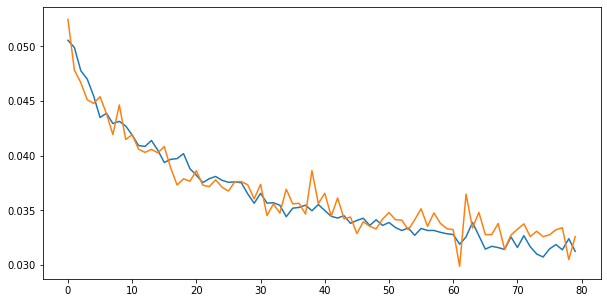

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.18it/s  0.0298                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

82 of 316
TRAIN LOSS: 0.031477405637916595
VAL LOSS: 0.029867818165156577


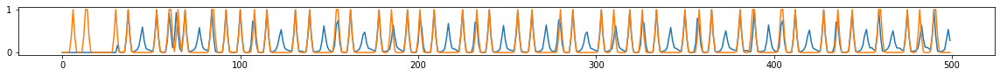

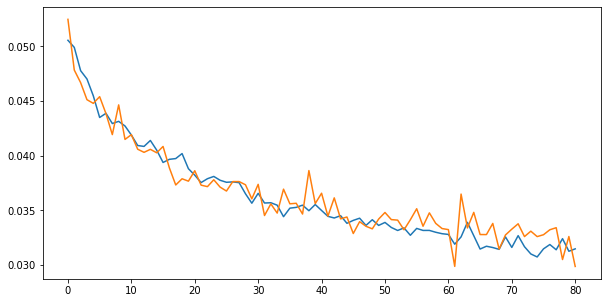

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.08it/s  0.0331                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

83 of 316
TRAIN LOSS: 0.03027622794939412
VAL LOSS: 0.03174542118277815


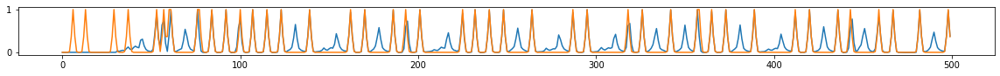

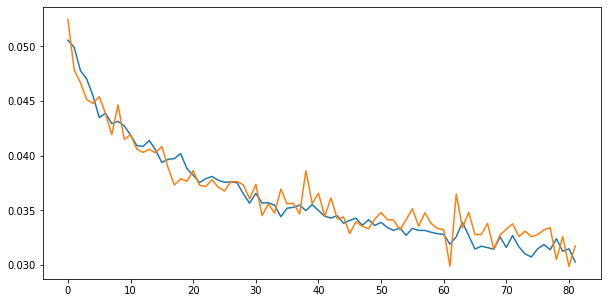

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0319                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

84 of 316
TRAIN LOSS: 0.030629439434657495
VAL LOSS: 0.033817950843109026


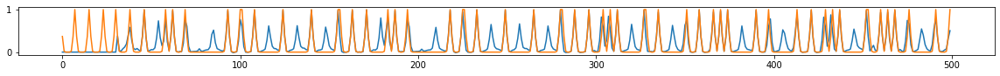

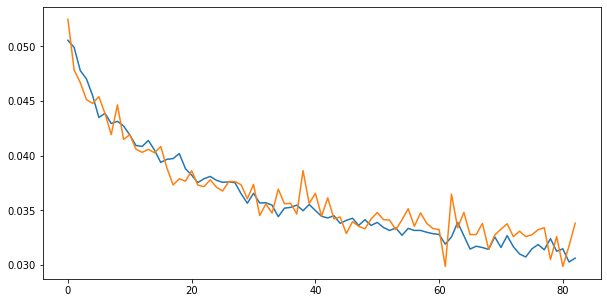

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0312                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

85 of 316
TRAIN LOSS: 0.03092066327937775
VAL LOSS: 0.03327757968670792


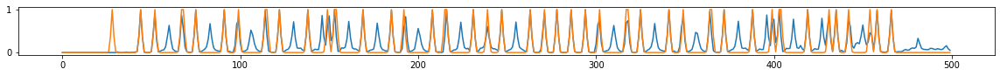

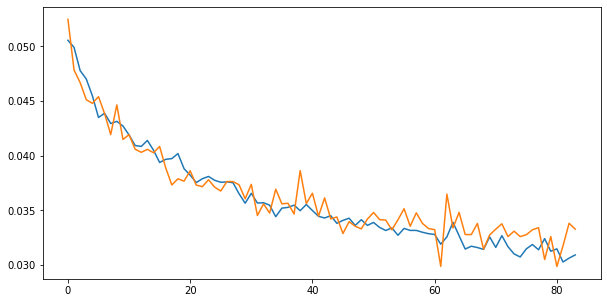

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.88it/s  0.0246                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

86 of 316
TRAIN LOSS: 0.03151015709671709
VAL LOSS: 0.03195742145180702


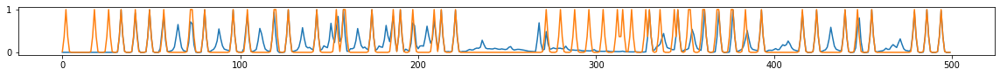

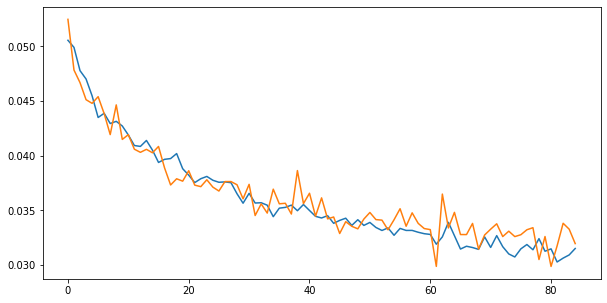

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.07it/s  0.0348                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

87 of 316
TRAIN LOSS: 0.03101221637593375
VAL LOSS: 0.03323671490781837


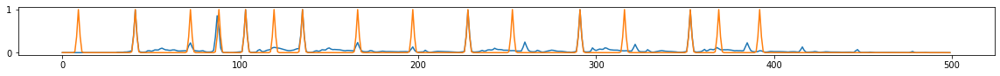

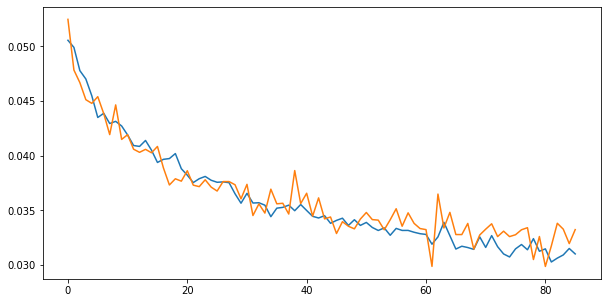

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.00it/s  0.0366                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

88 of 316
TRAIN LOSS: 0.03106020049502452
VAL LOSS: 0.030965244604481593


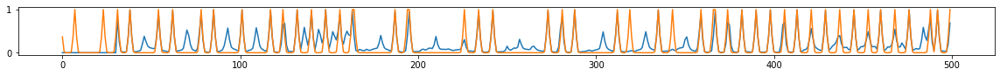

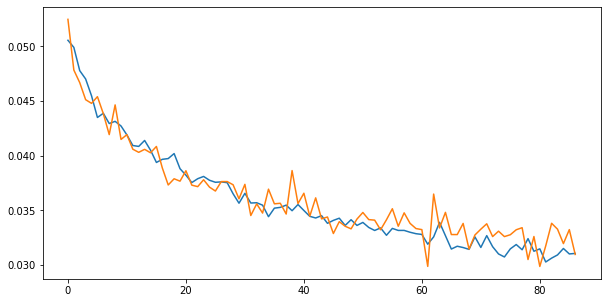

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0312                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

89 of 316
TRAIN LOSS: 0.03144058724865317
VAL LOSS: 0.03248332771990034


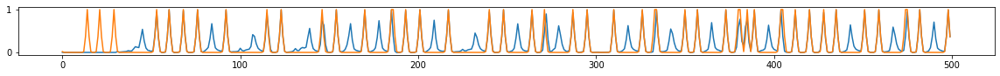

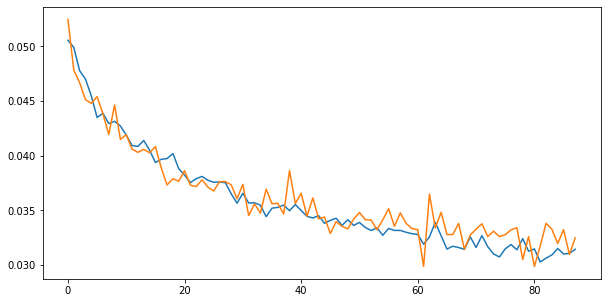

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0350                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

90 of 316
TRAIN LOSS: 0.03088736839385496
VAL LOSS: 0.03136701157523526


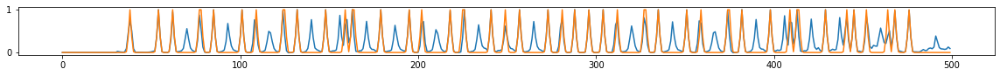

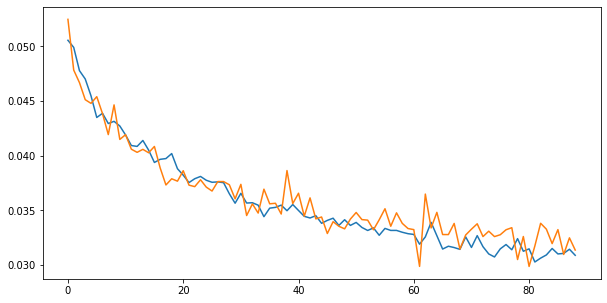

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.04it/s  0.0288                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

91 of 316
TRAIN LOSS: 0.03024778499578436
VAL LOSS: 0.03320560045540333


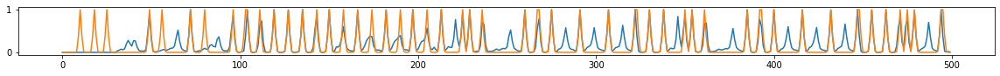

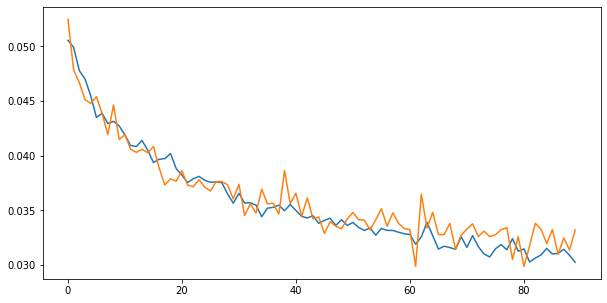

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0341                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

92 of 316
TRAIN LOSS: 0.0301902721532517
VAL LOSS: 0.0321355244765679


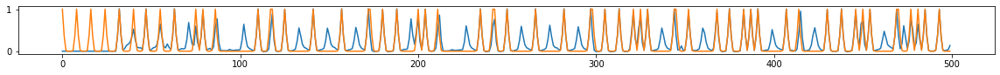

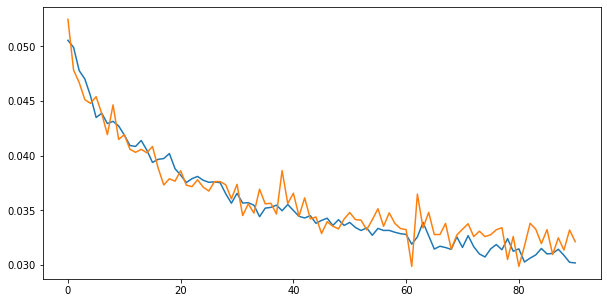

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.11it/s  0.0257                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

93 of 316
TRAIN LOSS: 0.029849433961013954
VAL LOSS: 0.03003074021803008


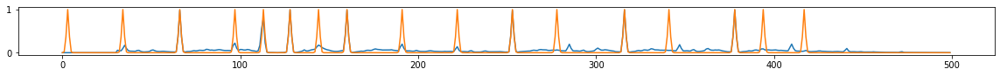

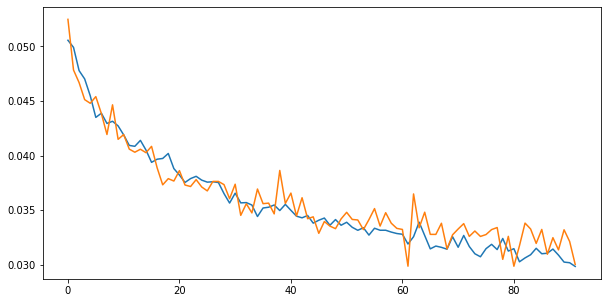

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.07it/s  0.0285                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

94 of 316
TRAIN LOSS: 0.030604781169030402
VAL LOSS: 0.03023231712480386


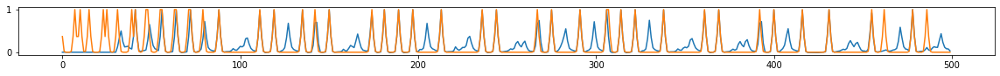

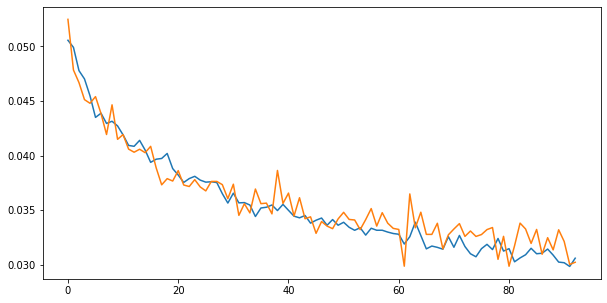

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.98it/s  0.0348                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

95 of 316
TRAIN LOSS: 0.030952664299143687
VAL LOSS: 0.03218084677226014


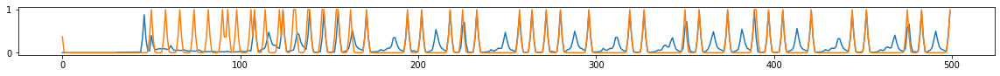

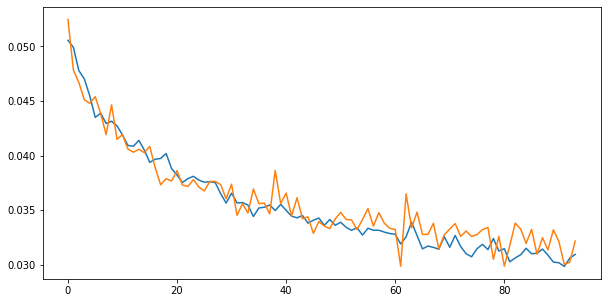

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.87it/s  0.0290                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

96 of 316
TRAIN LOSS: 0.030157349072396755
VAL LOSS: 0.032435421728425555


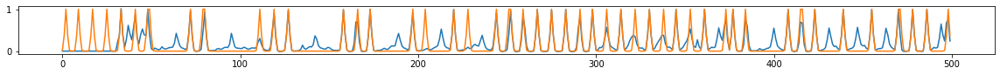

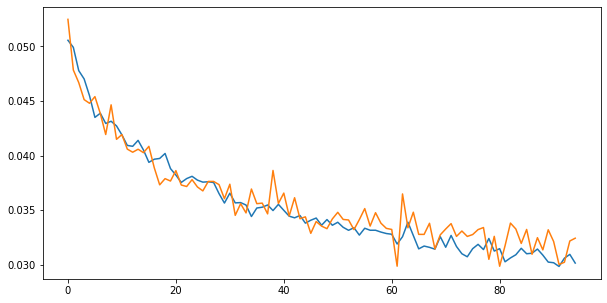

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.91it/s  0.0274                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

97 of 316
TRAIN LOSS: 0.029189099712918203
VAL LOSS: 0.0341386693633265


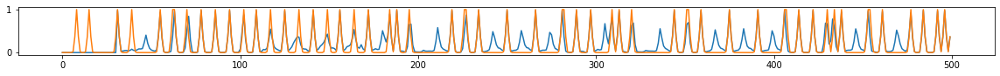

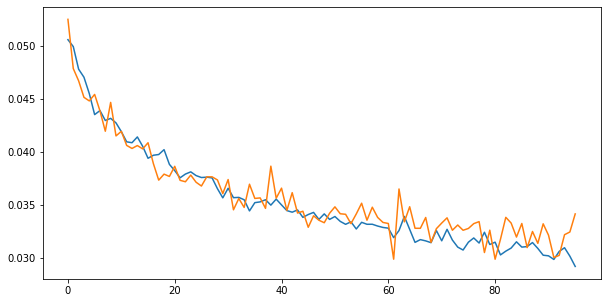

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.91it/s  0.0326                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

98 of 316
TRAIN LOSS: 0.03060349930698673
VAL LOSS: 0.03346419706940651


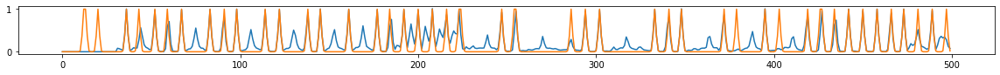

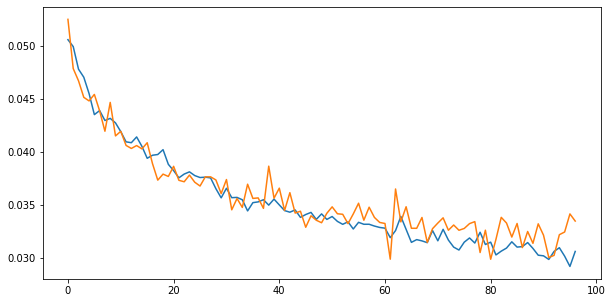

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.97it/s  0.0298                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

99 of 316
TRAIN LOSS: 0.030431311887999375
VAL LOSS: 0.031087737737430468


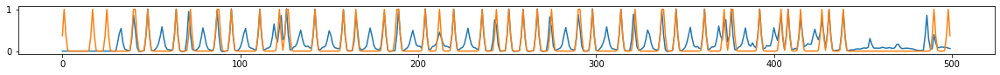

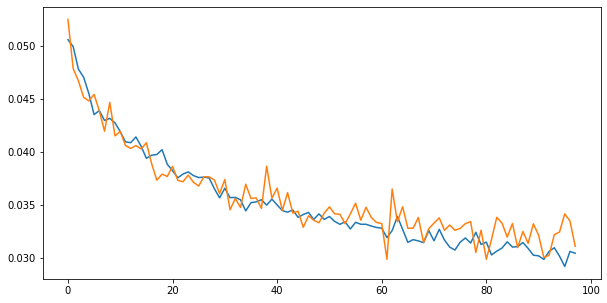

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0317                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

100 of 316
TRAIN LOSS: 0.030890217775271997
VAL LOSS: 0.031155592037571803


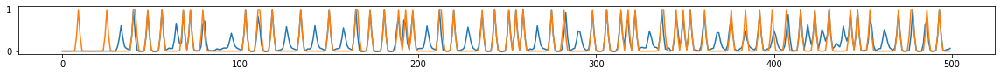

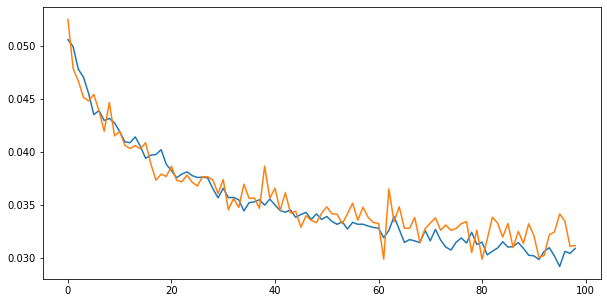

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0278                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

101 of 316
TRAIN LOSS: 0.029739521029922698
VAL LOSS: 0.030368971327940624


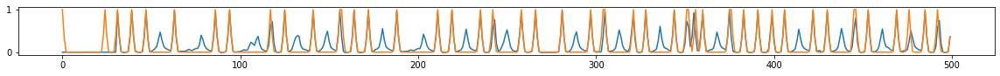

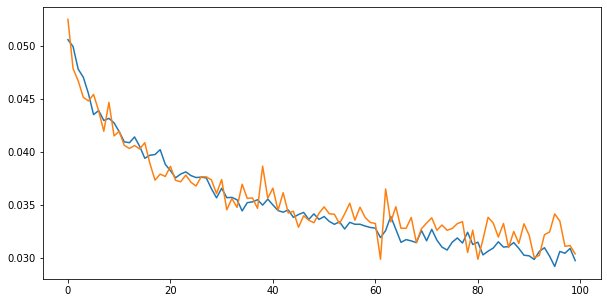

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.19it/s  0.0315                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

102 of 316
TRAIN LOSS: 0.03072746532658736
VAL LOSS: 0.03275937007533179


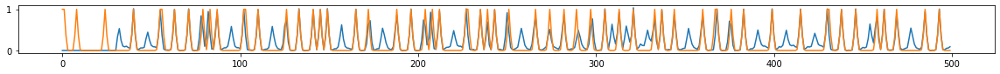

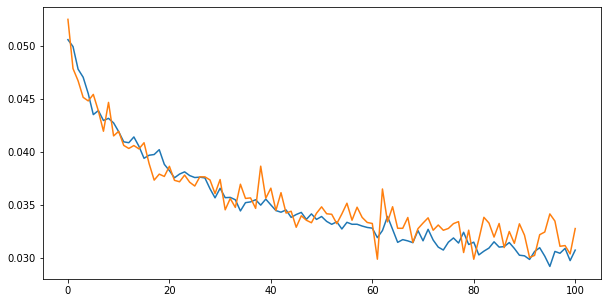

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0271                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

103 of 316
TRAIN LOSS: 0.02970410009018249
VAL LOSS: 0.029780853125784133


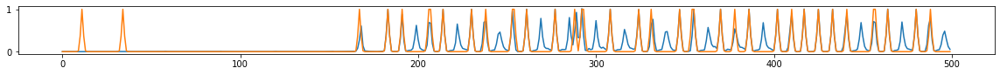

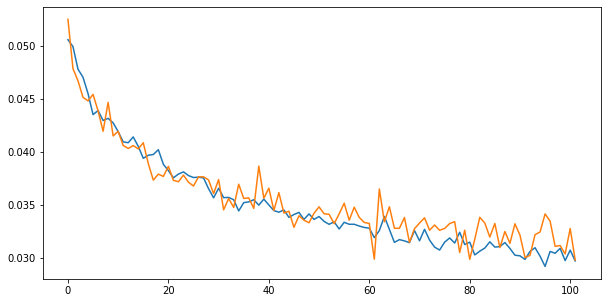

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.04it/s  0.0366                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

104 of 316
TRAIN LOSS: 0.030294508518030245
VAL LOSS: 0.031957886492212616


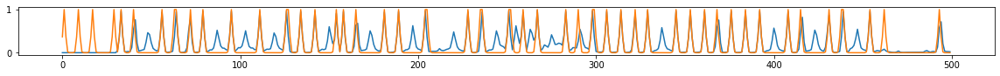

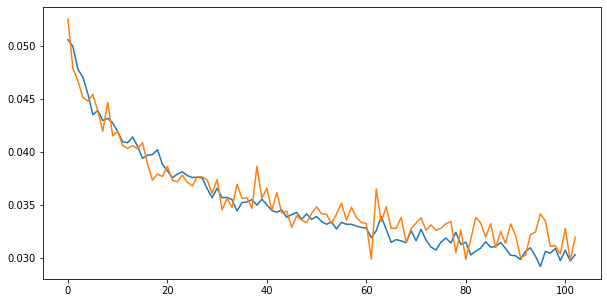

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0272                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

105 of 316
TRAIN LOSS: 0.030240849643531773
VAL LOSS: 0.03200510206321875


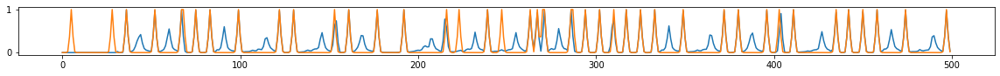

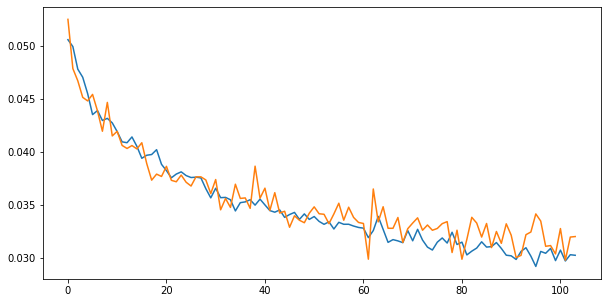

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0317                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

106 of 316
TRAIN LOSS: 0.029172358982678916
VAL LOSS: 0.029869249711434048


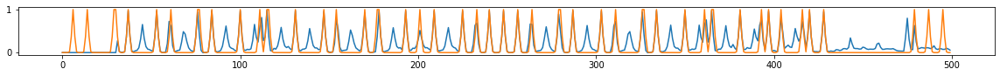

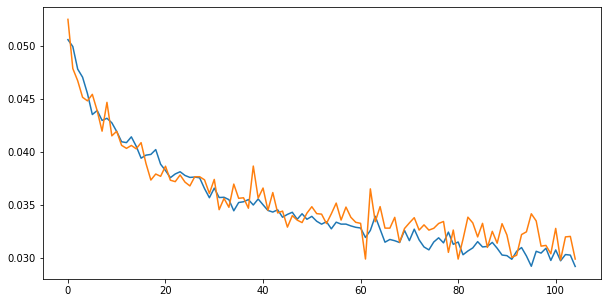

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0298                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

107 of 316
TRAIN LOSS: 0.03014573294462429
VAL LOSS: 0.032687750541501574


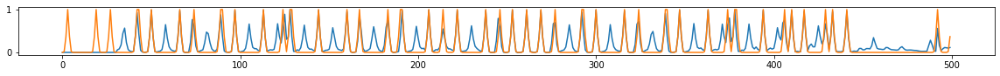

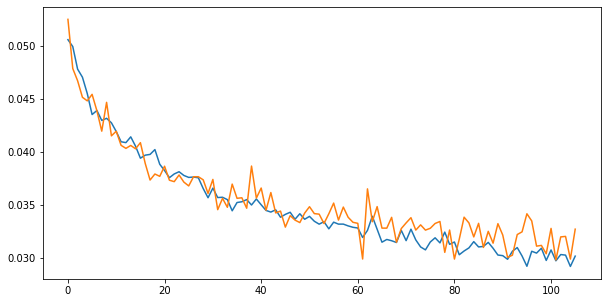

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0330                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

108 of 316
TRAIN LOSS: 0.03008583400191532
VAL LOSS: 0.031080691350830927


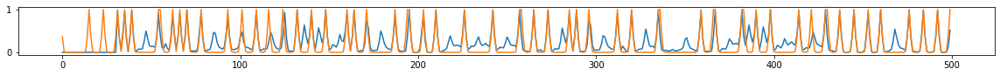

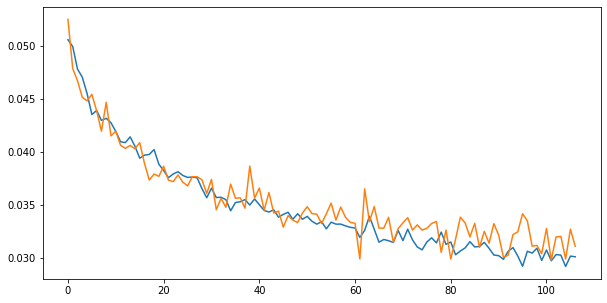

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0267                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

109 of 316
TRAIN LOSS: 0.02981240317846338
VAL LOSS: 0.031115984337197408


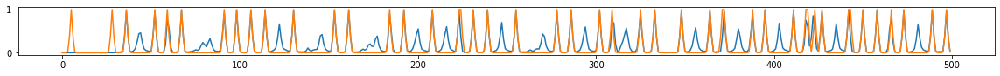

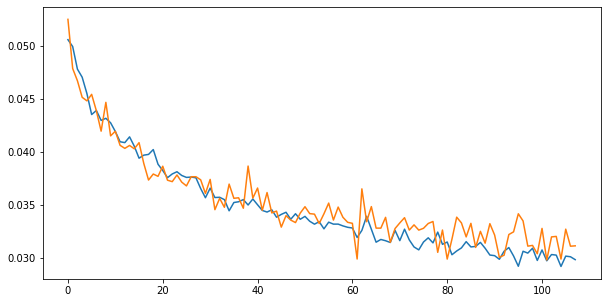

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.28it/s  0.0351                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

110 of 316
TRAIN LOSS: 0.029609104101028707
VAL LOSS: 0.033018524241116315


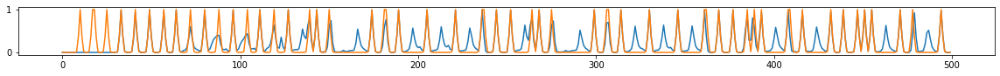

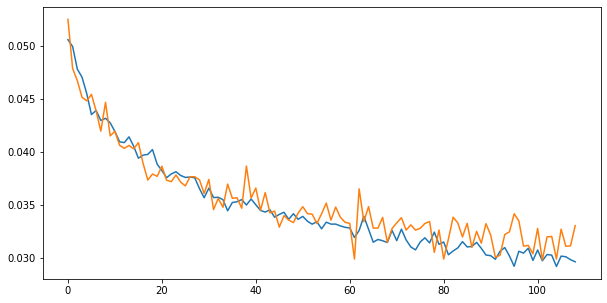

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.99it/s  0.0239                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

111 of 316
TRAIN LOSS: 0.029463363345712423
VAL LOSS: 0.02978442485133807


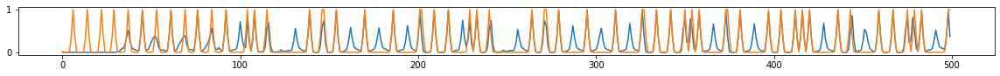

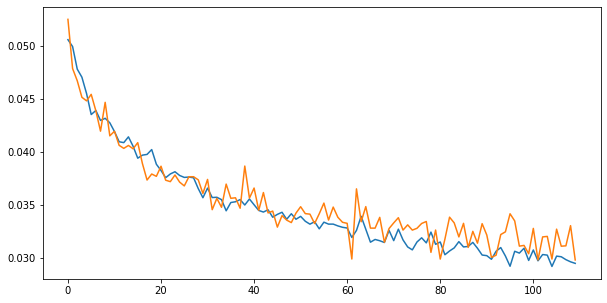

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0309                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

112 of 316
TRAIN LOSS: 0.029862719794942275
VAL LOSS: 0.0317106315245231


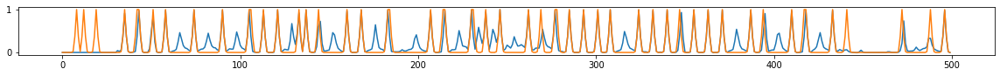

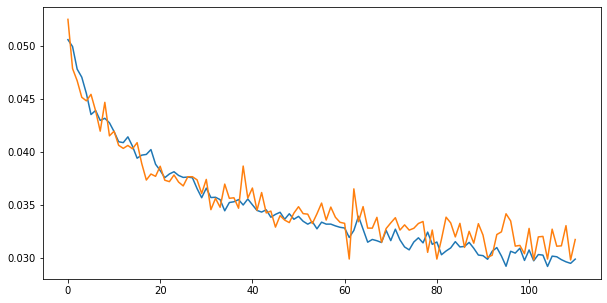

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0312                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

113 of 316
TRAIN LOSS: 0.02940762508660555
VAL LOSS: 0.03319381156729327


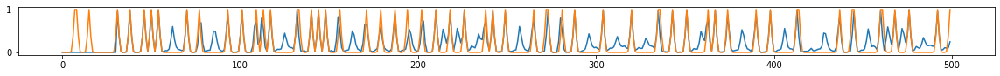

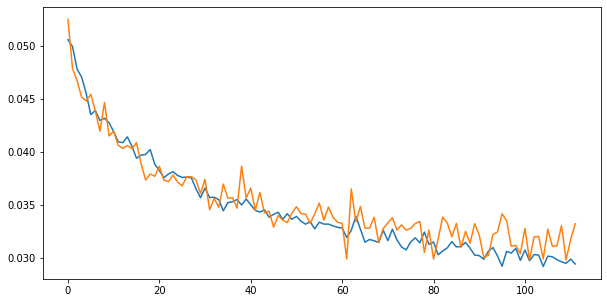

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.93it/s  0.0312                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

114 of 316
TRAIN LOSS: 0.029053302119589515
VAL LOSS: 0.030435747570461698


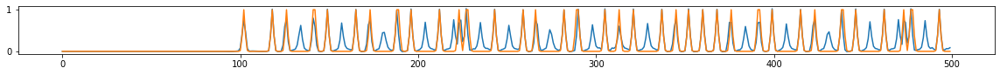

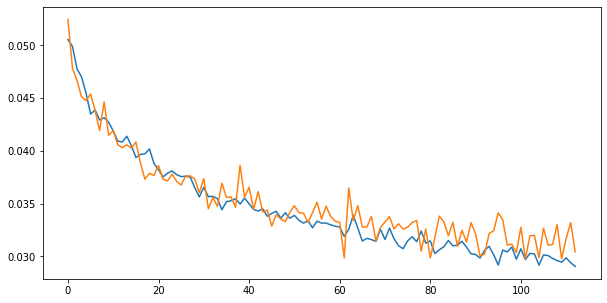

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0267                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

115 of 316
TRAIN LOSS: 0.029533033569653828
VAL LOSS: 0.03107376831273238


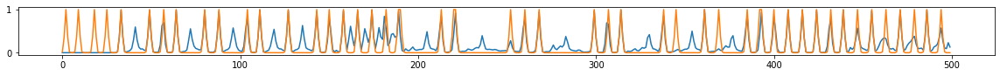

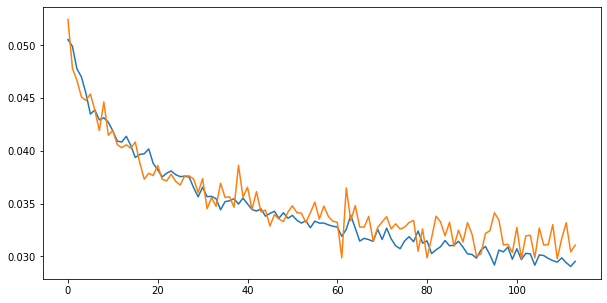

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.97it/s  0.0342                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

116 of 316
TRAIN LOSS: 0.02944382181805041
VAL LOSS: 0.03139258507225248


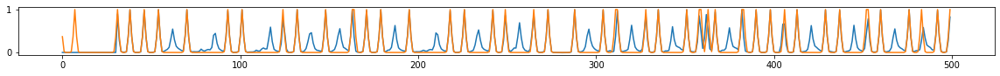

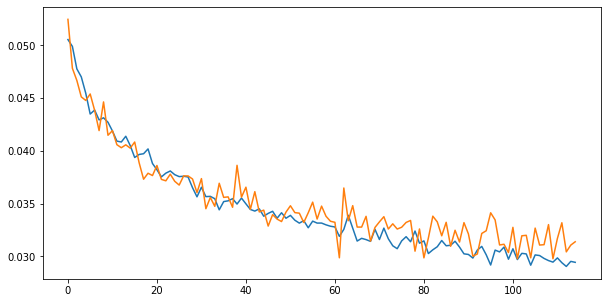

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0288                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

117 of 316
TRAIN LOSS: 0.029952533387889464
VAL LOSS: 0.03191492106351587


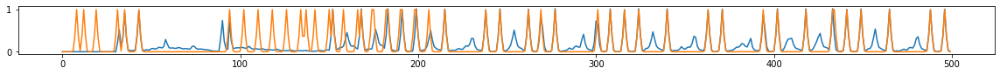

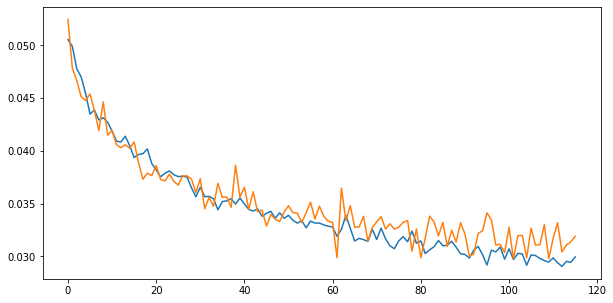

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0280                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

118 of 316
TRAIN LOSS: 0.029834425490763452
VAL LOSS: 0.031211553141474724


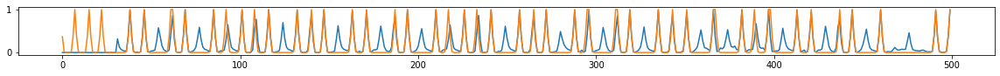

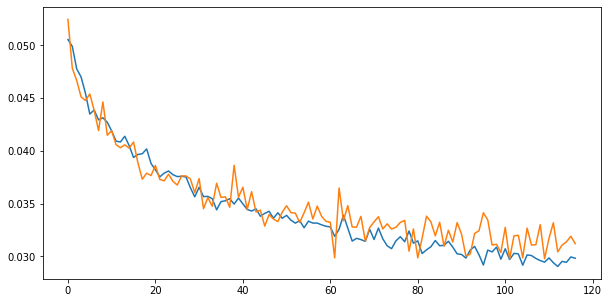

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.05it/s  0.0301                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

119 of 316
TRAIN LOSS: 0.029701430402282212
VAL LOSS: 0.032064915324250855


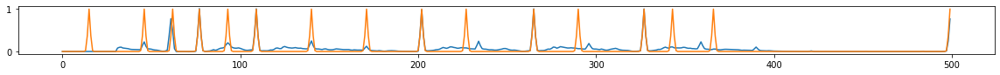

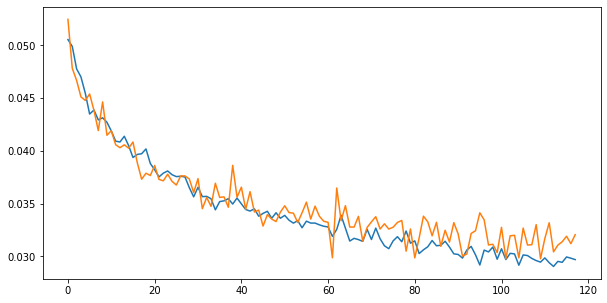

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.24it/s  0.0285                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

120 of 316
TRAIN LOSS: 0.02911072126072314
VAL LOSS: 0.03148096344537205


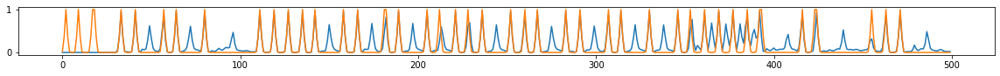

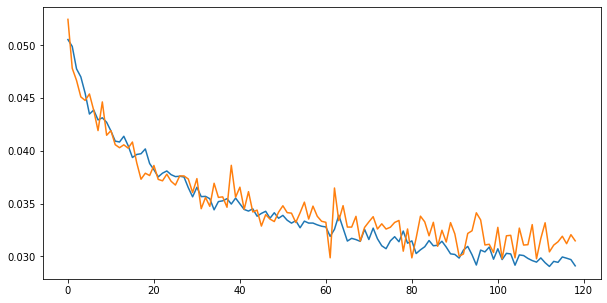

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.93it/s  0.0326                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

121 of 316
TRAIN LOSS: 0.029437095599455967
VAL LOSS: 0.031114644060532253


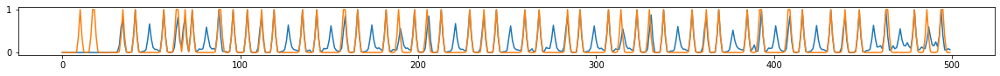

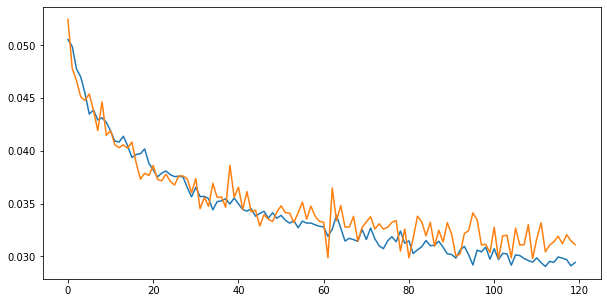

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.97it/s  0.0280                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

122 of 316
TRAIN LOSS: 0.029615949735873275
VAL LOSS: 0.03035696078505781


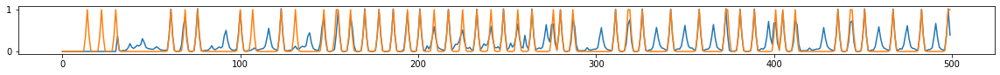

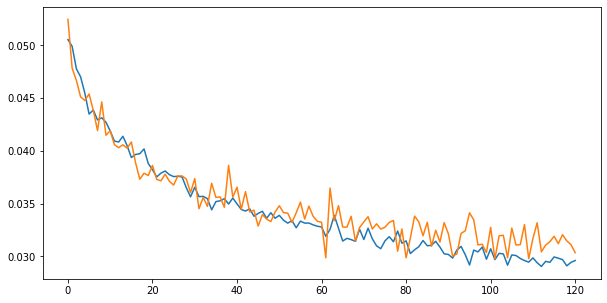

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.24it/s  0.0276                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

123 of 316
TRAIN LOSS: 0.029741743476026587
VAL LOSS: 0.03186483557025591


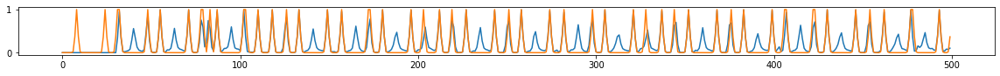

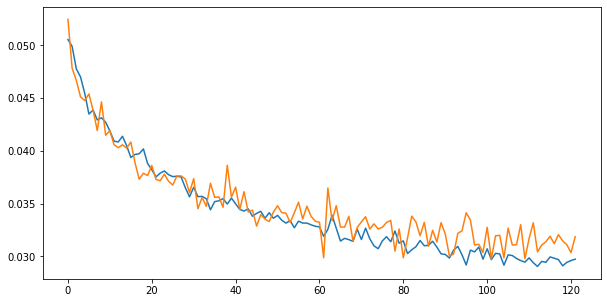

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.20it/s  0.0294                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

124 of 316
TRAIN LOSS: 0.029617827903065417
VAL LOSS: 0.02944896577133073


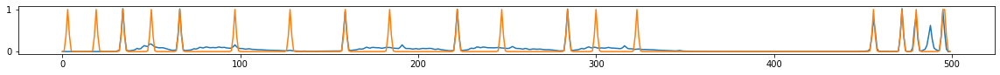

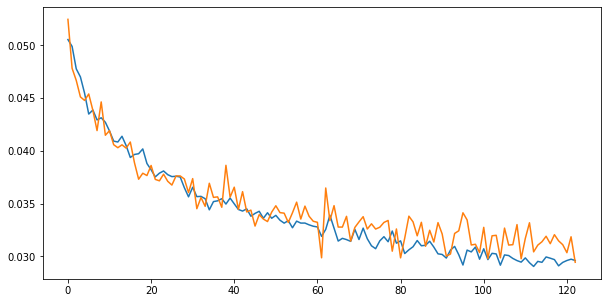

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.03it/s  0.0227                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

125 of 316
TRAIN LOSS: 0.028892333877997264
VAL LOSS: 0.031154306398497686


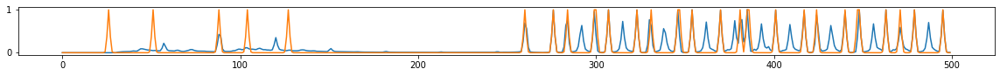

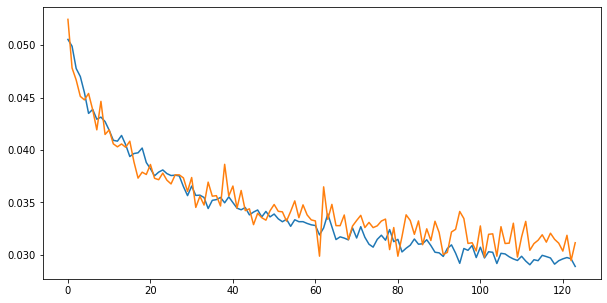

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.12it/s  0.0312                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

126 of 316
TRAIN LOSS: 0.029128114537646372
VAL LOSS: 0.027654901146888733


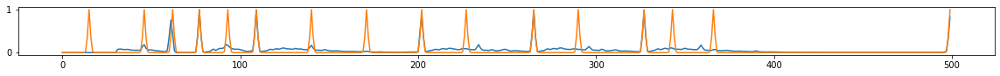

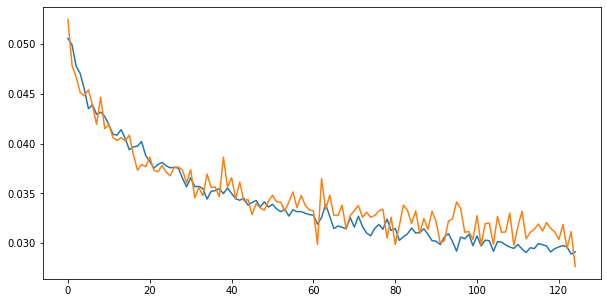

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.98it/s  0.0307                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

127 of 316
TRAIN LOSS: 0.029902115412470367
VAL LOSS: 0.030886868635813396


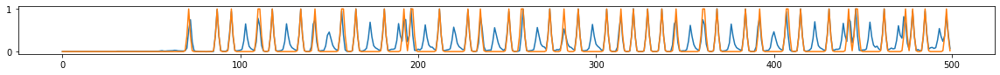

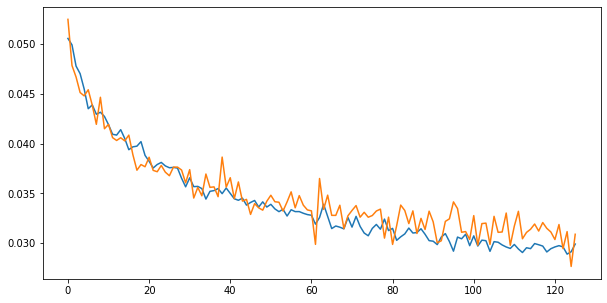

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.96it/s  0.0337                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

128 of 316
TRAIN LOSS: 0.029160538636561897
VAL LOSS: 0.031436517420742244


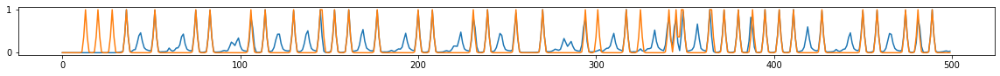

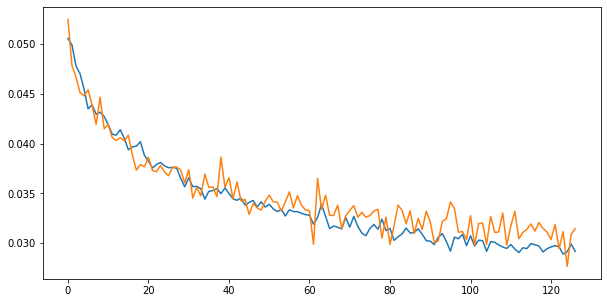

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0348                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

129 of 316
TRAIN LOSS: 0.02877512087838517
VAL LOSS: 0.032202591084771685


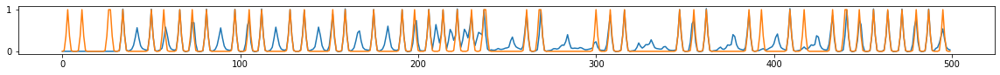

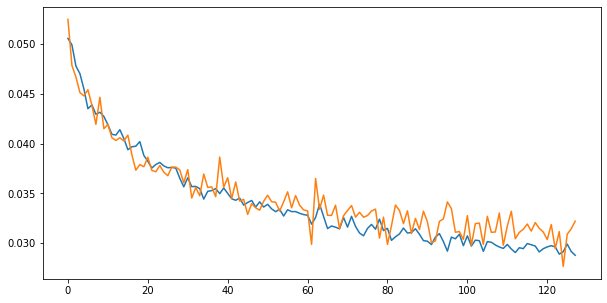

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.97it/s  0.0234                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

130 of 316
TRAIN LOSS: 0.028277481699155435
VAL LOSS: 0.03049924990369214


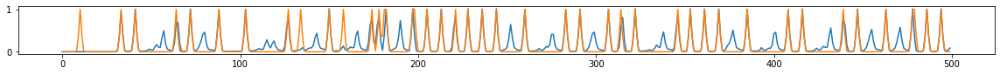

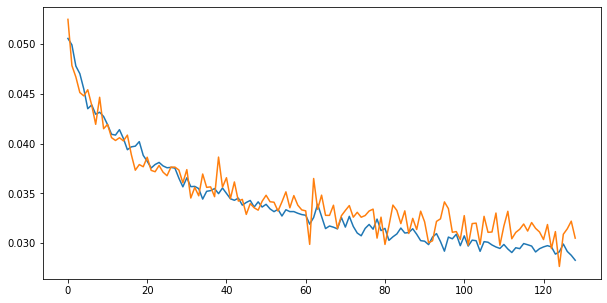

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0368                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

131 of 316
TRAIN LOSS: 0.028804806992411613
VAL LOSS: 0.030349881077806156


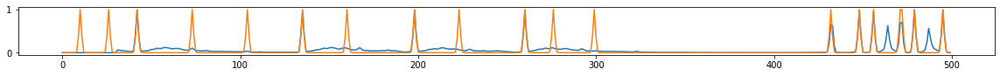

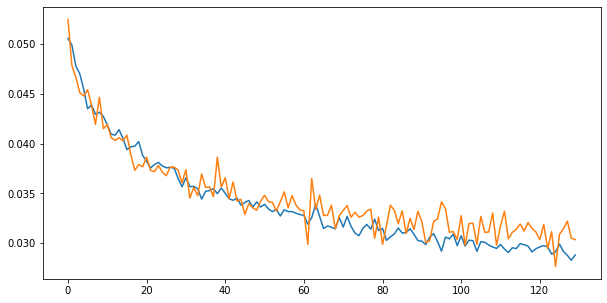

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.16it/s  0.0237                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

132 of 316
TRAIN LOSS: 0.028630846749163337
VAL LOSS: 0.03134932948483361


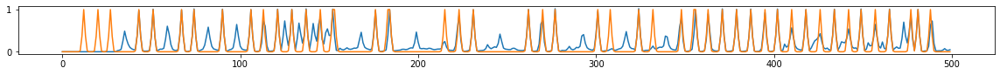

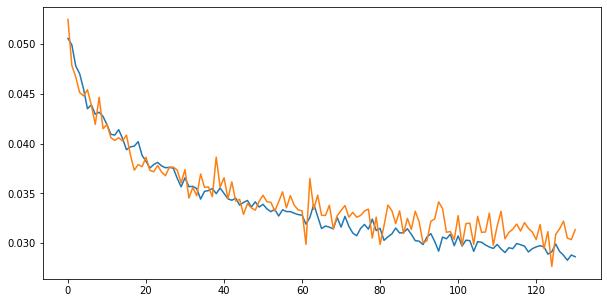

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.23it/s  0.0282                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

133 of 316
TRAIN LOSS: 0.02871687167013685
VAL LOSS: 0.030997792672779825


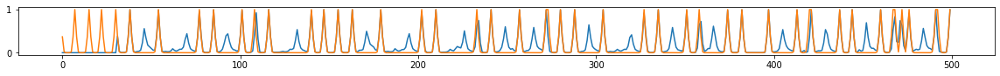

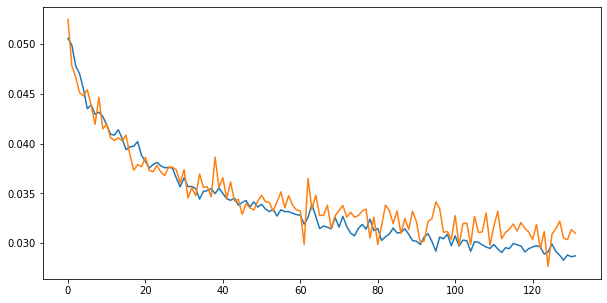

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.10it/s  0.0230                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

134 of 316
TRAIN LOSS: 0.029014096957527928
VAL LOSS: 0.03150479205780559


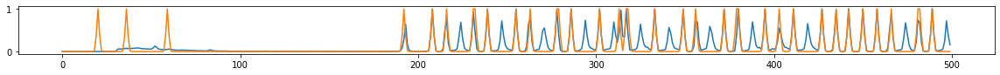

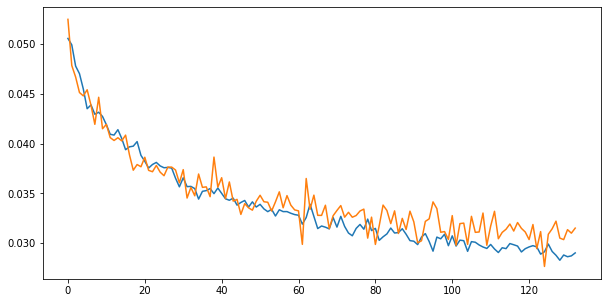

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.20it/s  0.0338                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

135 of 316
TRAIN LOSS: 0.02918428358518415
VAL LOSS: 0.029903229532970324


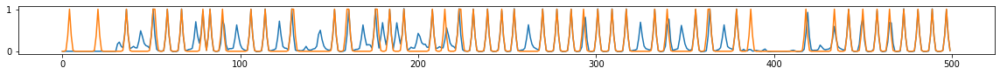

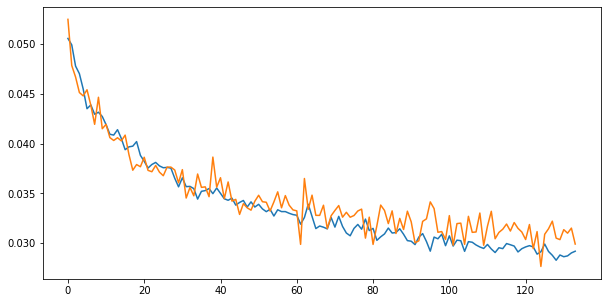

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.00it/s  0.0252                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

136 of 316
TRAIN LOSS: 0.028504718974646594
VAL LOSS: 0.02935081244342857


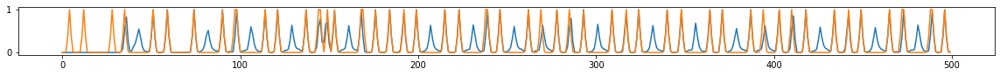

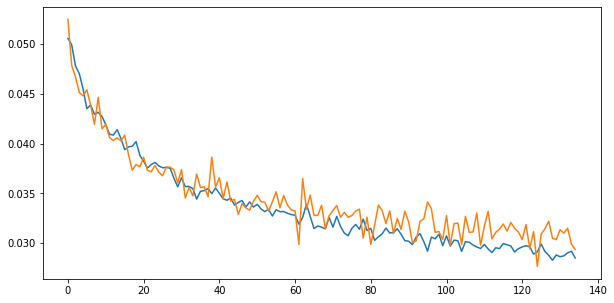

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.08it/s  0.0331                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

137 of 316
TRAIN LOSS: 0.0288440166041255
VAL LOSS: 0.03219372034072876


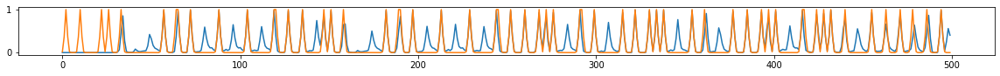

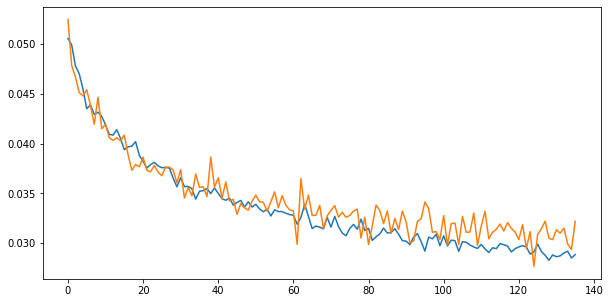

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.11it/s  0.0288                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

138 of 316
TRAIN LOSS: 0.028100251944528684
VAL LOSS: 0.032494507316086024


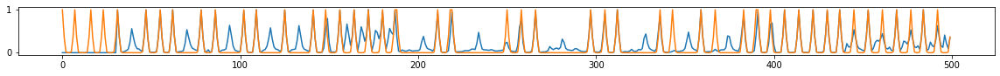

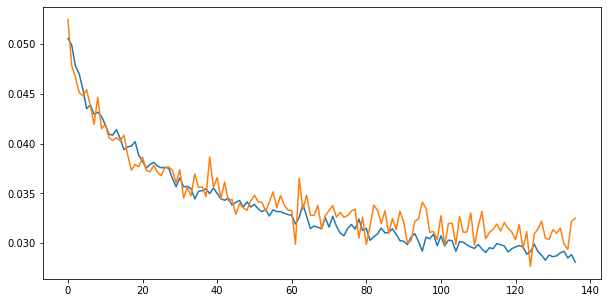

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0238                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

139 of 316
TRAIN LOSS: 0.028949403773165412
VAL LOSS: 0.03166578337550163


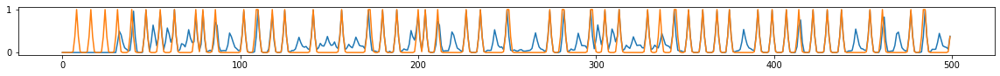

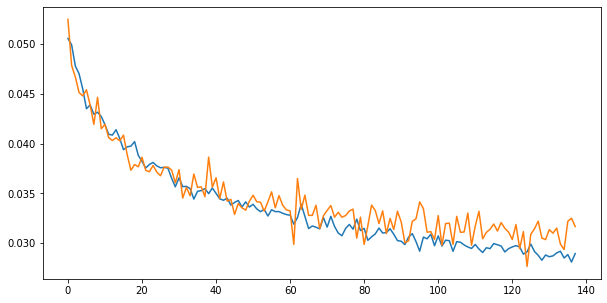

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0282                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

140 of 316
TRAIN LOSS: 0.029345738753262494
VAL LOSS: 0.030194526124331687


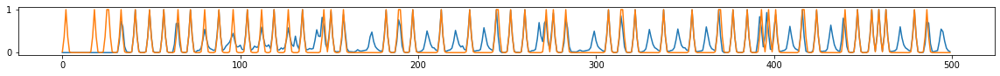

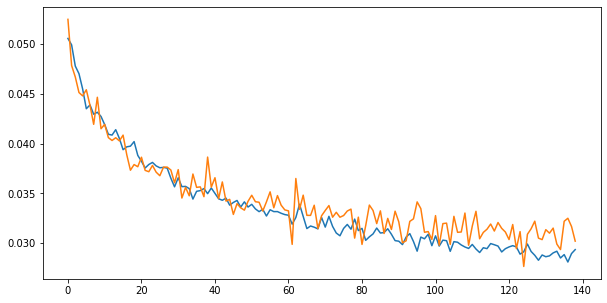

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0282                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

141 of 316
TRAIN LOSS: 0.0288713488003446
VAL LOSS: 0.030071475232640903


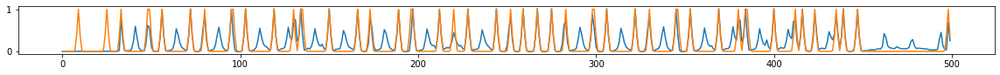

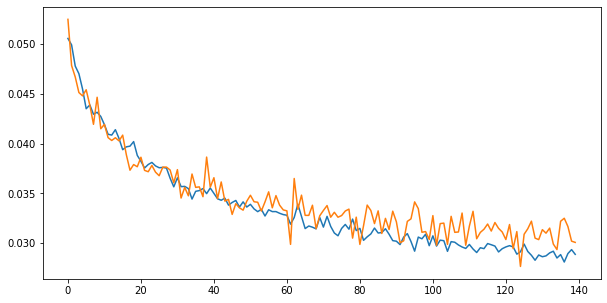

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.11it/s  0.0269                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

142 of 316
TRAIN LOSS: 0.02769708824861381
VAL LOSS: 0.029470110312104225


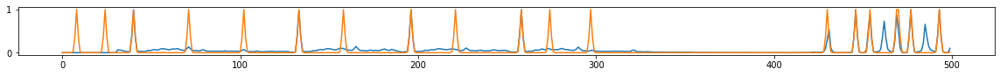

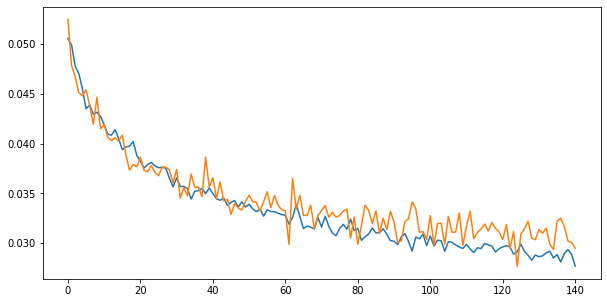

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.21it/s  0.0346                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

143 of 316
TRAIN LOSS: 0.028571751589576404
VAL LOSS: 0.030984878953960206


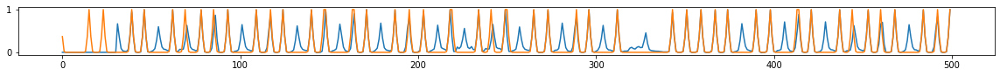

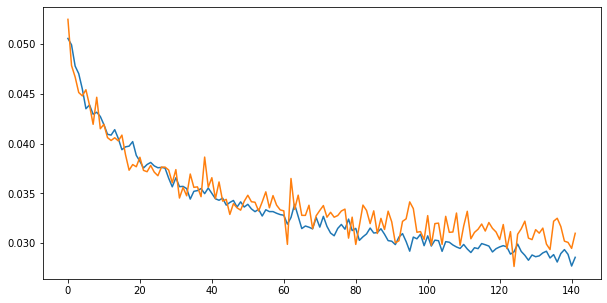

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0246                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

144 of 316
TRAIN LOSS: 0.02944442831600706
VAL LOSS: 0.029475344758894708


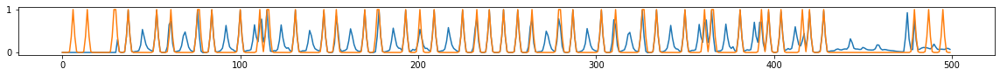

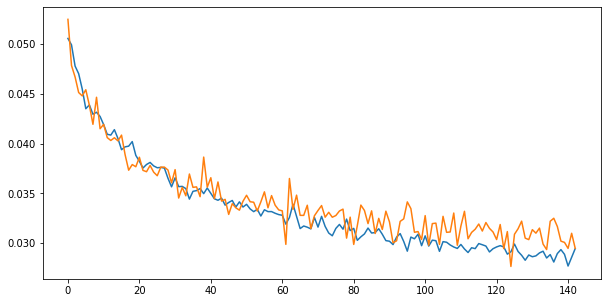

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.03it/s  0.0255                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

145 of 316
TRAIN LOSS: 0.02811724366620183
VAL LOSS: 0.0316710588004854


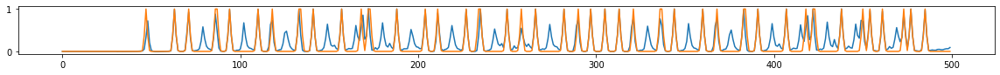

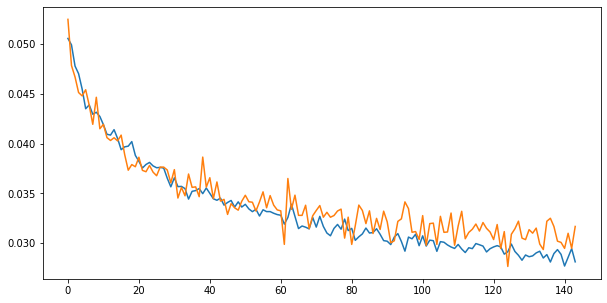

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0234                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

146 of 316
TRAIN LOSS: 0.028080010476211708
VAL LOSS: 0.03141054738726881


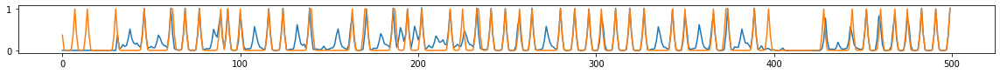

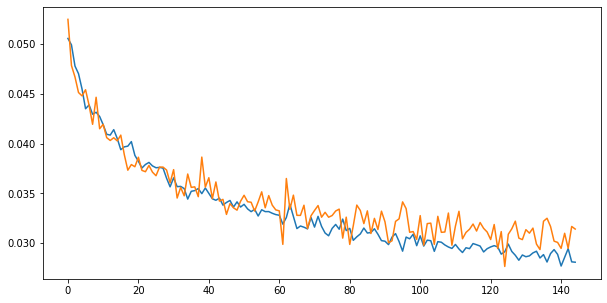

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.16it/s  0.0323                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

147 of 316
TRAIN LOSS: 0.028481301127208605
VAL LOSS: 0.030273149410883587


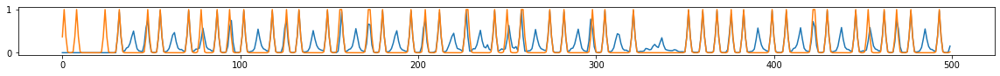

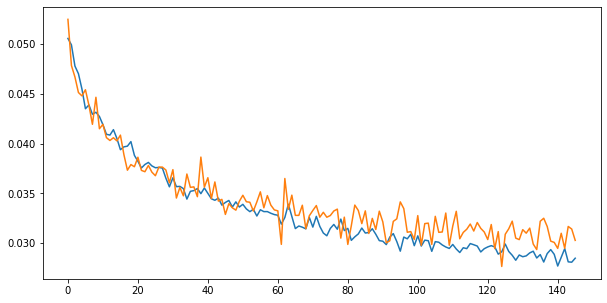

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.02it/s  0.0336                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

148 of 316
TRAIN LOSS: 0.029101024692257244
VAL LOSS: 0.030489074273241892


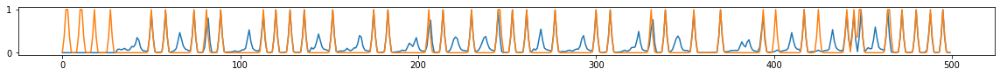

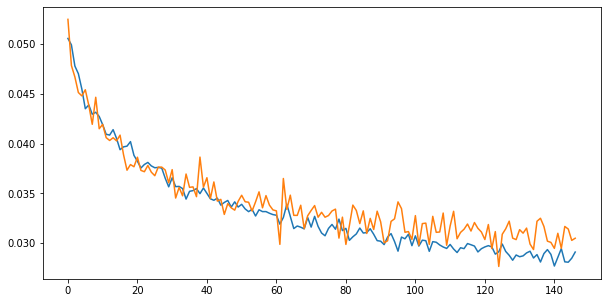

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0252                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

149 of 316
TRAIN LOSS: 0.028305814704961248
VAL LOSS: 0.031087671717007954


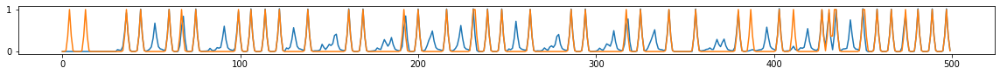

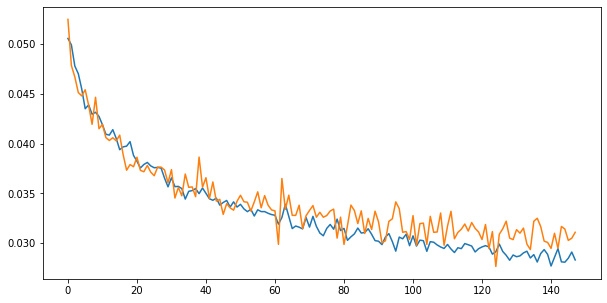

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.91it/s  0.0273                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

150 of 316
TRAIN LOSS: 0.028518534679379728
VAL LOSS: 0.031031223427918222


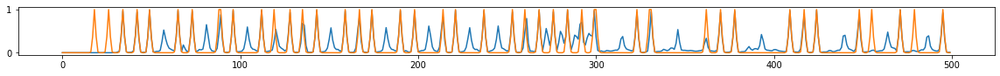

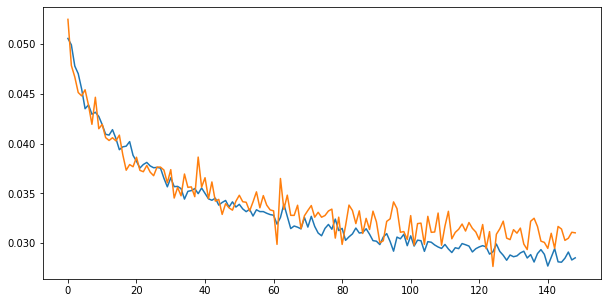

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.10it/s  0.0290                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

151 of 316
TRAIN LOSS: 0.02892304931042923
VAL LOSS: 0.0313975608183278


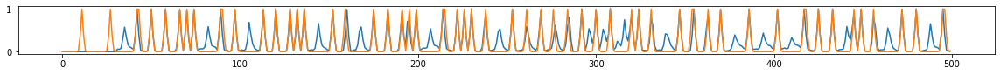

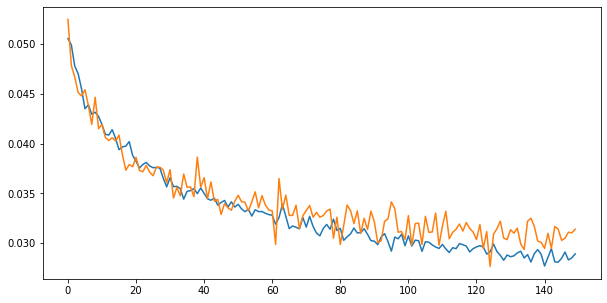

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0349                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

152 of 316
TRAIN LOSS: 0.027984848245978355
VAL LOSS: 0.02869420250256856


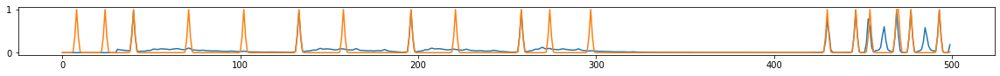

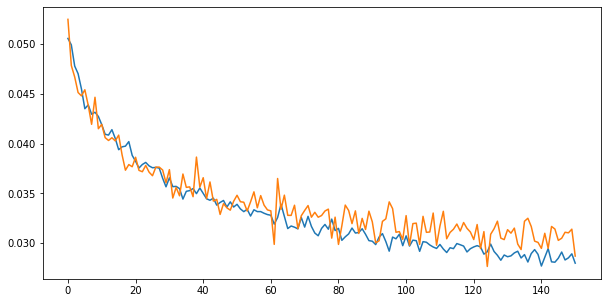

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.12it/s  0.0331                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

153 of 316
TRAIN LOSS: 0.028422735631465912
VAL LOSS: 0.029410382732748985


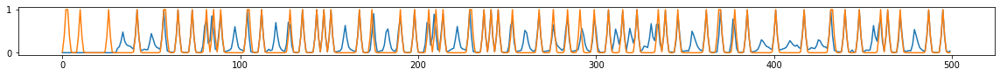

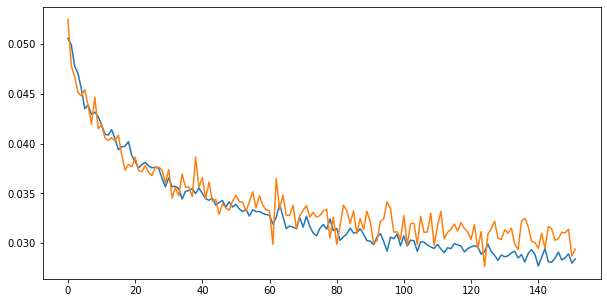

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0345                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

154 of 316
TRAIN LOSS: 0.027911961337344512
VAL LOSS: 0.029637373776899442


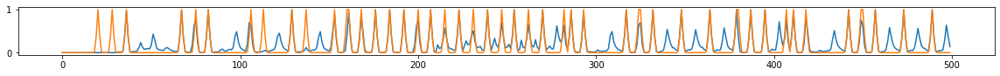

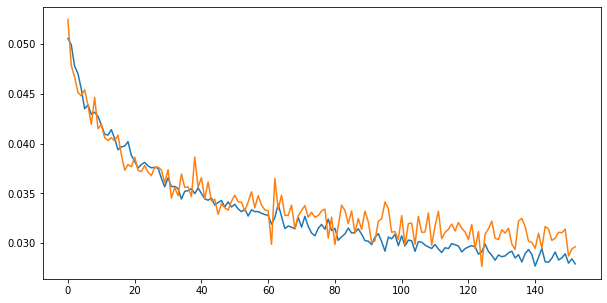

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.20it/s  0.0302                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

155 of 316
TRAIN LOSS: 0.027715013569427863
VAL LOSS: 0.028650347143411636


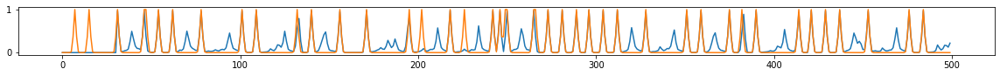

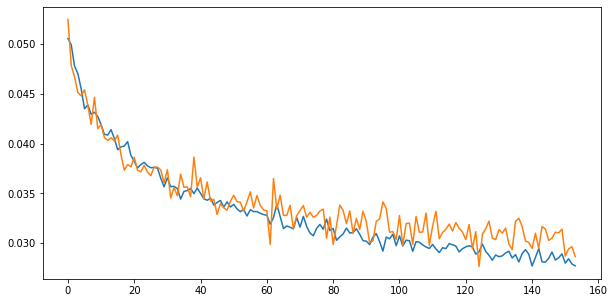

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.05it/s  0.0261                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

156 of 316
TRAIN LOSS: 0.028287474479940202
VAL LOSS: 0.031248547343744174


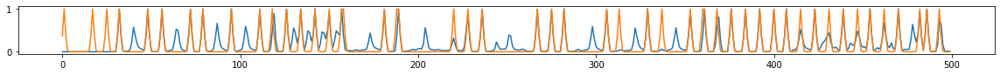

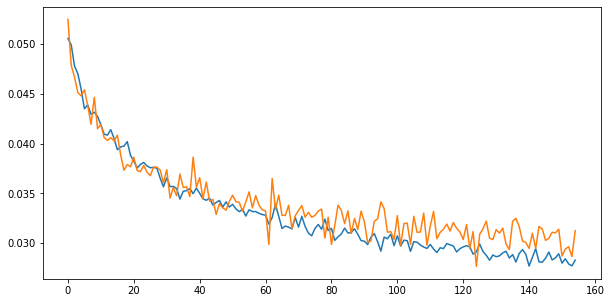

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0267                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

157 of 316
TRAIN LOSS: 0.02821556856441829
VAL LOSS: 0.030493786972430017


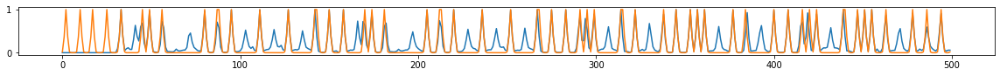

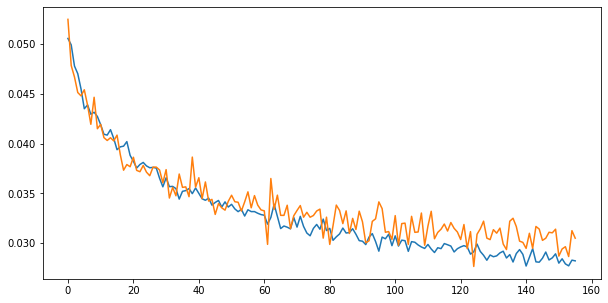

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.85it/s  0.0291                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

158 of 316
TRAIN LOSS: 0.028747461477501526
VAL LOSS: 0.03064993831018607


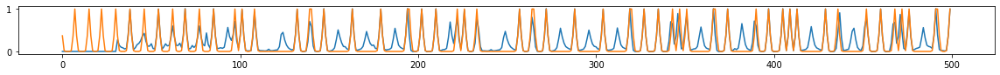

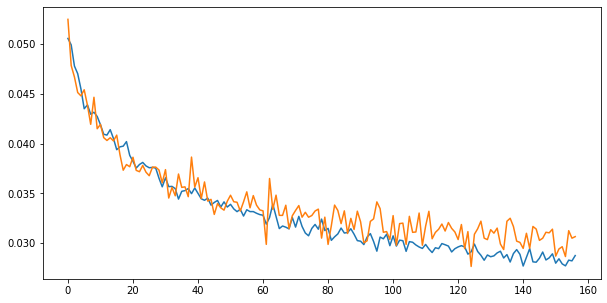

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0286                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

159 of 316
TRAIN LOSS: 0.028734472735474508
VAL LOSS: 0.02899947990145948


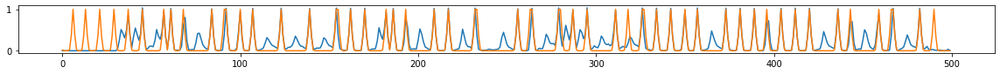

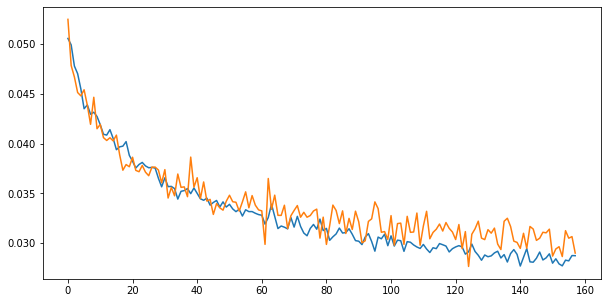

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.26it/s  0.0287                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

160 of 316
TRAIN LOSS: 0.027899234348701105
VAL LOSS: 0.029404003587034013


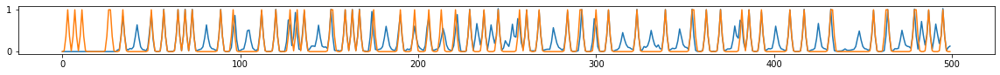

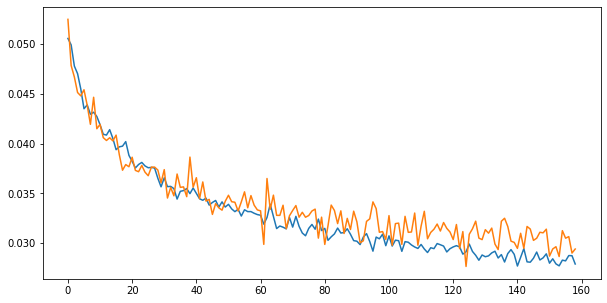

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.91it/s  0.0241                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

161 of 316
TRAIN LOSS: 0.02844275798027714
VAL LOSS: 0.030846485040254064


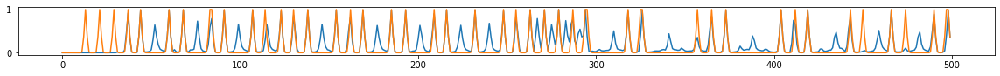

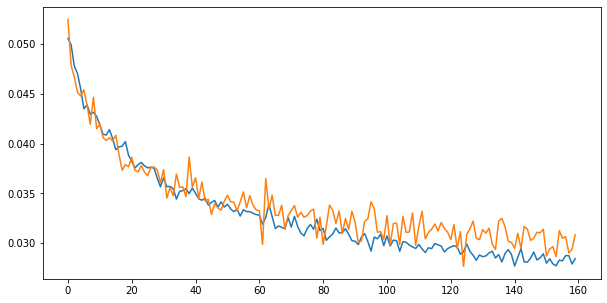

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.77it/s  0.0260                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

162 of 316
TRAIN LOSS: 0.028461447244303092
VAL LOSS: 0.03152782532076041


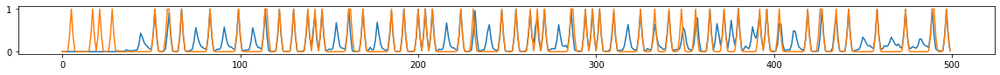

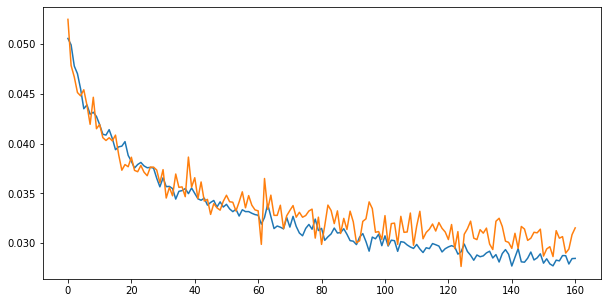

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0292                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

163 of 316
TRAIN LOSS: 0.02827520730594794
VAL LOSS: 0.030217066407203674


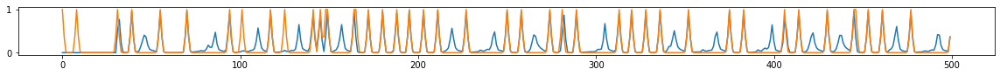

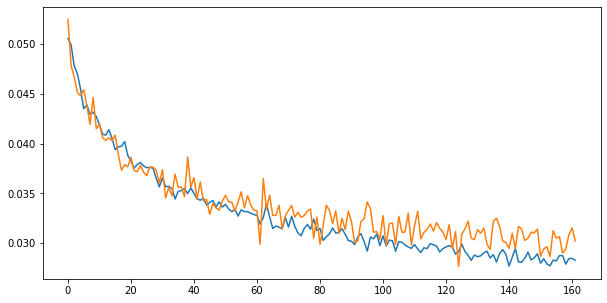

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.13it/s  0.0337                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

164 of 316
TRAIN LOSS: 0.027220749244507816
VAL LOSS: 0.029458749004536204


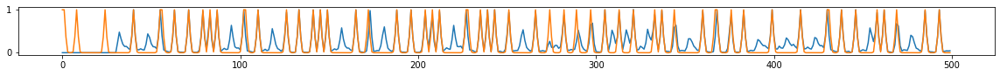

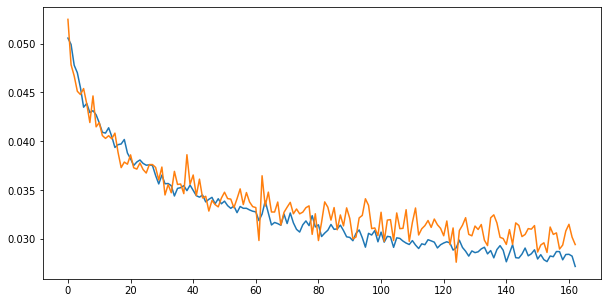

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0270                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

165 of 316
TRAIN LOSS: 0.02878514216798875
VAL LOSS: 0.031223102162281673


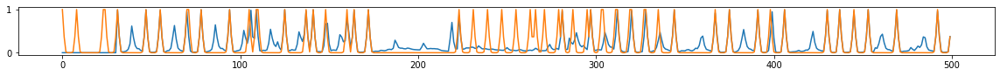

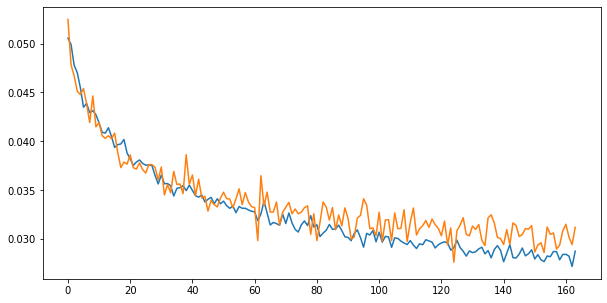

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.10it/s  0.0240                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

166 of 316
TRAIN LOSS: 0.02754405430621571
VAL LOSS: 0.03009806138773759


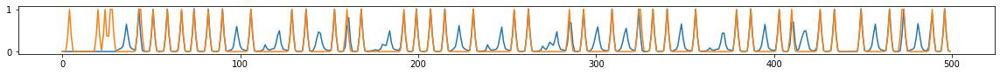

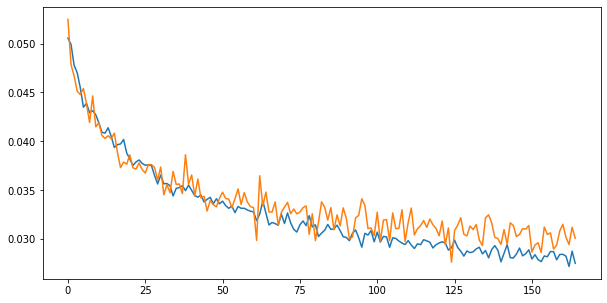

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0320                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

167 of 316
TRAIN LOSS: 0.02815249903748433
VAL LOSS: 0.03055527764889929


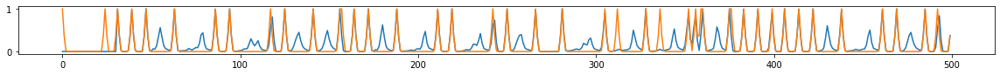

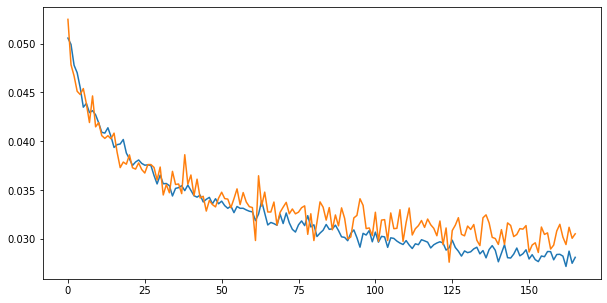

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.22it/s  0.0286                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

168 of 316
TRAIN LOSS: 0.02745936666097906
VAL LOSS: 0.030247413656777807


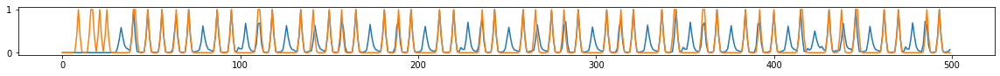

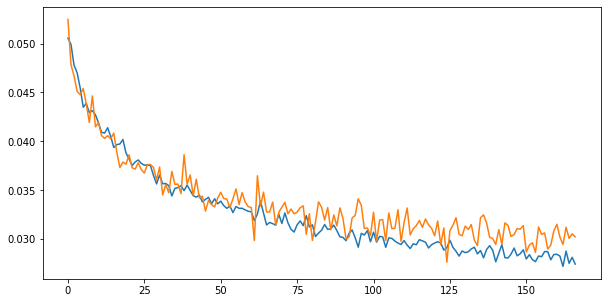

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0270                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

169 of 316
TRAIN LOSS: 0.027439232863899734
VAL LOSS: 0.030040811126430828


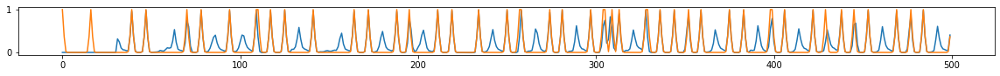

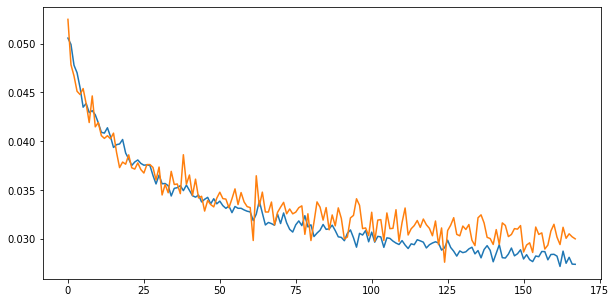

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0332                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

170 of 316
TRAIN LOSS: 0.028335286666535668
VAL LOSS: 0.030016944640212588


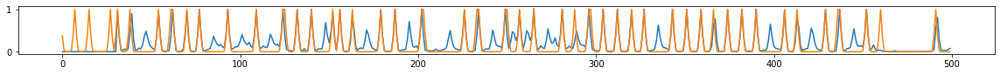

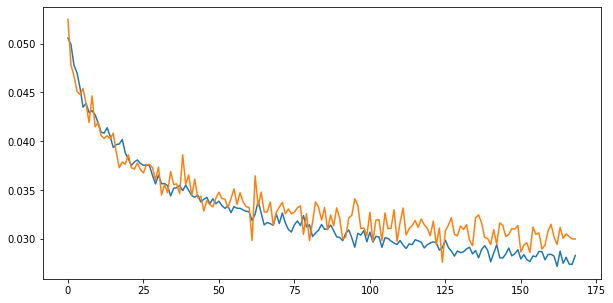

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.25it/s  0.0294                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

171 of 316
TRAIN LOSS: 0.027379901562299993
VAL LOSS: 0.030223491912086804


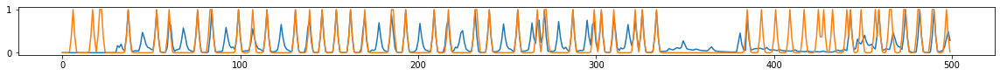

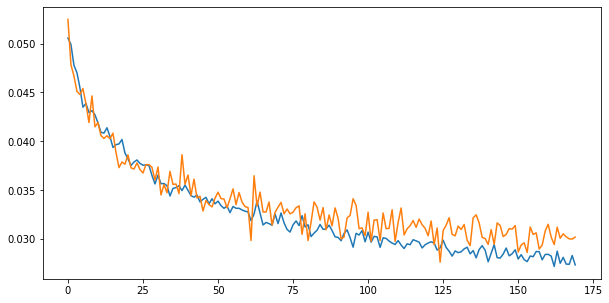

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.21it/s  0.0244                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

172 of 316
TRAIN LOSS: 0.027660733606252406
VAL LOSS: 0.02992453488210837


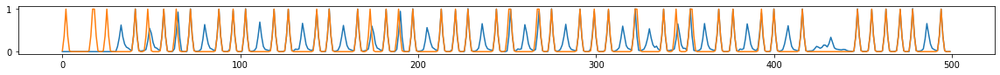

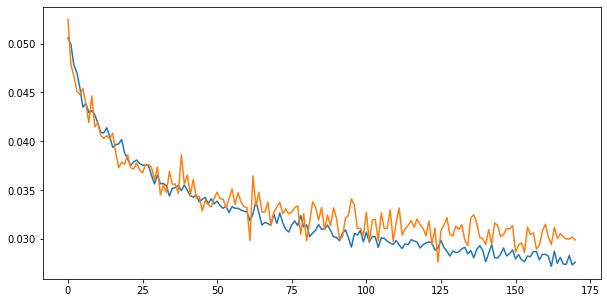

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.23it/s  0.0293                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

173 of 316
TRAIN LOSS: 0.02735868137743738
VAL LOSS: 0.030497197061777115


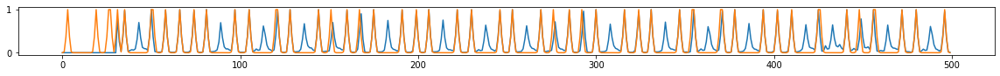

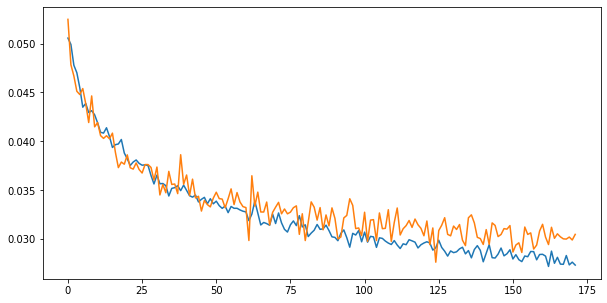

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0275                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

174 of 316
TRAIN LOSS: 0.027709722156739898
VAL LOSS: 0.030497401331861813


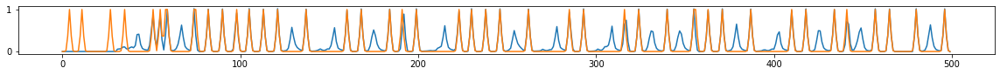

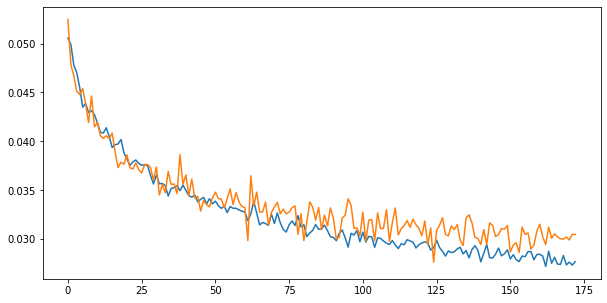

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0295                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

175 of 316
TRAIN LOSS: 0.02849032688472006
VAL LOSS: 0.030837094618214503


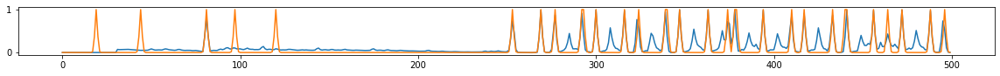

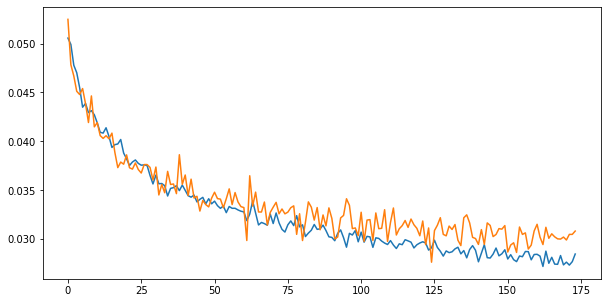

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.83it/s  0.0233                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

176 of 316
TRAIN LOSS: 0.028191130039178662
VAL LOSS: 0.028977834930022556


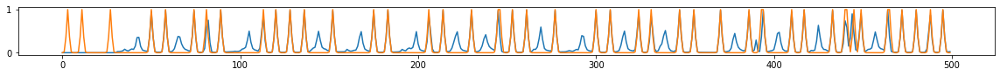

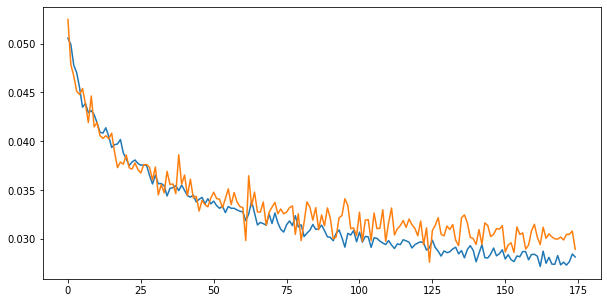

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0273                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

177 of 316
TRAIN LOSS: 0.02769617834645841
VAL LOSS: 0.03133827323714892


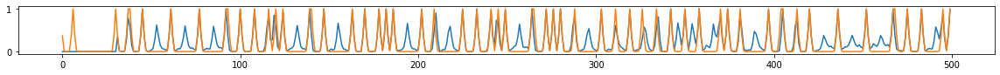

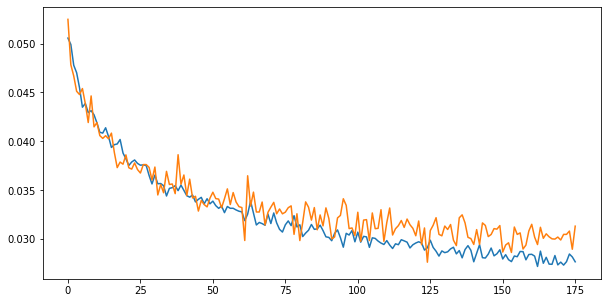

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.12it/s  0.0274                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

178 of 316
TRAIN LOSS: 0.02730613336380985
VAL LOSS: 0.02983333936168088


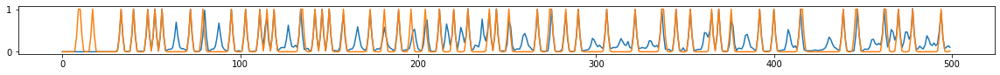

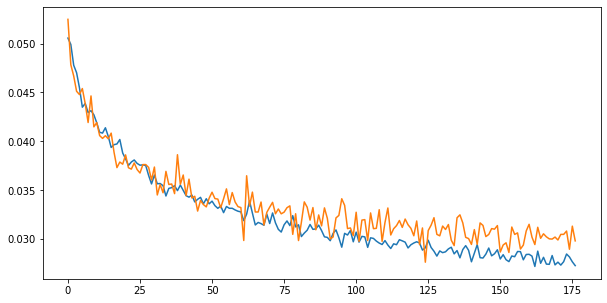

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0292                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

179 of 316
TRAIN LOSS: 0.028922223227305546
VAL LOSS: 0.03111912165251043


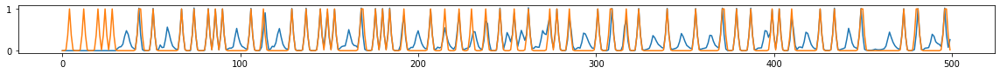

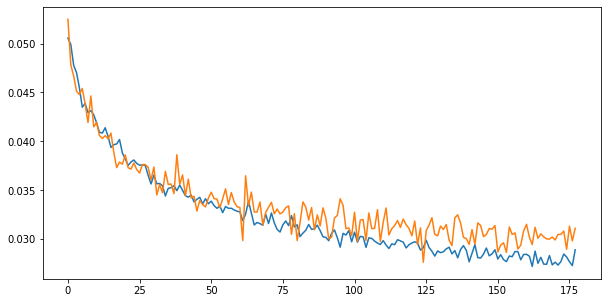

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0326                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

180 of 316
TRAIN LOSS: 0.027579747813029423
VAL LOSS: 0.031113286192218464


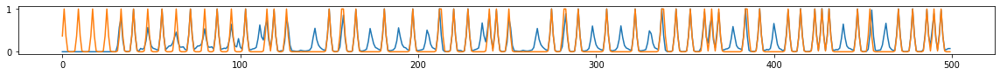

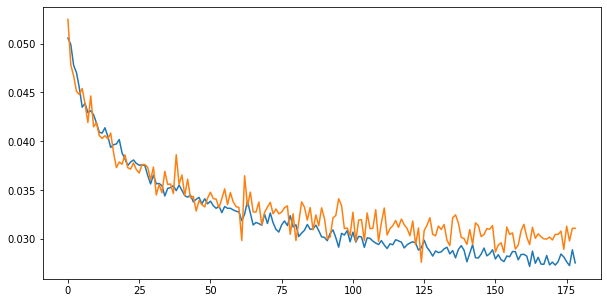

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.10it/s  0.0295                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

181 of 316
TRAIN LOSS: 0.02776996786188748
VAL LOSS: 0.028332556908329327


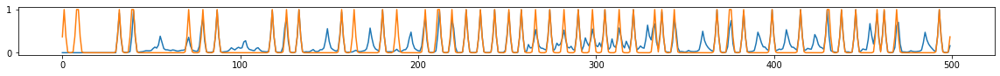

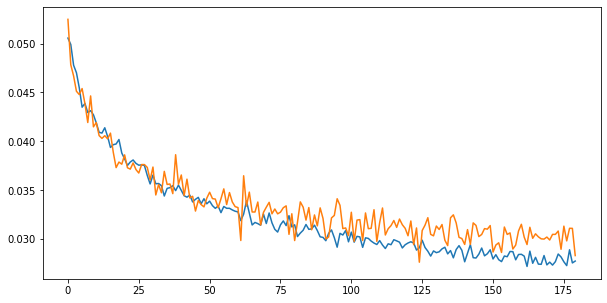

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0282                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

182 of 316
TRAIN LOSS: 0.028116634995159175
VAL LOSS: 0.03205706717239486


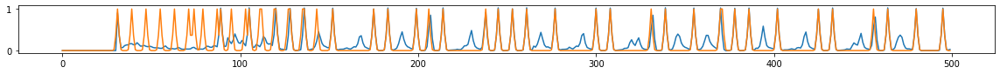

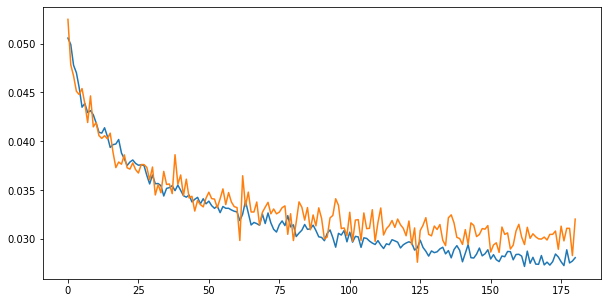

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.82it/s  0.0239                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

183 of 316
TRAIN LOSS: 0.027658363855961297
VAL LOSS: 0.030031913270552952


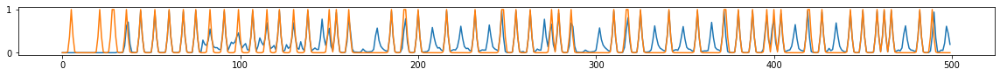

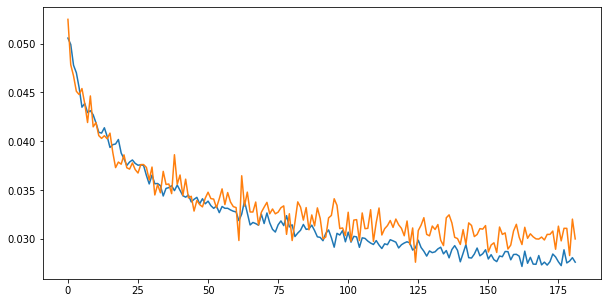

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.21it/s  0.0319                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

184 of 316
TRAIN LOSS: 0.02770458275659217
VAL LOSS: 0.030574999542699918


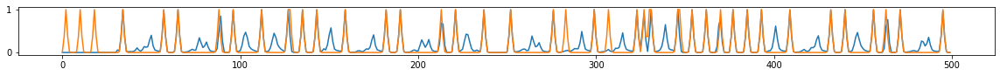

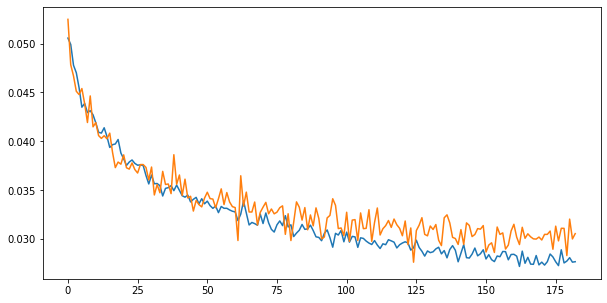

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.19it/s  0.0322                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

185 of 316
TRAIN LOSS: 0.026585769684364397
VAL LOSS: 0.030410086115201313


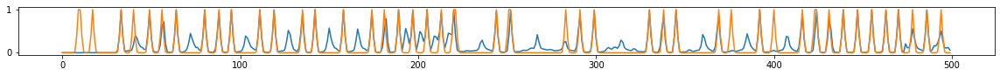

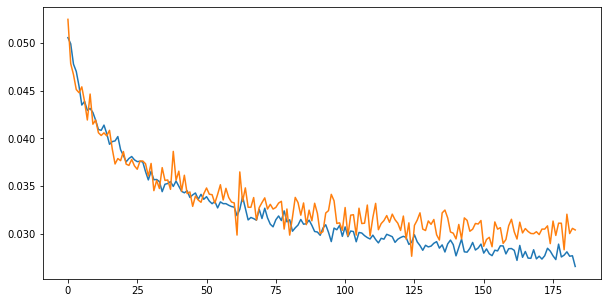

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.12it/s  0.0228                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

186 of 316
TRAIN LOSS: 0.027931542239255376
VAL LOSS: 0.03091289372079902


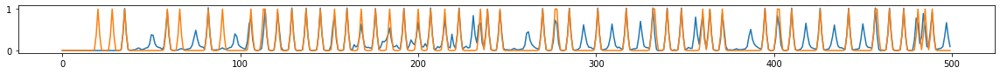

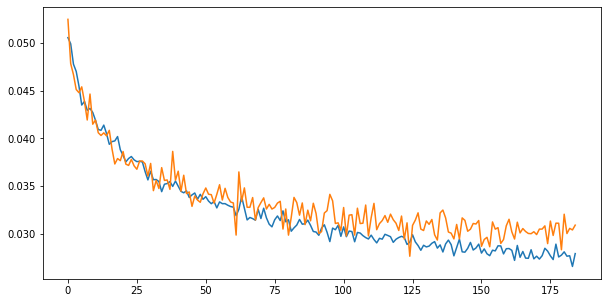

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.99it/s  0.0268                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

187 of 316
TRAIN LOSS: 0.027440744245217905
VAL LOSS: 0.02901398970021142


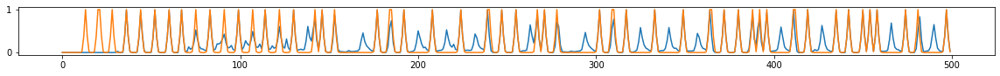

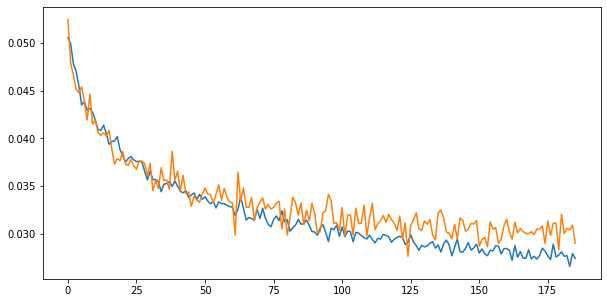

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.09it/s  0.0320                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

188 of 316
TRAIN LOSS: 0.026771065054668322
VAL LOSS: 0.03151666083269649


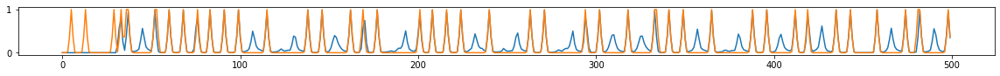

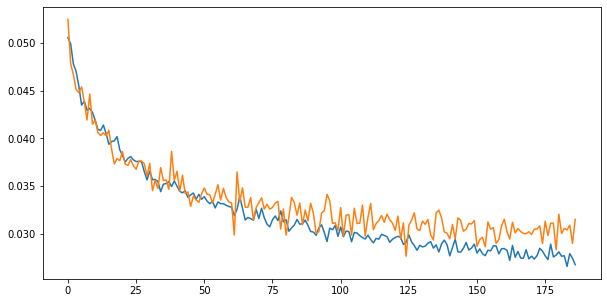

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.06it/s  0.0387                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

189 of 316
TRAIN LOSS: 0.027802897048079304
VAL LOSS: 0.029768663148085277


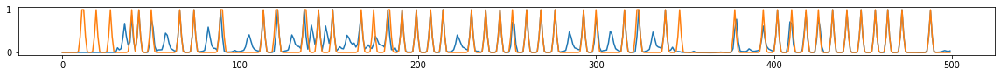

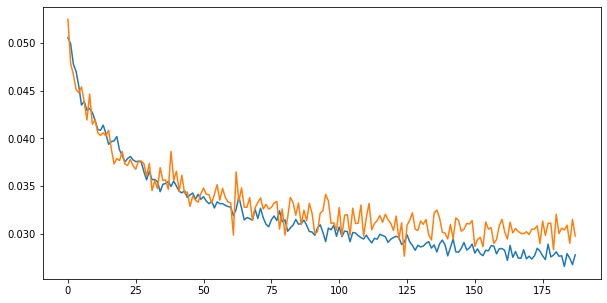

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0268                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

190 of 316
TRAIN LOSS: 0.028083690028223727
VAL LOSS: 0.028204600430197187


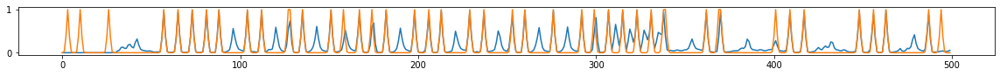

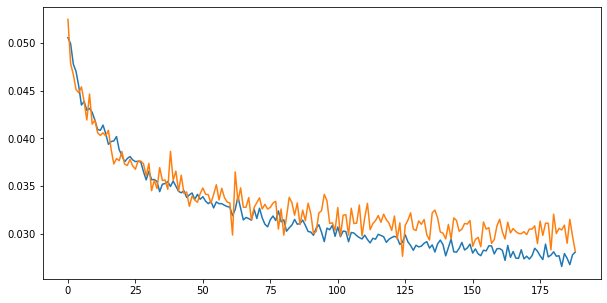

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.01it/s  0.0299                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

191 of 316
TRAIN LOSS: 0.027858739770534966
VAL LOSS: 0.03178956359624863


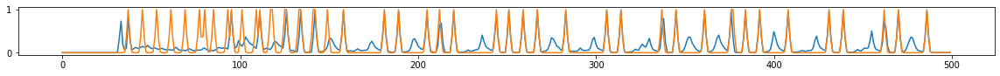

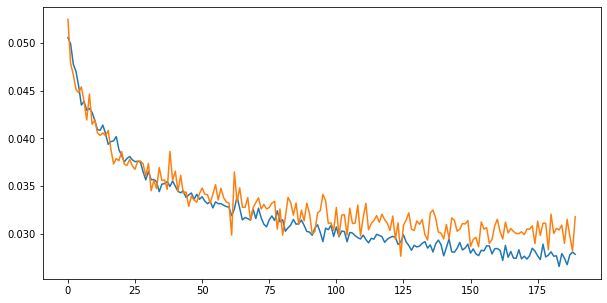

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.94it/s  0.0258                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

192 of 316
TRAIN LOSS: 0.02681234861827559
VAL LOSS: 0.03198554594483641


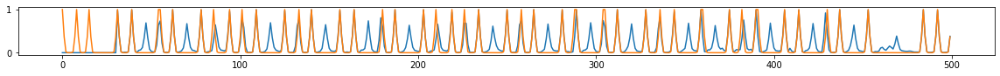

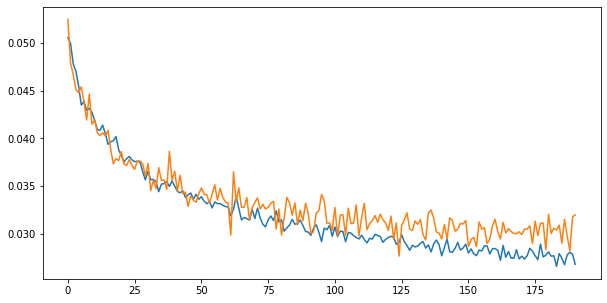

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.05it/s  0.0271                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

193 of 316
TRAIN LOSS: 0.02713788083444039
VAL LOSS: 0.03045051544904709


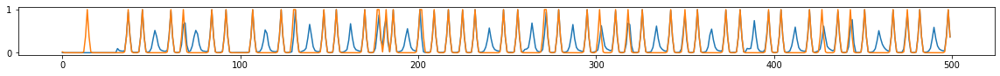

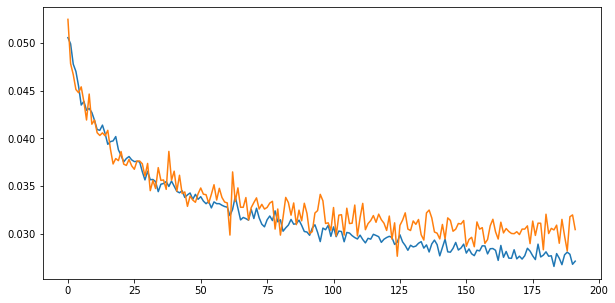

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.03it/s  0.0313                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

194 of 316
TRAIN LOSS: 0.027107085877408583
VAL LOSS: 0.028651545031203166


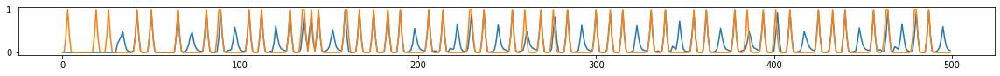

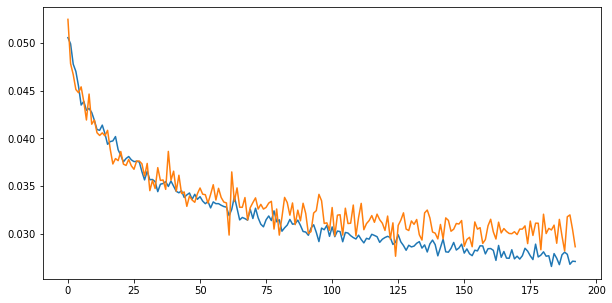

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0270                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

195 of 316
TRAIN LOSS: 0.027189713281889755
VAL LOSS: 0.030663979550202686


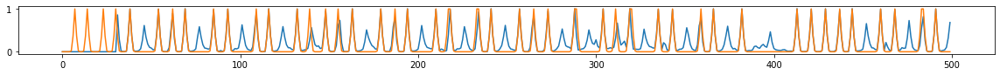

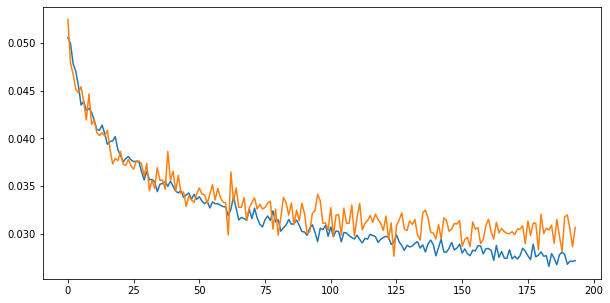

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.14it/s  0.0261                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

196 of 316
TRAIN LOSS: 0.027452695235196087
VAL LOSS: 0.029604371844066515


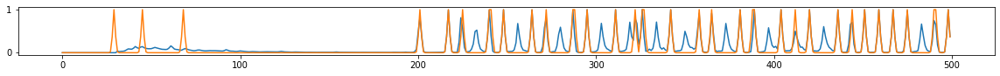

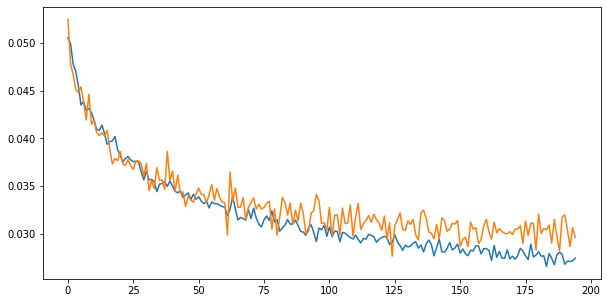

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.06it/s  0.0262                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

197 of 316
TRAIN LOSS: 0.026614242129855685
VAL LOSS: 0.029034730253948107


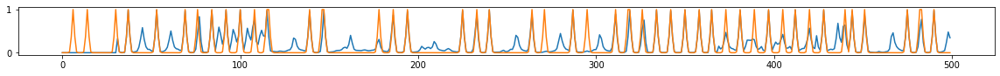

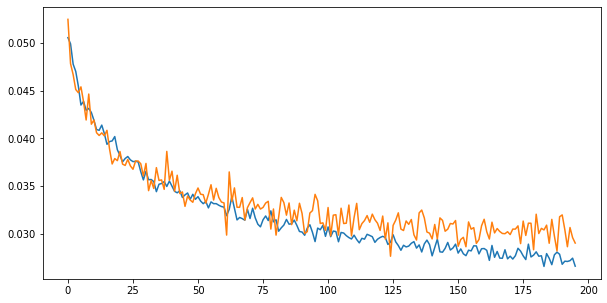

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0305                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

198 of 316
TRAIN LOSS: 0.027797633471588295
VAL LOSS: 0.03076677355501387


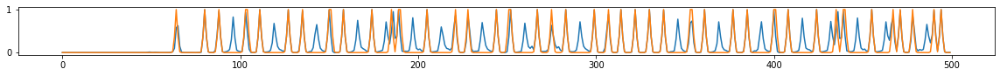

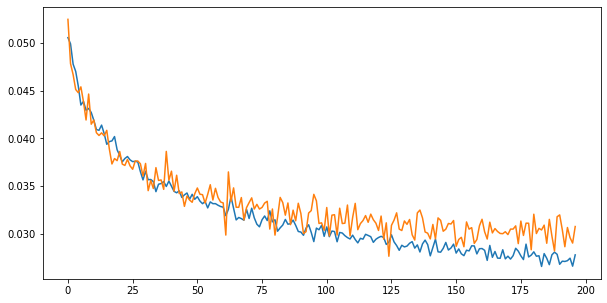

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.21it/s  0.0284                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

199 of 316
TRAIN LOSS: 0.02720653239844574
VAL LOSS: 0.030809958568877645


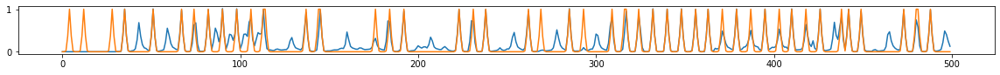

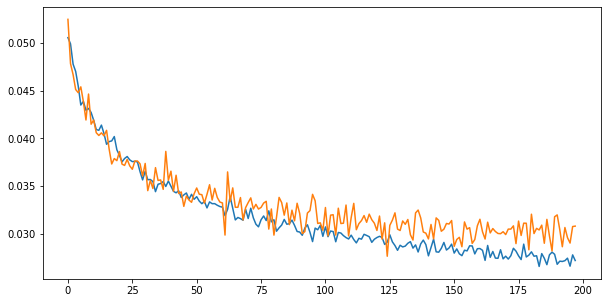

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.18it/s  0.0272                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

200 of 316
TRAIN LOSS: 0.02723494963720441
VAL LOSS: 0.030717244371771812


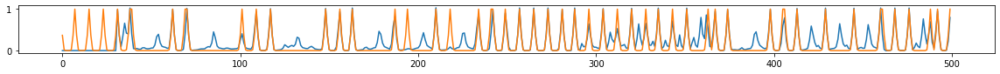

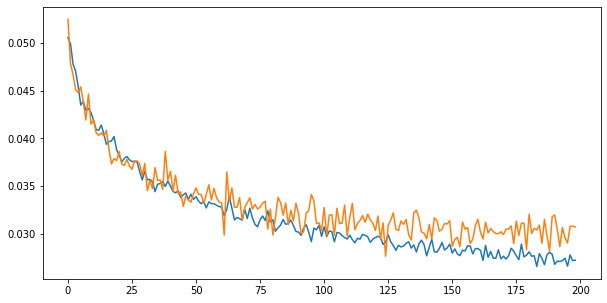

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.20it/s  0.0247                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

201 of 316
TRAIN LOSS: 0.02629429769391815
VAL LOSS: 0.029990444994635053


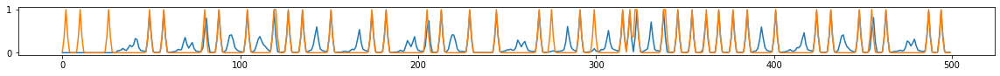

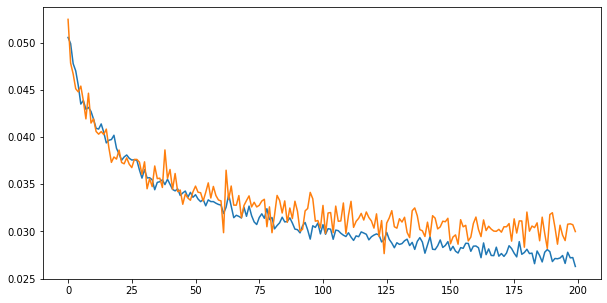

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.15it/s  0.0233                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

202 of 316
TRAIN LOSS: 0.02714957653855284
VAL LOSS: 0.030784451506204076


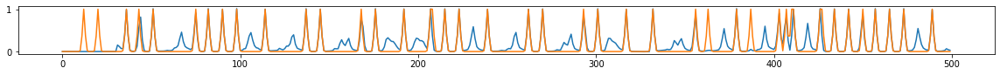

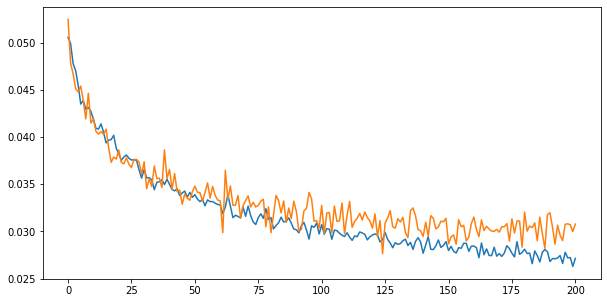

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.17it/s  0.0313                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

203 of 316
TRAIN LOSS: 0.027039511284480493
VAL LOSS: 0.029692349955439568


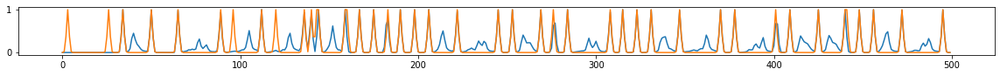

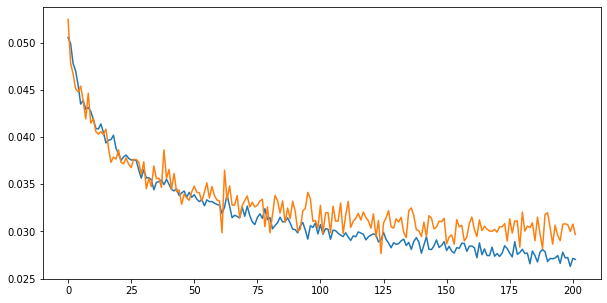

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.11it/s  0.0232                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

204 of 316
TRAIN LOSS: 0.026632703840732574
VAL LOSS: 0.03045520269208484


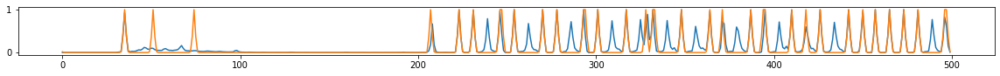

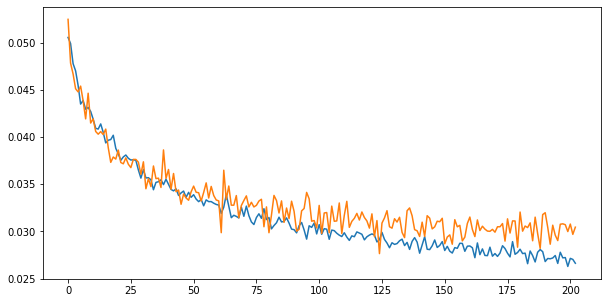

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  6.95it/s  0.0197                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

205 of 316
TRAIN LOSS: 0.027015192434191704
VAL LOSS: 0.030000754735536046


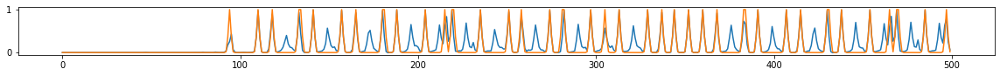

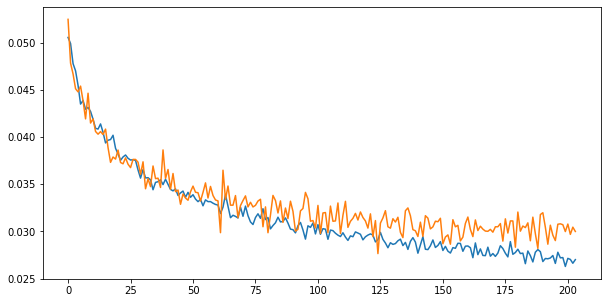

 Iters    Elapsed Time      Speed     loss                                      
 6/36   00:00:00<00:00:04  7.19it/s  0.0264                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

KeyboardInterrupt: 

In [31]:
start = time.time()

epochs = 256
train()

end = time.time()
print(end - start, 'secs')

In [35]:
torch.save(model.state_dict(), model_path)

In [ ]:
n = []